In [1]:
import pandas as pd
import numpy as np
!pip install st_dbscan
from st_dbscan import ST_DBSCAN
from datetime import datetime
import time
import matplotlib.pyplot as plt
import os
import geopandas as gpd
import pandas as pd
from sklearn.cluster import DBSCAN
import seaborn as sns
from itertools import product
from sklearn.preprocessing import MinMaxScaler

# Functions

In [2]:
# Plot the clustering result
def plot(data, labels):
    colors = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c', '#fdbf6f', '#ff7f00', '#cab2d6', '#6a3d9a']
    for i in range(-1, len(set(labels))):
        if i == -1:
            col = [0, 0, 0, 1]
        else:
            col = colors[i % len(colors)]

        clust = data[np.where(labels == i)]
        plt.scatter(clust[:, 1], clust[:, 2], c=[col], s=10)
    plt.show()

In [3]:
def plot_cluster_metric(df, cluster_field, value_field, title):
    """
    Calculate the range of a value field for each cluster, plot its KDE, and return the average range.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        cluster_field (str): The column name representing clusters.
        value_field (str): The column name for the metric to calculate.
        title (str): Title for the plot.

    Returns:
        float: The average range for the metric across clusters.
    """
    df = df[df[cluster_field] != -1]
    
    # Calculate the range for each cluster
    cluster_ranges = df.groupby(cluster_field)[value_field].agg(lambda x: x.max() - x.min())

    # Calculate the average range
    average_range = cluster_ranges.mean()
    max_range = cluster_ranges.max()
    variance = cluster_ranges.var()

    # Plot the KDE of the ranges
    plt.figure(figsize=(8, 6))
    sns.kdeplot(cluster_ranges, fill=True)
    plt.title(title)
    plt.xlabel(f"Range of {value_field}")
    plt.ylabel("Density")
    plt.show()

    return average_range, max_range, variance


In [4]:
def check_claims_grouping(df, st_cluster_fields):
    """
    Analyze disaster grouping for each st_cluster field and merge results to a CSV file.
    
    Parameters:
        df (pd.DataFrame): Input dataframe.
        st_cluster_fields (list): List of column names to analyze.
    
    Returns:
        None
    """
    output_file = 'Clusters/cluster_sensitivities_cl.csv'
    results = []

    for st_cluster in st_cluster_fields:
        print(f"\nAnalyzing st_cluster field: {st_cluster}")

        # Cluster metrics
        avg_duration, max_duration, var_duration = plot_cluster_metric(
            df, st_cluster, "daysSinceStart", 
            f"Distribution of Cluster Durations for {st_cluster}"
        )
        avg_lat_span, max_lat_span, var_lat_span = plot_cluster_metric(
            df, st_cluster, "latitude", 
            f"Distribution of Event Latitude Span for {st_cluster}"
        )
        avg_lon_span, max_lon_span, var_lon_span = plot_cluster_metric(
            df, st_cluster, "longitude", 
            f"Distribution of Event Longitude Span for {st_cluster}"
        )

        # Prepare results for this st_cluster
        results.append({
            'space_thres': st_cluster.split('_')[2],
            'time_thres': st_cluster.split('_')[3],
            'num_thres': st_cluster.split('_')[4],
            'avg_duration': avg_duration,
            'avg_lat_span': avg_lat_span,
            'avg_lon_span': avg_lon_span,
            'max_duration': max_duration,
            'max_lat_span': max_lat_span,
            'max_lon_span': max_lon_span,
            'var_duration': var_duration,
            'var_lat_span': var_lat_span,
            'var_lon_span': var_lon_span,
        })

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results)

    # Ensure column types match before merging
    results_df['space_thres'] = results_df['space_thres'].astype(float).astype(str)
    results_df['time_thres'] = results_df['time_thres'].astype(float).astype(str)
    results_df['num_thres'] = results_df['num_thres'].astype(float).astype(str)

    try:
        existing_df = pd.read_csv(output_file)

        # Ensure matching types for the existing DataFrame
        existing_df['space_thres'] = existing_df['space_thres'].astype(float).astype(str)
        existing_df['time_thres'] = existing_df['time_thres'].astype(float).astype(str)
        existing_df['num_thres'] = existing_df['num_thres'].astype(float).astype(str)

        # Merge the DataFrames
        merged_df = pd.merge(existing_df, results_df, on=['space_thres', 'time_thres', 'num_thres'], how='outer')
    except FileNotFoundError:
        # If the file does not exist, use the new DataFrame directly
        merged_df = results_df

    # Save the merged DataFrame to the CSV file
    merged_df.to_csv(output_file, index=False)

In [5]:
def analyze_cluster_distributions(claims):
    # Step 1: Group by 'st_cluster'
    claims = claims[claims['st_cluster'] != -1]
    
    grouped = claims.groupby('st_cluster')

    # Step 2: Calculate dur_span, lat_span, and lon_span for each cluster
    cluster_stats = grouped.agg(
        dur_span=('daysSinceStart', lambda x: x.max() - x.min()),
        lat_span=('latitude', lambda x: x.max() - x.min()),
        lon_span=('longitude', lambda x: x.max() - x.min())
    ).reset_index()

    # Step 3: Plot KDE distributions for each metric
    metrics = ['dur_span', 'lat_span', 'lon_span']
    for metric in metrics:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(cluster_stats[metric], shade=True, label=f"{metric} distribution")
        median_value = cluster_stats[metric].median()
        plt.axvline(median_value, color='red', linestyle='--', label=f'Median: {median_value:.2f}')
        plt.title(f"KDE Plot for {metric}")
        plt.xlabel(metric)
        plt.ylabel("Density")
        plt.legend()
        plt.show()

    # Step 4: Print max and average for each metric
    for metric in metrics:
        max_value = cluster_stats[metric].max()
        mean_value = cluster_stats[metric].mean()
        max_cluster = cluster_stats.loc[cluster_stats[metric].idxmax(), 'st_cluster']
        print(f"{metric}: Max = {max_value:.2f} (Cluster {max_cluster}), Average = {mean_value:.2f}")

In [6]:
def sensitivity_analysis(claims, space_thres_list, time_thres_list, num_thres_list):
    results = []

    for time_thres in time_thres_list:
        for num_thres in num_thres_list:
            # Step 1: Temporal Clustering
            claims['temporal_cluster'] = -1
            start_time_temp = time.time()
            for county in claims['countyCode'].unique():
                county_data = claims[claims['countyCode'] == county]
                db = DBSCAN(eps=time_thres, min_samples=num_thres, metric='euclidean')
                temporal_labels = db.fit_predict(county_data[['daysSinceStart']])
                claims.loc[county_data.index, 'temporal_cluster'] = temporal_labels
            end_time_temp = time.time()
            print(f"Temporal clustering completed in {end_time_temp - start_time_temp:.2f} seconds.")

            # Pre-compute temporal clusters for efficiency
            temporal_clusters = claims[claims['temporal_cluster'] != -1]
            grouped_clusters = temporal_clusters.groupby(
                ['countyCode', 'temporal_cluster']
            ).agg({
                'latitude': 'median',
                'longitude': 'median',
                'daysSinceStart': 'median'
            }).reset_index()

            for space_thres in space_thres_list:
                # Step 2: Spatio-Temporal Clustering
                start_time_st = time.time()
                data = grouped_clusters[['daysSinceStart', 'latitude', 'longitude']].to_numpy()
                st_dbscan = ST_DBSCAN(eps1=space_thres, eps2=time_thres, min_samples=num_thres)
                st_dbscan.fit(data)
                grouped_clusters[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = st_dbscan.labels
                end_time_st = time.time()
                print(f"Spatio-temporal clustering completed in {end_time_st - start_time_st:.2f} seconds.")

                # Step 3: Map Spatio-Temporal Clusters to Original Claims
                start_time_merge = time.time()
                
                # Get the maximum spatiotemporal cluster label
                max_st_cluster = grouped_clusters[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'].max()
                
                # Identify temporal clusters that are unclustered in spatiotemporal clustering
                unclustered_temporal_clusters = grouped_clusters[
                    grouped_clusters[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] == -1
                ]
                
                # Assign new unique cluster IDs to these unclustered temporal clusters
                unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
                
                # Create a mapping of (countyCode, temporal_cluster) -> new cluster ID
                cluster_mapping = grouped_clusters.set_index(['countyCode', 'temporal_cluster'])[
                    f'st_cluster_{space_thres}_{time_thres}_{num_thres}'
                ].to_dict()
                
                # Add the new clusters for unclustered temporal clusters
                cluster_mapping.update(unclustered_temporal_clusters.set_index(['countyCode', 'temporal_cluster'])['new_cluster'].to_dict())
                
                # Map clusters back to the claims data
                claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(
                    lambda row: cluster_mapping.get((row['countyCode'], row['temporal_cluster']), -1), axis=1
                )
                
                end_time_merge = time.time()
                print(f"Merging clusters completed in {end_time_merge - start_time_merge:.2f} seconds.")

                # Step 4: Summary Statistics
                total_clusters = claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'].max()
                unclustered_percentage = (
                    len(claims[claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] == -1]) /
                    len(claims) * 100
                )
                print(f"Total clusters: {total_clusters}")
                print(f"Percentage of unclustered claims: {unclustered_percentage:.2f}%")
                results.append({
                    'space_thres': space_thres,
                    'time_thres': time_thres,
                    'num_thres': num_thres,
                    'total_clusters': total_clusters,
                    'unclustered_percentage': unclustered_percentage
                })

    return claims, pd.DataFrame(results)

In [7]:
def plot_cluster(cluster_number, column_name, claims_clusters, gdf_counties, gdf_states, extent=[-130, -65, 24, 50]):
    """
    Plots points corresponding to a specific cluster number on a US map.

    Parameters:
        cluster_number (str/int): The cluster number or group to filter by.
        column_name (str): The column name indicating the cluster group in claims_clusters.
        claims_clusters (DataFrame): The DataFrame containing cluster data with latitude and longitude.
        gdf_counties (GeoDataFrame): GeoDataFrame of US counties.
        gdf_states (GeoDataFrame): GeoDataFrame of US states.
        extent (list): The bounding box for the map in [min_lon, max_lon, min_lat, max_lat].

    Returns:
        None: Displays the plot.
    """
    # Filter for points in the specified cluster
    cluster_points = claims_clusters[claims_clusters[column_name] == cluster_number]

    # Create a GeoDataFrame for the points
    gdf_points = gpd.GeoDataFrame(
        cluster_points,
        geometry=gpd.points_from_xy(cluster_points['longitude'], cluster_points['latitude']),
        crs="EPSG:4326"
    )

    # Plot the map
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))

    # Plot counties and states
    gdf_counties.plot(ax=ax, color='lightgray', edgecolor='gray', alpha=0.5)
    gdf_states.boundary.plot(ax=ax, color='black', linewidth=0.5)

    # Plot the cluster points
    gdf_points.plot(ax=ax, color='red', markersize=3, label=f'Cluster {cluster_number}')

    ax.set_xlim(extent[0], extent[1])
    ax.set_ylim(extent[2], extent[3])
    ax.axis('off')

    # Add legend and labels
    plt.legend()
    plt.title(f"Points for Cluster {cluster_number} on US Map")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()

# Clustering Params

In [8]:
space_thres_list = [0.5, 1, 2, 3, 4]
time_thres_list = [3, 5, 7, 14, 30]
num_thres_list = [3, 5, 7, 10]

# Create a folder for temporary files
temp_folder = "Clusters"
os.makedirs(temp_folder, exist_ok=True)

# Claims Data Load

In [9]:
claims = pd.read_csv("final_filtered_claims.csv")

/tmp/ipykernel_5339/3102057483.py:1: DtypeWarning: Columns (8,36,39,43,52,53,62) have mixed types. Specify dtype option on import or set low_memory=False.
  claims = pd.read_csv("final_filtered_claims.csv")


In [10]:
# Step 1: Preprocess 'dateOfLoss' to numeric days
claims['dateOfLoss'] = pd.to_datetime(claims['dateOfLoss'])
origin_date = claims['dateOfLoss'].min()
claims['daysSinceStart'] = (claims['dateOfLoss'] - origin_date).dt.days
claims['date'] = pd.to_datetime(claims['daysSinceStart'], unit='D', origin=origin_date)

# Create a unique index for each row
claims['index'] = claims.index

# Ensure that 'countyCode' is properly formatted as a 5-character string
claims['countyCode'] = claims['countyCode'].astype(int).astype(str)
claims['countyCode'] = claims['countyCode'].apply(lambda x: str(x).zfill(5))

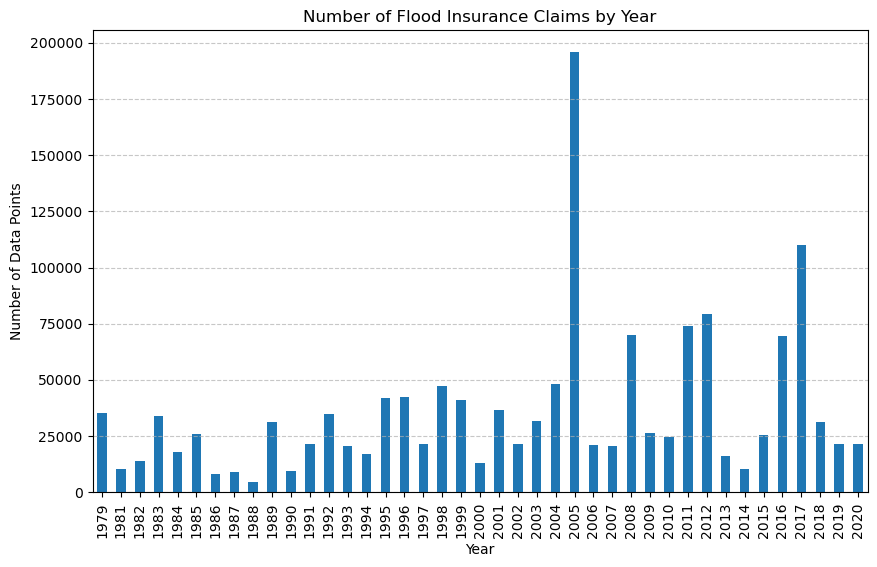

In [11]:
# Group the data by year and count the number of entries
claims['year'] = claims['date'].dt.year
data_points_per_year = claims.groupby('year').size()

# Plot the number of data points by year
plt.figure(figsize=(10, 6))
data_points_per_year.plot(kind='bar')
plt.title('Number of Flood Insurance Claims by Year')
plt.xlabel('Year')
plt.ylabel('Number of Data Points')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [12]:
# Define the bounds for the contiguous US
bounds = {
    "min_lon": -130,
    "max_lon": -65,
    "min_lat": 24,
    "max_lat": 50
}

# Filter the DataFrame
claims = claims.dropna(subset=['latitude', 'longitude']).loc[
    (claims['longitude'] >= bounds["min_lon"]) &
    (claims['longitude'] <= bounds["max_lon"]) &
    (claims['latitude'] >= bounds["min_lat"]) &
    (claims['latitude'] <= bounds["max_lat"])
]

In [13]:
claims, sensitivities = sensitivity_analysis(claims, space_thres_list, time_thres_list, num_thres_list)

Temporal clustering completed in 273.42 seconds.
Spatio-temporal clustering completed in 0.45 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 13.47 seconds.
Total clusters: 18658
Percentage of unclustered claims: 3.94%
Spatio-temporal clustering completed in 0.62 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 13.59 seconds.
Total clusters: 13404
Percentage of unclustered claims: 3.94%
Spatio-temporal clustering completed in 1.01 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 13.53 seconds.
Total clusters: 9205
Percentage of unclustered claims: 3.94%
Spatio-temporal clustering completed in 1.47 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 13.59 seconds.
Total clusters: 7027
Percentage of unclustered claims: 3.94%
Spatio-temporal clustering completed in 2.01 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 13.66 seconds.
Total clusters: 5871
Percentage of unclustered claims: 3.94%
Temporal clustering completed in 265.15 seconds.
Spatio-temporal clustering completed in 5.60 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.45 seconds.
Total clusters: 12473
Percentage of unclustered claims: 5.70%
Spatio-temporal clustering completed in 5.89 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.60 seconds.
Total clusters: 8276
Percentage of unclustered claims: 5.70%
Spatio-temporal clustering completed in 6.06 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.52 seconds.
Total clusters: 6091
Percentage of unclustered claims: 5.70%
Spatio-temporal clustering completed in 6.09 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.75 seconds.
Total clusters: 5167
Percentage of unclustered claims: 5.70%
Spatio-temporal clustering completed in 6.12 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.70 seconds.
Total clusters: 4562
Percentage of unclustered claims: 5.70%
Temporal clustering completed in 281.69 seconds.
Spatio-temporal clustering completed in 3.36 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.69 seconds.
Total clusters: 11085
Percentage of unclustered claims: 6.98%
Spatio-temporal clustering completed in 3.55 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.99 seconds.
Total clusters: 7848
Percentage of unclustered claims: 6.98%
Spatio-temporal clustering completed in 3.65 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.85 seconds.
Total clusters: 5856
Percentage of unclustered claims: 6.98%
Spatio-temporal clustering completed in 3.68 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.78 seconds.
Total clusters: 5138
Percentage of unclustered claims: 6.98%
Spatio-temporal clustering completed in 3.72 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.87 seconds.
Total clusters: 4701
Percentage of unclustered claims: 6.98%
Temporal clustering completed in 278.89 seconds.
Spatio-temporal clustering completed in 1.91 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.88 seconds.
Total clusters: 9137
Percentage of unclustered claims: 8.53%
Spatio-temporal clustering completed in 1.93 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.00 seconds.
Total clusters: 7421
Percentage of unclustered claims: 8.53%
Spatio-temporal clustering completed in 2.00 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.00 seconds.
Total clusters: 5558
Percentage of unclustered claims: 8.53%
Spatio-temporal clustering completed in 2.02 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.92 seconds.
Total clusters: 4939
Percentage of unclustered claims: 8.53%
Spatio-temporal clustering completed in 2.05 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 14.98 seconds.
Total clusters: 4624
Percentage of unclustered claims: 8.53%
Temporal clustering completed in 283.15 seconds.
Spatio-temporal clustering completed in 0.47 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.11 seconds.
Total clusters: 18006
Percentage of unclustered claims: 3.53%
Spatio-temporal clustering completed in 0.65 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.33 seconds.
Total clusters: 12405
Percentage of unclustered claims: 3.53%
Spatio-temporal clustering completed in 1.11 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.25 seconds.
Total clusters: 7990
Percentage of unclustered claims: 3.53%
Spatio-temporal clustering completed in 1.68 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.46 seconds.
Total clusters: 5912
Percentage of unclustered claims: 3.53%
Spatio-temporal clustering completed in 2.40 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.51 seconds.
Total clusters: 4739
Percentage of unclustered claims: 3.53%
Temporal clustering completed in 283.64 seconds.
Spatio-temporal clustering completed in 6.33 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.20 seconds.
Total clusters: 12379
Percentage of unclustered claims: 5.21%
Spatio-temporal clustering completed in 6.20 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.73 seconds.
Total clusters: 7900
Percentage of unclustered claims: 5.21%
Spatio-temporal clustering completed in 6.27 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.56 seconds.
Total clusters: 5588
Percentage of unclustered claims: 5.21%
Spatio-temporal clustering completed in 6.34 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.55 seconds.
Total clusters: 4578
Percentage of unclustered claims: 5.21%
Spatio-temporal clustering completed in 6.31 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.57 seconds.
Total clusters: 3921
Percentage of unclustered claims: 5.21%
Temporal clustering completed in 282.08 seconds.
Spatio-temporal clustering completed in 3.38 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.43 seconds.
Total clusters: 11125
Percentage of unclustered claims: 6.46%
Spatio-temporal clustering completed in 3.50 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.61 seconds.
Total clusters: 7744
Percentage of unclustered claims: 6.46%
Spatio-temporal clustering completed in 3.67 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.55 seconds.
Total clusters: 5564
Percentage of unclustered claims: 6.46%
Spatio-temporal clustering completed in 3.71 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.59 seconds.
Total clusters: 4764
Percentage of unclustered claims: 6.46%
Spatio-temporal clustering completed in 3.76 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.66 seconds.
Total clusters: 4227
Percentage of unclustered claims: 6.46%
Temporal clustering completed in 281.54 seconds.
Spatio-temporal clustering completed in 1.96 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.70 seconds.
Total clusters: 9201
Percentage of unclustered claims: 7.94%
Spatio-temporal clustering completed in 1.98 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.71 seconds.
Total clusters: 7396
Percentage of unclustered claims: 7.94%
Spatio-temporal clustering completed in 2.09 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.74 seconds.
Total clusters: 5390
Percentage of unclustered claims: 7.94%
Spatio-temporal clustering completed in 2.17 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.92 seconds.
Total clusters: 4675
Percentage of unclustered claims: 7.94%
Spatio-temporal clustering completed in 2.15 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.87 seconds.
Total clusters: 4248
Percentage of unclustered claims: 7.94%
Temporal clustering completed in 282.22 seconds.
Spatio-temporal clustering completed in 0.48 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.95 seconds.
Total clusters: 17450
Percentage of unclustered claims: 3.25%
Spatio-temporal clustering completed in 0.68 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.88 seconds.
Total clusters: 11625
Percentage of unclustered claims: 3.25%
Spatio-temporal clustering completed in 1.16 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.12 seconds.
Total clusters: 7098
Percentage of unclustered claims: 3.25%
Spatio-temporal clustering completed in 1.79 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.15 seconds.
Total clusters: 5010
Percentage of unclustered claims: 3.25%
Spatio-temporal clustering completed in 2.55 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.04 seconds.
Total clusters: 3917
Percentage of unclustered claims: 3.25%
Temporal clustering completed in 280.09 seconds.
Spatio-temporal clustering completed in 5.58 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 15.97 seconds.
Total clusters: 12202
Percentage of unclustered claims: 4.88%
Spatio-temporal clustering completed in 5.84 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.07 seconds.
Total clusters: 7631
Percentage of unclustered claims: 4.88%
Spatio-temporal clustering completed in 6.06 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.02 seconds.
Total clusters: 5215
Percentage of unclustered claims: 4.88%
Spatio-temporal clustering completed in 6.15 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.11 seconds.
Total clusters: 4172
Percentage of unclustered claims: 4.88%
Spatio-temporal clustering completed in 6.17 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.17 seconds.
Total clusters: 3489
Percentage of unclustered claims: 4.88%
Temporal clustering completed in 279.38 seconds.
Spatio-temporal clustering completed in 3.27 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.20 seconds.
Total clusters: 11068
Percentage of unclustered claims: 6.10%
Spatio-temporal clustering completed in 3.40 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.22 seconds.
Total clusters: 7550
Percentage of unclustered claims: 6.10%
Spatio-temporal clustering completed in 3.55 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.22 seconds.
Total clusters: 5298
Percentage of unclustered claims: 6.10%
Spatio-temporal clustering completed in 3.60 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.29 seconds.
Total clusters: 4457
Percentage of unclustered claims: 6.10%
Spatio-temporal clustering completed in 3.64 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.28 seconds.
Total clusters: 3920
Percentage of unclustered claims: 6.10%
Temporal clustering completed in 279.07 seconds.
Spatio-temporal clustering completed in 1.92 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.29 seconds.
Total clusters: 9201
Percentage of unclustered claims: 7.55%
Spatio-temporal clustering completed in 1.93 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.40 seconds.
Total clusters: 7321
Percentage of unclustered claims: 7.55%
Spatio-temporal clustering completed in 2.00 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.42 seconds.
Total clusters: 5229
Percentage of unclustered claims: 7.55%
Spatio-temporal clustering completed in 2.04 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.44 seconds.
Total clusters: 4432
Percentage of unclustered claims: 7.55%
Spatio-temporal clustering completed in 2.12 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.49 seconds.
Total clusters: 3989
Percentage of unclustered claims: 7.55%
Temporal clustering completed in 278.46 seconds.
Spatio-temporal clustering completed in 0.54 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.67 seconds.
Total clusters: 16299
Percentage of unclustered claims: 2.75%
Spatio-temporal clustering completed in 0.78 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.75 seconds.
Total clusters: 10037
Percentage of unclustered claims: 2.75%
Spatio-temporal clustering completed in 1.42 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.66 seconds.
Total clusters: 5343
Percentage of unclustered claims: 2.75%
Spatio-temporal clustering completed in 2.24 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.71 seconds.
Total clusters: 3426
Percentage of unclustered claims: 2.75%
Spatio-temporal clustering completed in 3.27 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.09 seconds.
Total clusters: 2409
Percentage of unclustered claims: 2.75%
Temporal clustering completed in 278.68 seconds.
Spatio-temporal clustering completed in 5.43 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.07 seconds.
Total clusters: 11936
Percentage of unclustered claims: 4.28%
Spatio-temporal clustering completed in 5.84 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 16.93 seconds.
Total clusters: 7038
Percentage of unclustered claims: 4.28%
Spatio-temporal clustering completed in 6.01 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.00 seconds.
Total clusters: 4359
Percentage of unclustered claims: 4.28%
Spatio-temporal clustering completed in 6.19 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.10 seconds.
Total clusters: 3172
Percentage of unclustered claims: 4.28%
Spatio-temporal clustering completed in 6.13 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.17 seconds.
Total clusters: 2453
Percentage of unclustered claims: 4.28%
Temporal clustering completed in 279.36 seconds.
Spatio-temporal clustering completed in 3.29 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.00 seconds.
Total clusters: 10920
Percentage of unclustered claims: 5.46%
Spatio-temporal clustering completed in 3.45 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.07 seconds.
Total clusters: 7239
Percentage of unclustered claims: 5.46%
Spatio-temporal clustering completed in 3.59 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.39 seconds.
Total clusters: 4687
Percentage of unclustered claims: 5.46%
Spatio-temporal clustering completed in 3.63 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.14 seconds.
Total clusters: 3612
Percentage of unclustered claims: 5.46%
Spatio-temporal clustering completed in 3.73 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.18 seconds.
Total clusters: 2963
Percentage of unclustered claims: 5.46%
Temporal clustering completed in 279.23 seconds.
Spatio-temporal clustering completed in 1.93 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.19 seconds.
Total clusters: 9182
Percentage of unclustered claims: 6.86%
Spatio-temporal clustering completed in 1.96 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.19 seconds.
Total clusters: 7083
Percentage of unclustered claims: 6.86%
Spatio-temporal clustering completed in 2.03 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.63 seconds.
Total clusters: 4865
Percentage of unclustered claims: 6.86%
Spatio-temporal clustering completed in 2.15 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.32 seconds.
Total clusters: 3911
Percentage of unclustered claims: 6.86%
Spatio-temporal clustering completed in 2.16 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.37 seconds.
Total clusters: 3288
Percentage of unclustered claims: 6.86%
Temporal clustering completed in 279.85 seconds.
Spatio-temporal clustering completed in 0.60 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.44 seconds.
Total clusters: 14714
Percentage of unclustered claims: 2.24%
Spatio-temporal clustering completed in 0.93 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.36 seconds.
Total clusters: 7861
Percentage of unclustered claims: 2.24%
Spatio-temporal clustering completed in 1.81 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.45 seconds.
Total clusters: 3308
Percentage of unclustered claims: 2.24%
Spatio-temporal clustering completed in 2.97 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.70 seconds.
Total clusters: 1808
Percentage of unclustered claims: 2.24%
Spatio-temporal clustering completed in 4.37 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.79 seconds.
Total clusters: 1078
Percentage of unclustered claims: 2.24%
Temporal clustering completed in 279.55 seconds.
Spatio-temporal clustering completed in 4.62 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.67 seconds.
Total clusters: 11354
Percentage of unclustered claims: 3.64%
Spatio-temporal clustering completed in 5.05 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.71 seconds.
Total clusters: 6112
Percentage of unclustered claims: 3.64%
Spatio-temporal clustering completed in 5.26 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.72 seconds.
Total clusters: 3139
Percentage of unclustered claims: 3.64%
Spatio-temporal clustering completed in 5.35 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


Merging clusters completed in 17.72 seconds.
Total clusters: 1873
Percentage of unclustered claims: 3.64%
Spatio-temporal clustering completed in 5.36 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 17.89 seconds.
Total clusters: 1240
Percentage of unclustered claims: 3.64%
Temporal clustering completed in 279.44 seconds.
Spatio-temporal clustering completed in 3.12 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 17.78 seconds.
Total clusters: 10673
Percentage of unclustered claims: 4.75%
Spatio-temporal clustering completed in 3.33 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 17.92 seconds.
Total clusters: 6554
Percentage of unclustered claims: 4.75%
Spatio-temporal clustering completed in 3.43 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 17.82 seconds.
Total clusters: 3669
Percentage of unclustered claims: 4.75%
Spatio-temporal clustering completed in 3.48 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 17.81 seconds.
Total clusters: 2443
Percentage of unclustered claims: 4.75%
Spatio-temporal clustering completed in 3.51 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 18.00 seconds.
Total clusters: 1794
Percentage of unclustered claims: 4.75%
Temporal clustering completed in 279.65 seconds.
Spatio-temporal clustering completed in 1.86 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 17.92 seconds.
Total clusters: 9136
Percentage of unclustered claims: 6.08%
Spatio-temporal clustering completed in 1.91 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 18.18 seconds.
Total clusters: 6817
Percentage of unclustered claims: 6.08%
Spatio-temporal clustering completed in 1.97 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 18.22 seconds.
Total clusters: 4173
Percentage of unclustered claims: 6.08%
Spatio-temporal clustering completed in 2.07 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 18.14 seconds.
Total clusters: 2987
Percentage of unclustered claims: 6.08%
Spatio-temporal clustering completed in 2.08 seconds.


/tmp/ipykernel_5339/566491758.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))
/tmp/ipykernel_5339/566491758.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  claims[f'st_cluster_{space_thres}_{time_thres}_{num_thres}'] = claims.apply(


Merging clusters completed in 18.13 seconds.
Total clusters: 2241
Percentage of unclustered claims: 6.08%


In [14]:
# Save the result
sensitivities.to_csv(f'{temp_folder}/cluster_sensitivities_cl.csv', index=False)

In [15]:
claims.to_csv(f"{temp_folder}/clustered_claims_sensitivity.csv", index=False)

In [16]:
claims = pd.read_csv(f"{temp_folder}/clustered_claims_sensitivity.csv")

/tmp/ipykernel_5339/3508883117.py:1: DtypeWarning: Columns (8,33,36,39,43,52,53,62) have mixed types. Specify dtype option on import or set low_memory=False.
  claims = pd.read_csv(f"{temp_folder}/clustered_claims_sensitivity.csv")


In [17]:
# Generate the list of column names
st_cluster_fields = [
    f"st_cluster_{space}_{time}_{num}" 
    for space, time, num in product(space_thres_list, time_thres_list, num_thres_list)
]


Analyzing st_cluster field: st_cluster_0.5_3_3


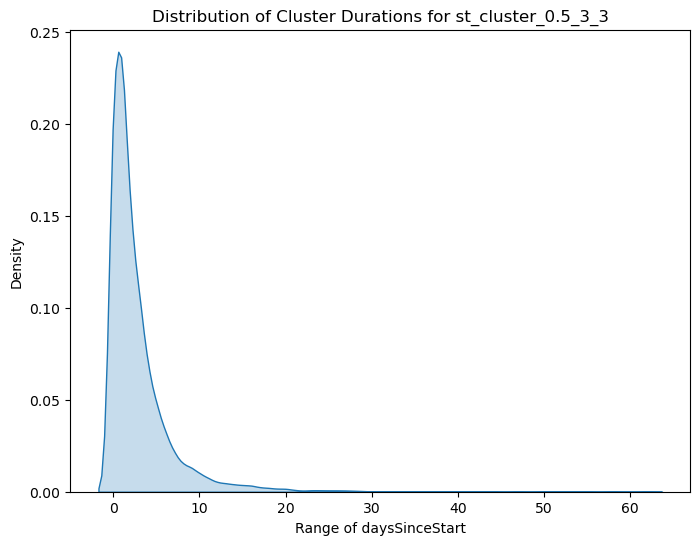

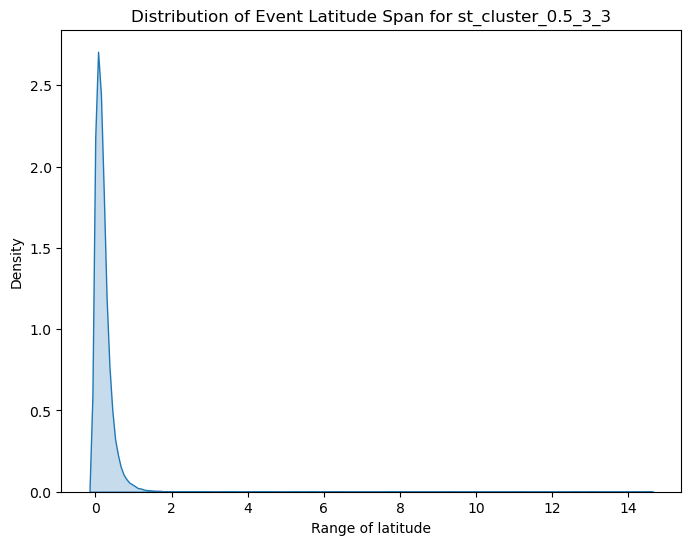

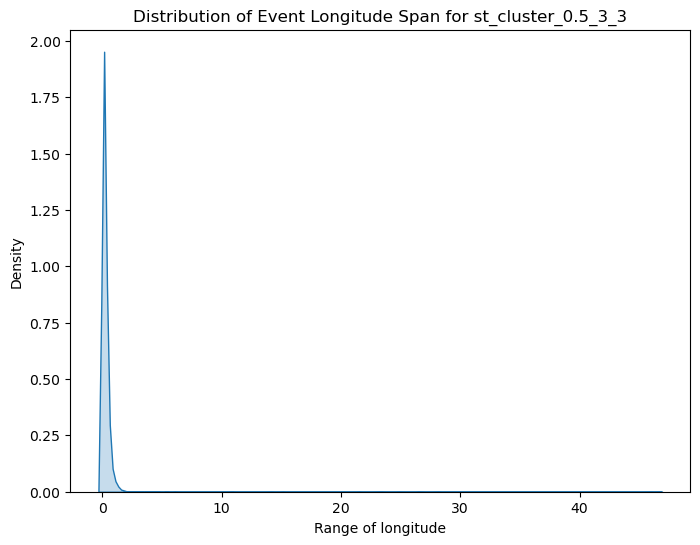


Analyzing st_cluster field: st_cluster_0.5_3_5


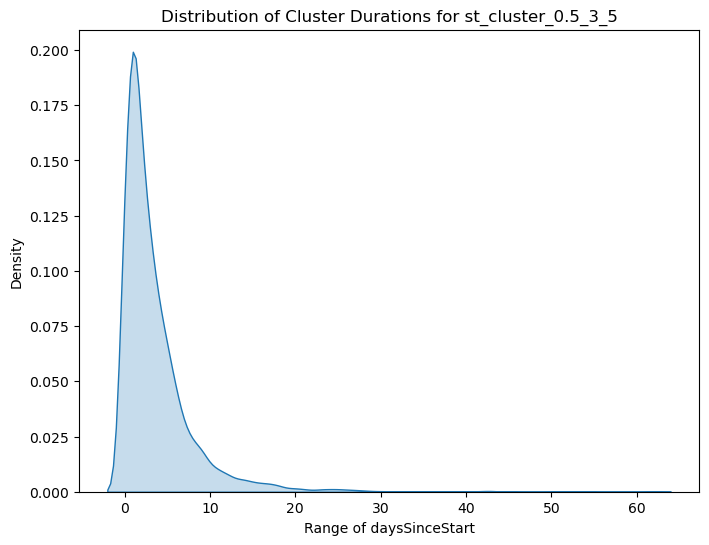

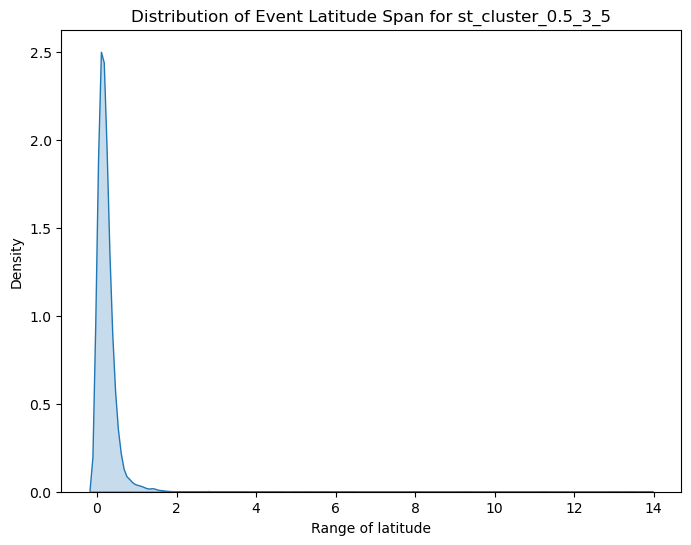

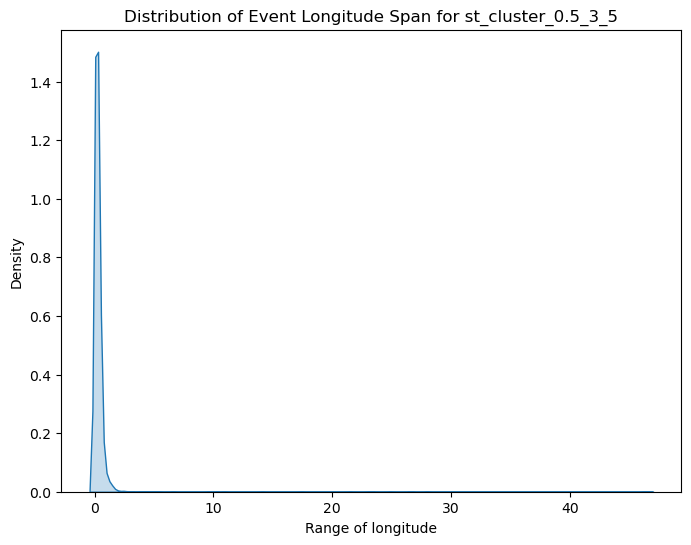


Analyzing st_cluster field: st_cluster_0.5_3_7


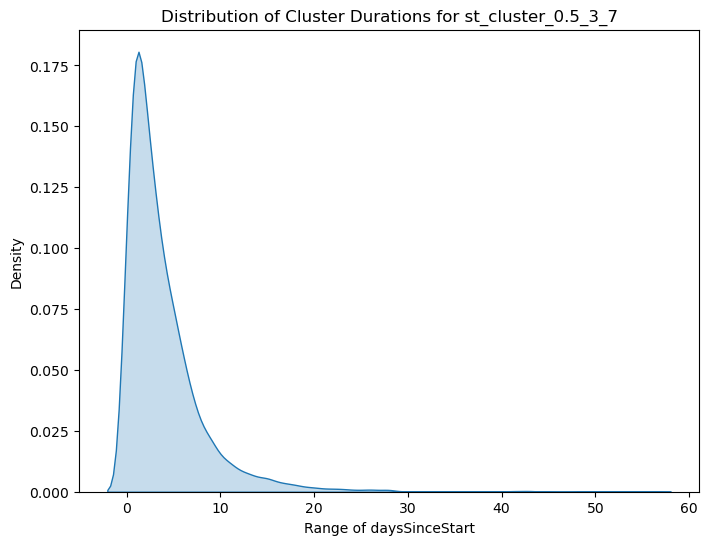

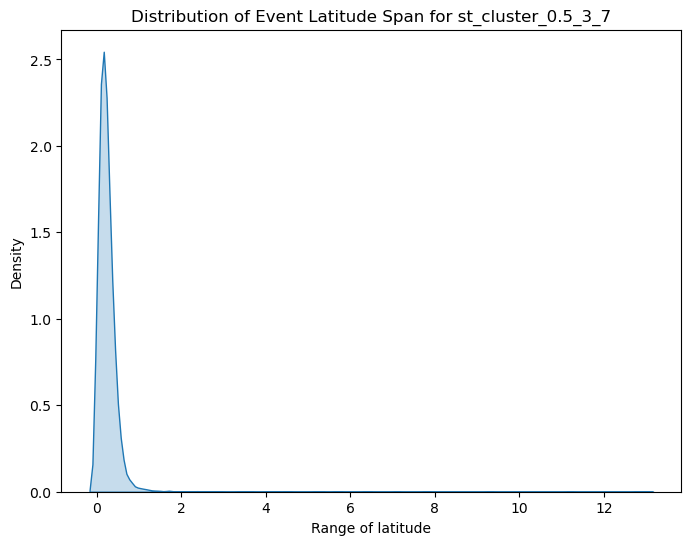

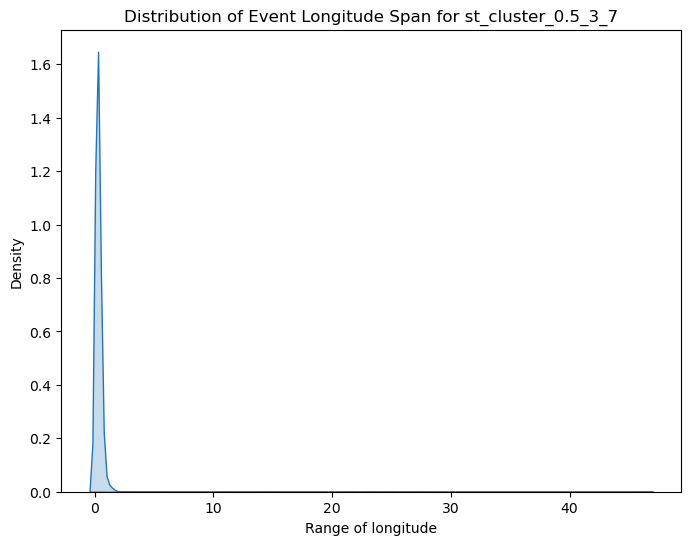


Analyzing st_cluster field: st_cluster_0.5_3_10


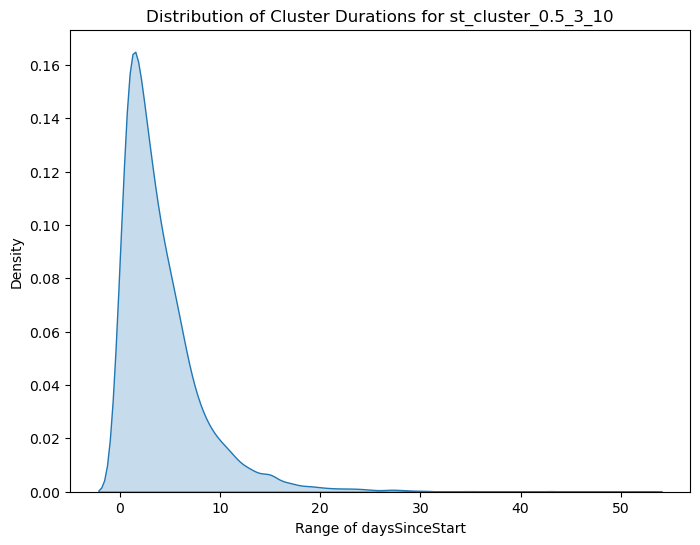

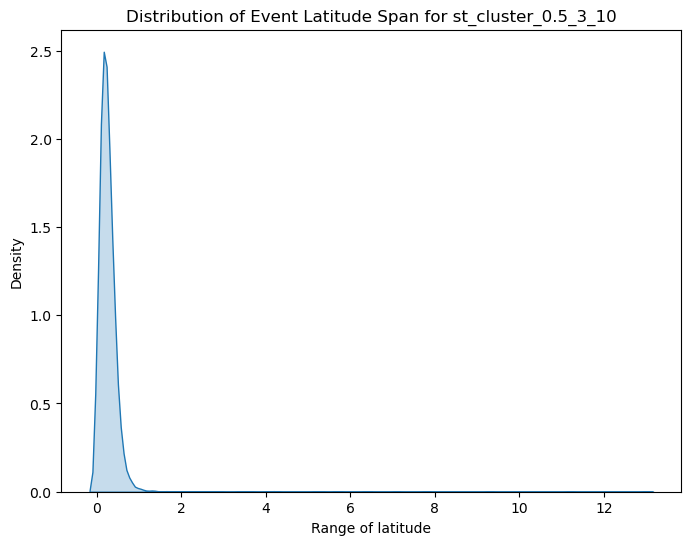

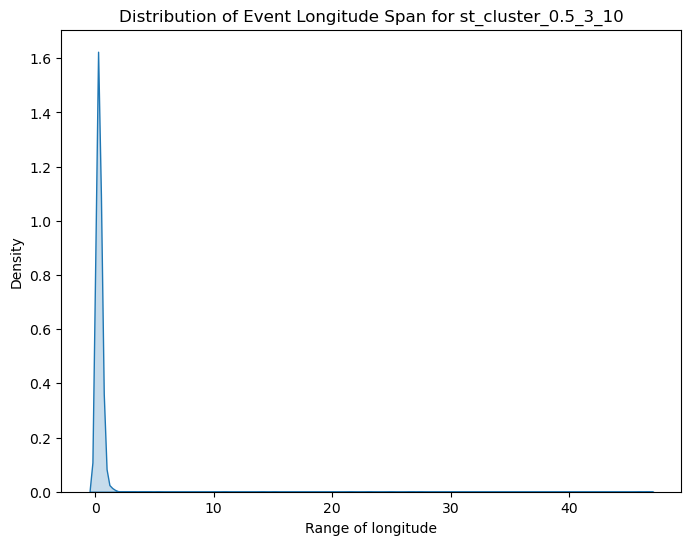


Analyzing st_cluster field: st_cluster_0.5_5_3


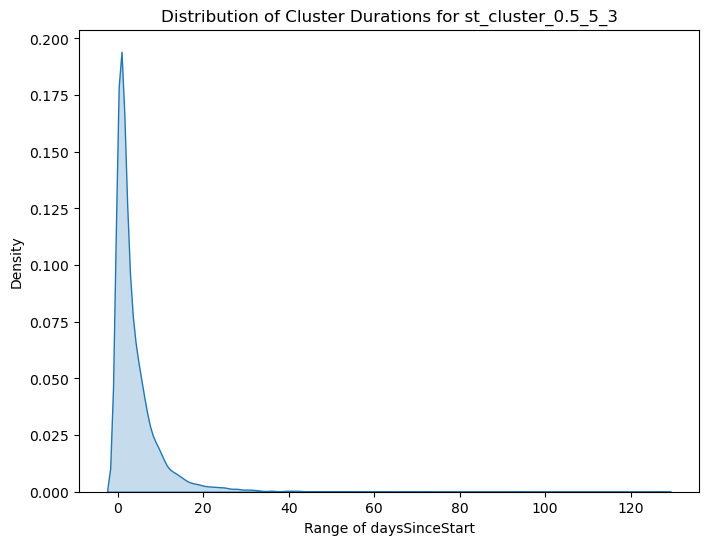

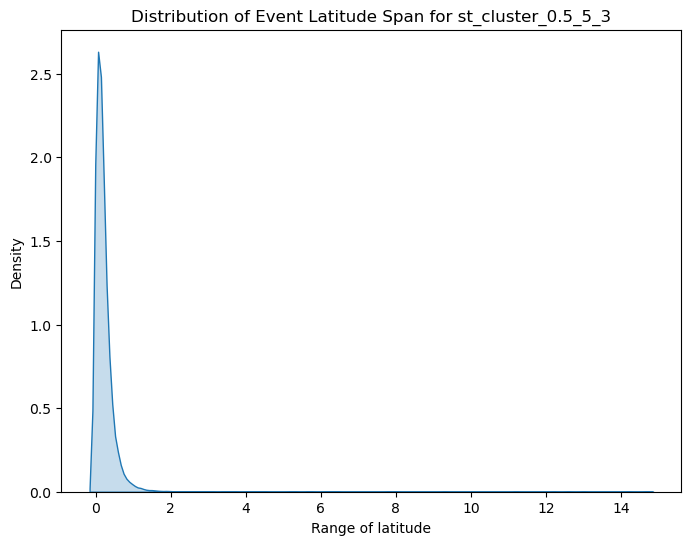

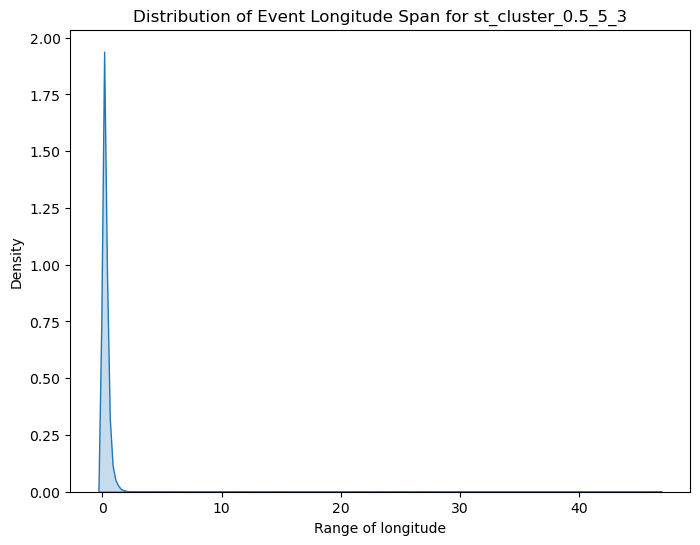


Analyzing st_cluster field: st_cluster_0.5_5_5


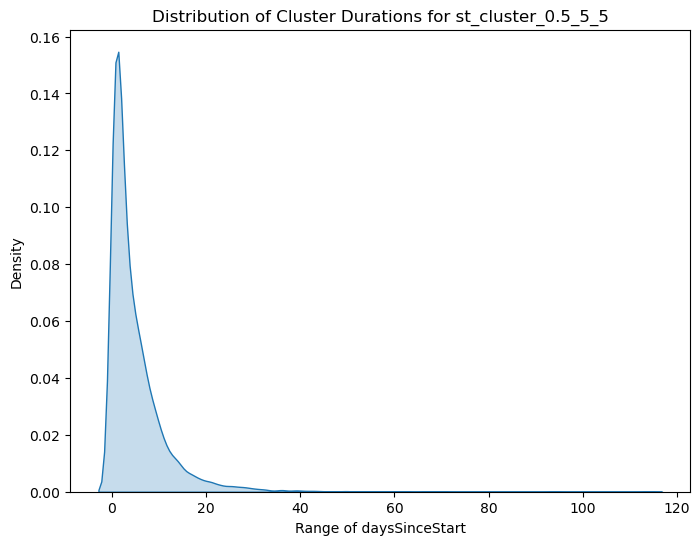

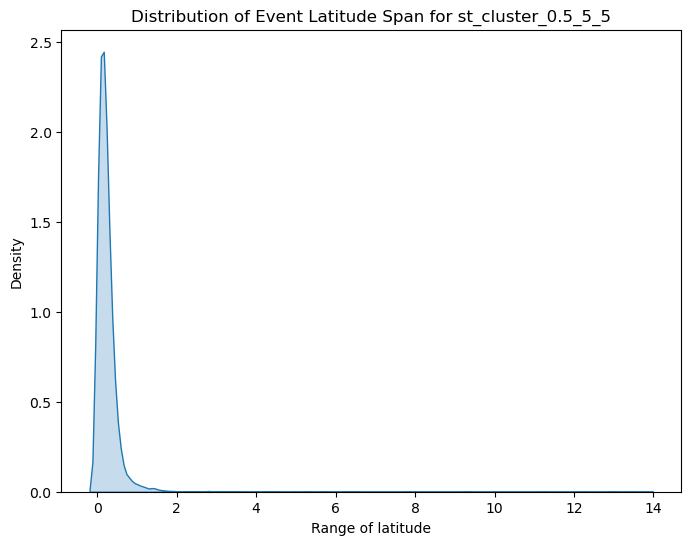

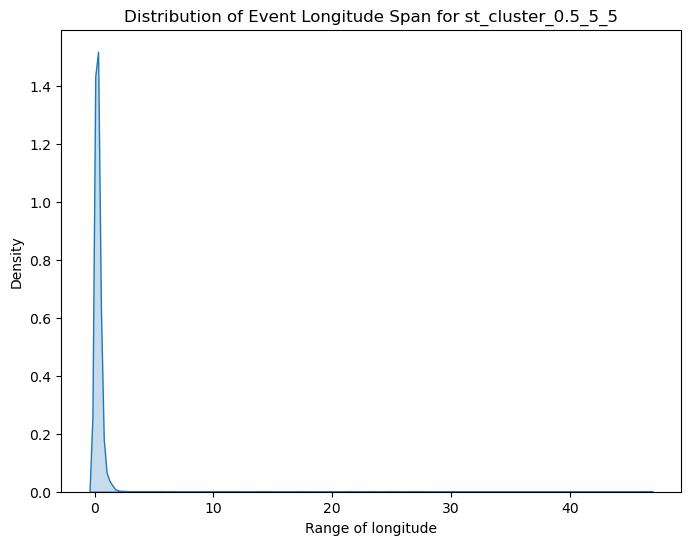


Analyzing st_cluster field: st_cluster_0.5_5_7


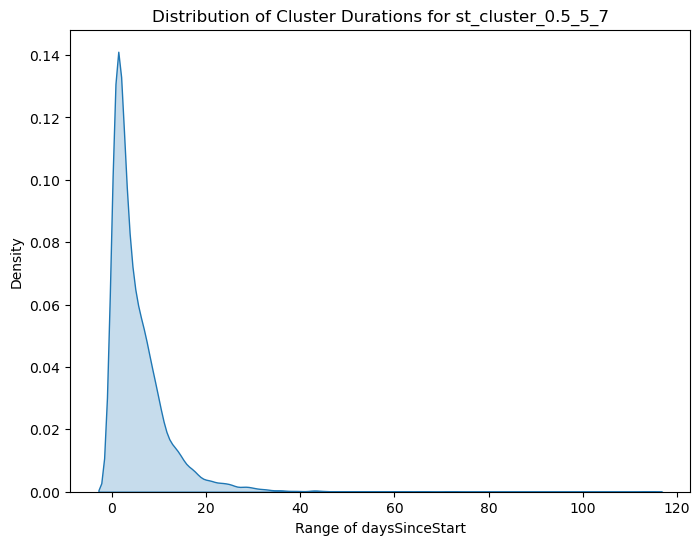

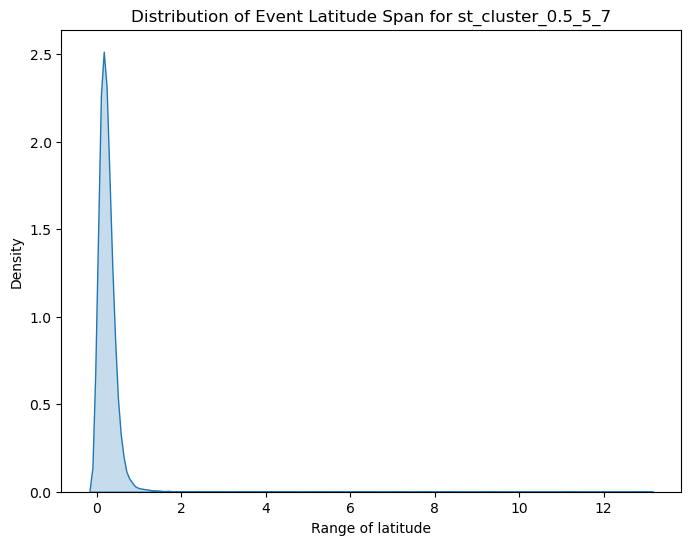

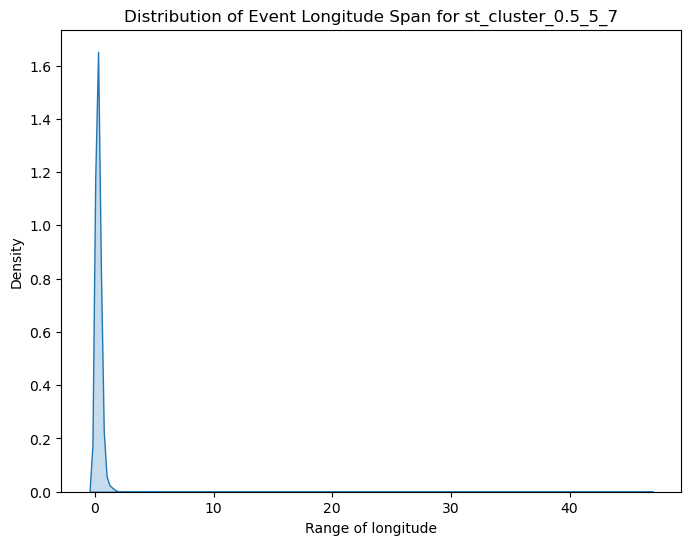


Analyzing st_cluster field: st_cluster_0.5_5_10


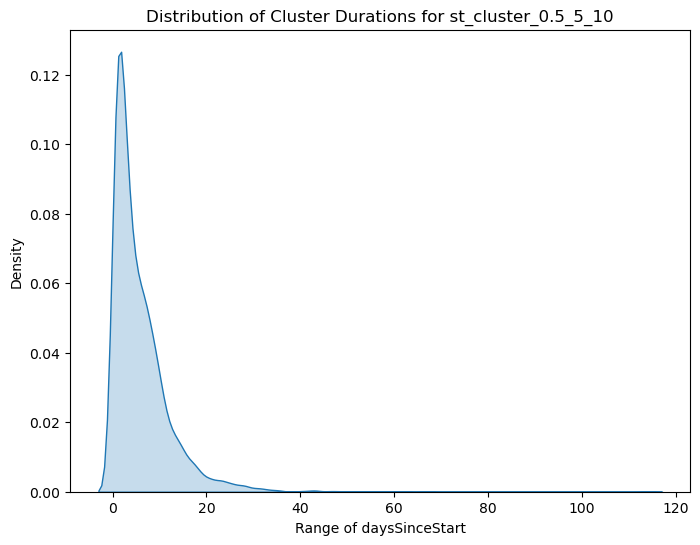

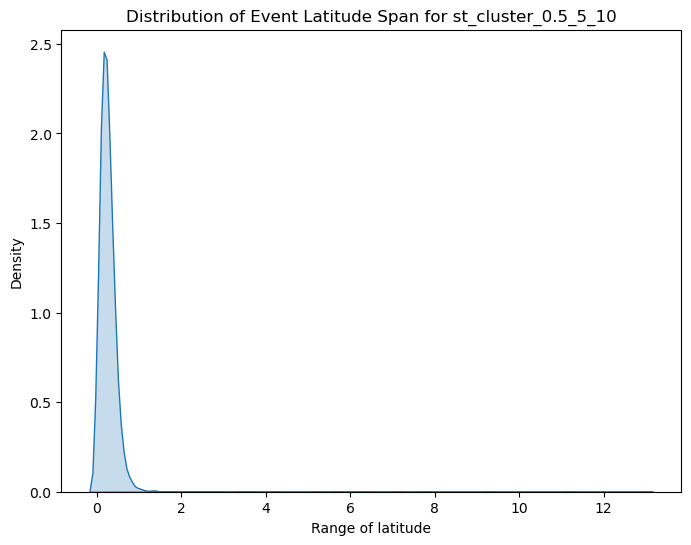

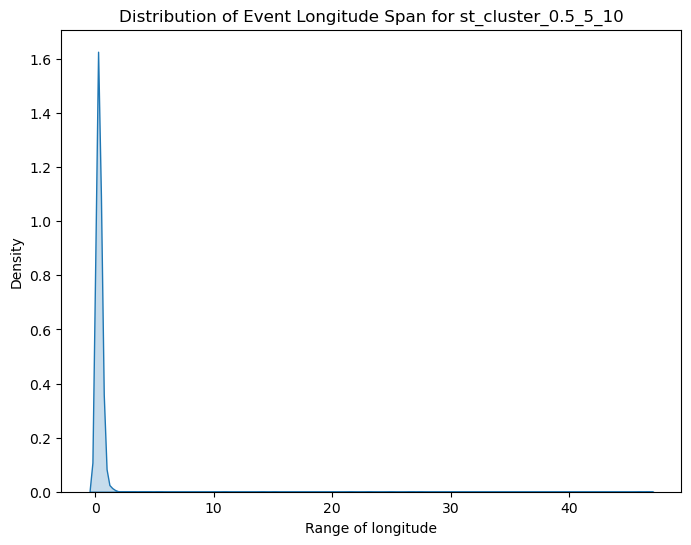


Analyzing st_cluster field: st_cluster_0.5_7_3


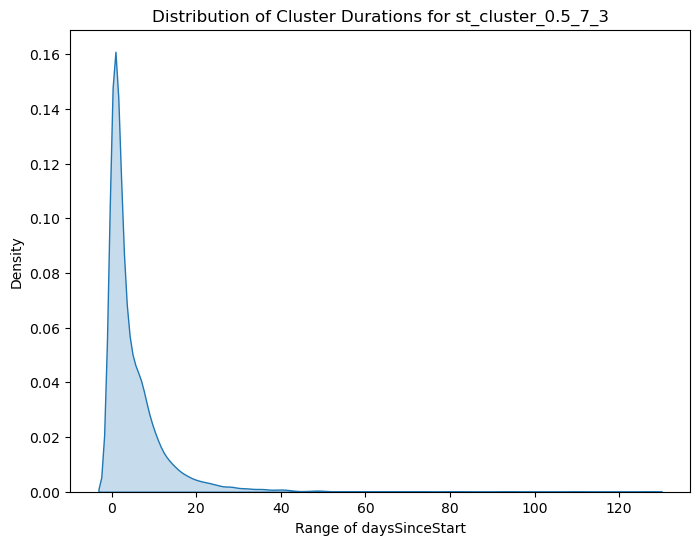

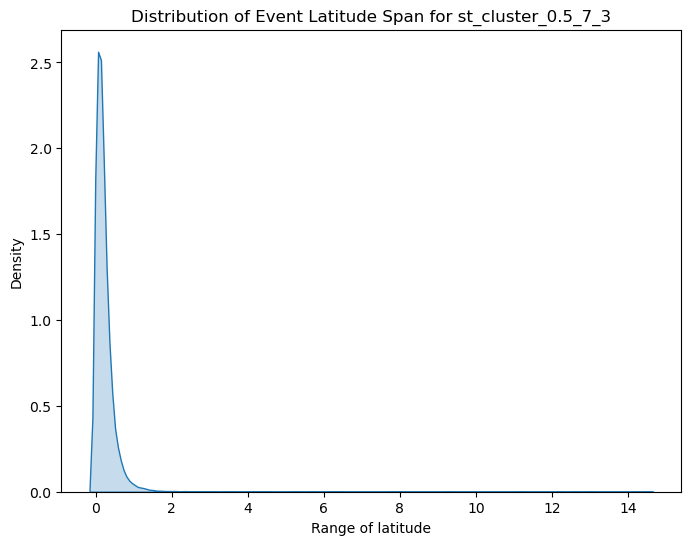

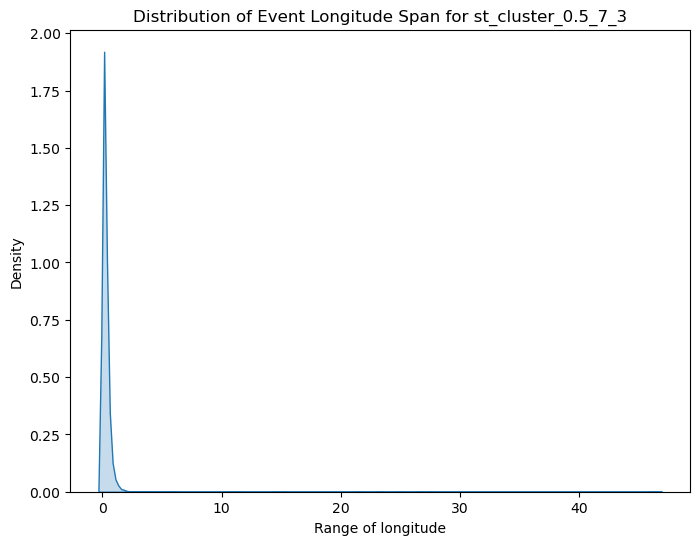


Analyzing st_cluster field: st_cluster_0.5_7_5


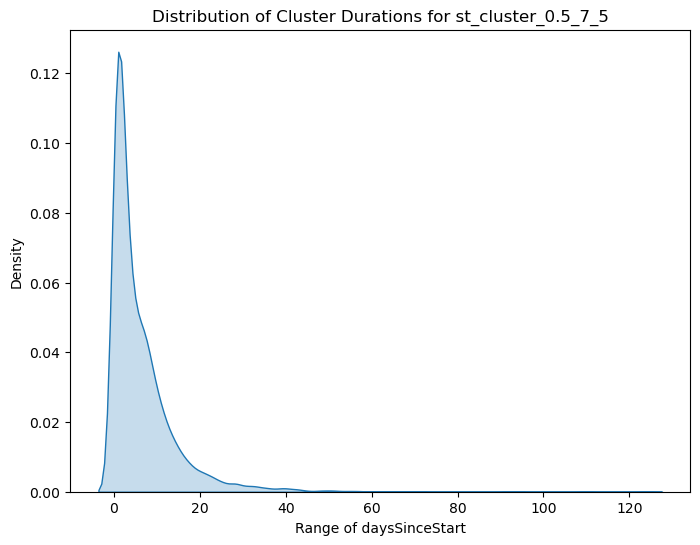

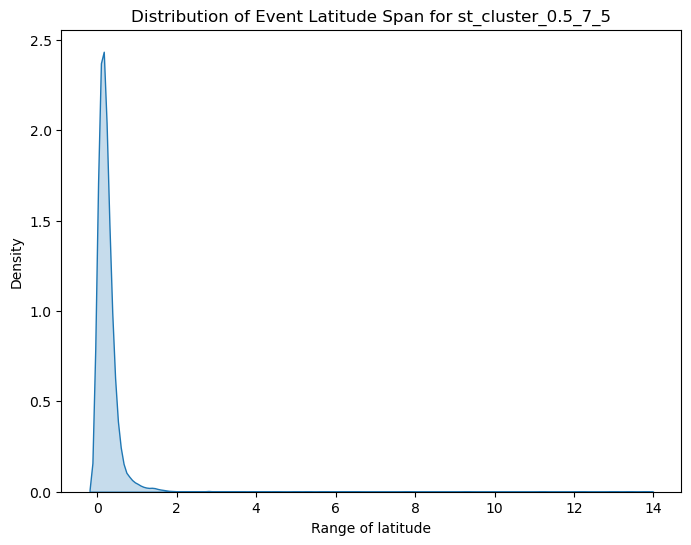

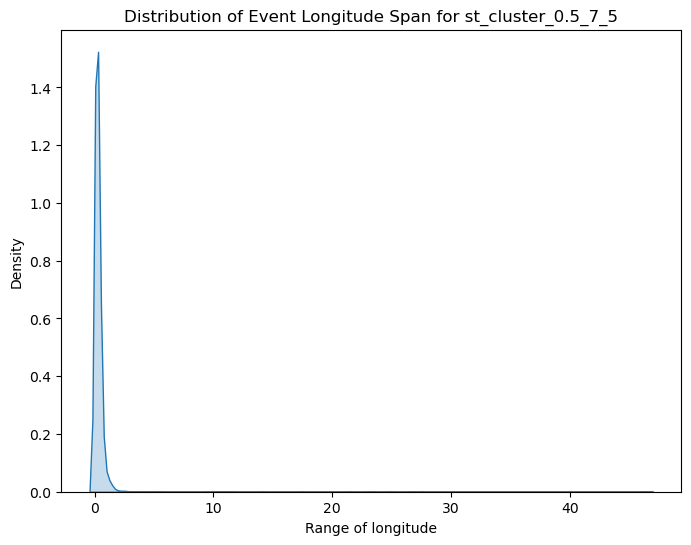


Analyzing st_cluster field: st_cluster_0.5_7_7


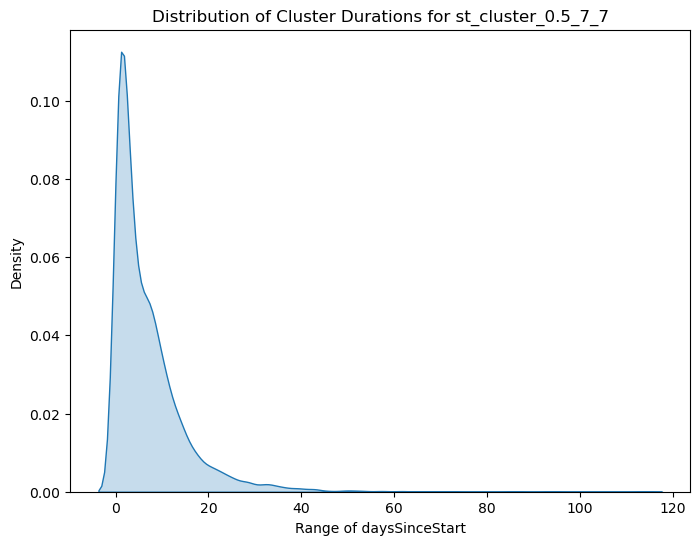

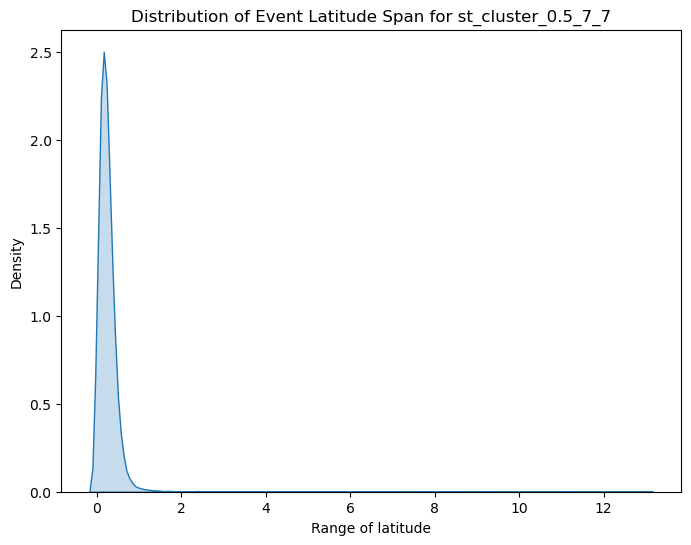

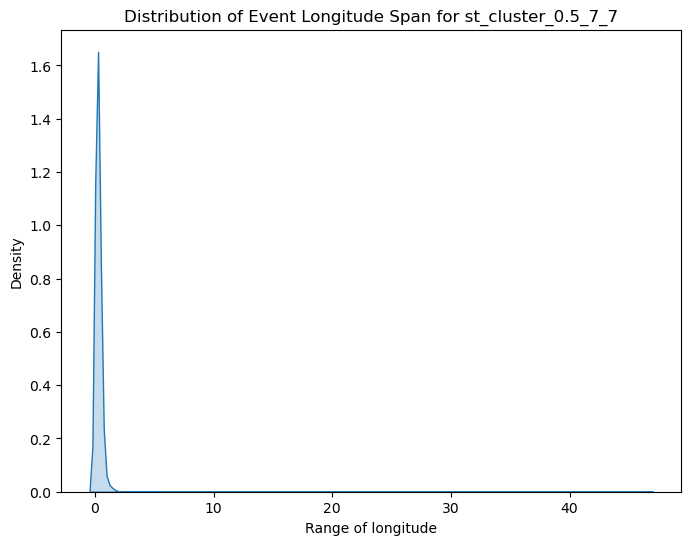


Analyzing st_cluster field: st_cluster_0.5_7_10


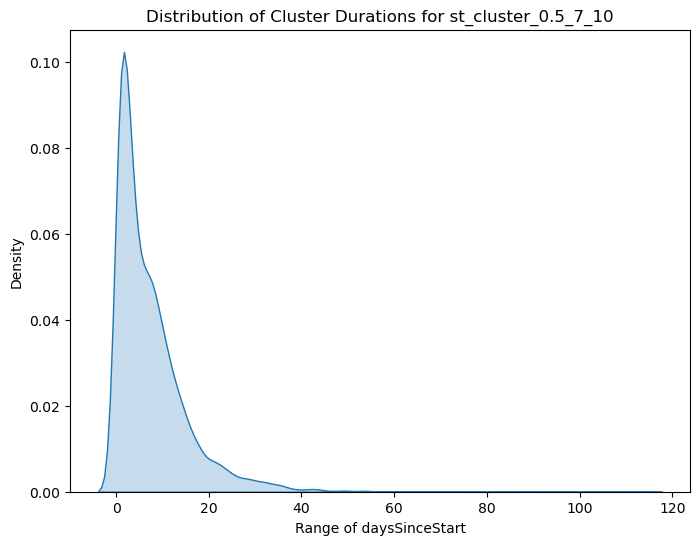

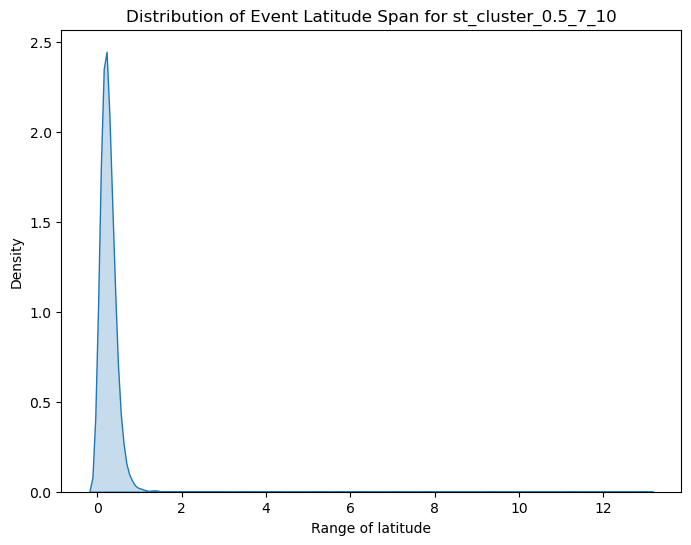

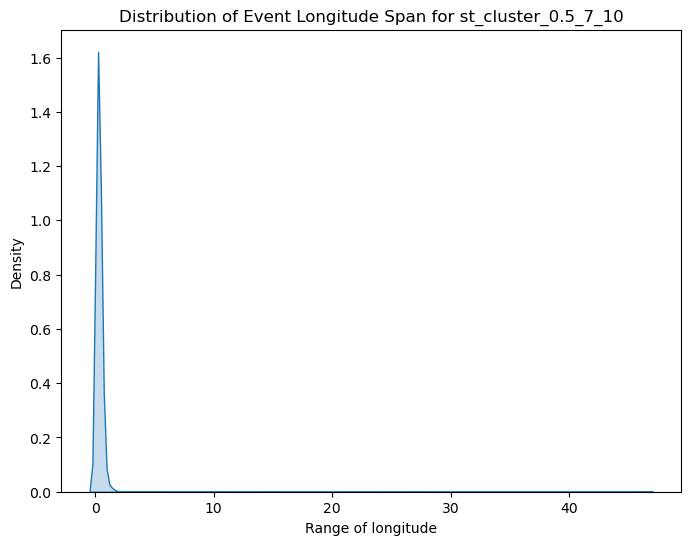


Analyzing st_cluster field: st_cluster_0.5_14_3


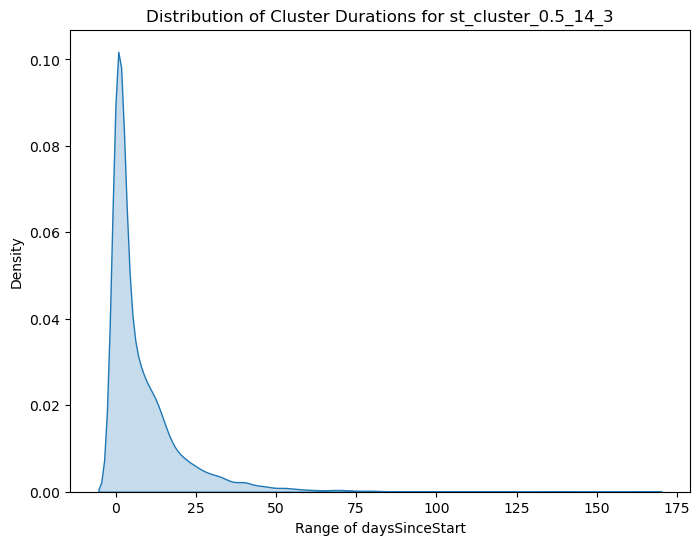

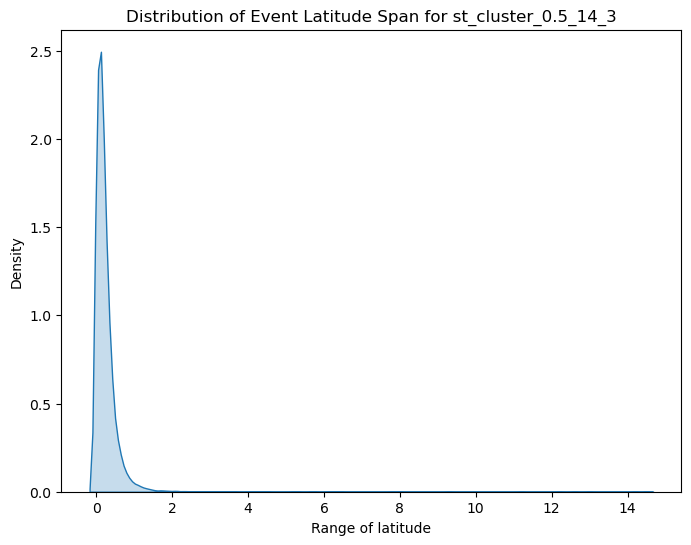

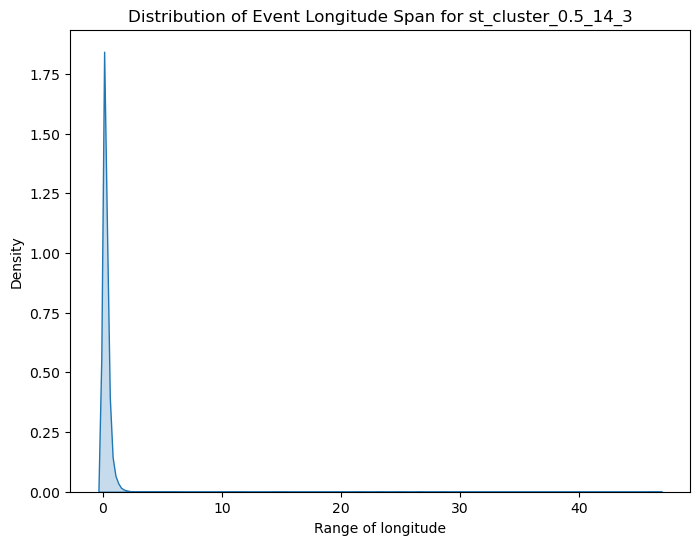


Analyzing st_cluster field: st_cluster_0.5_14_5


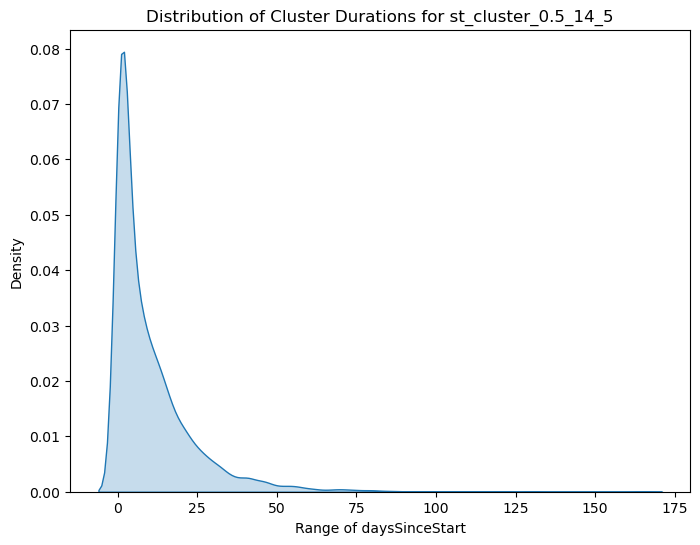

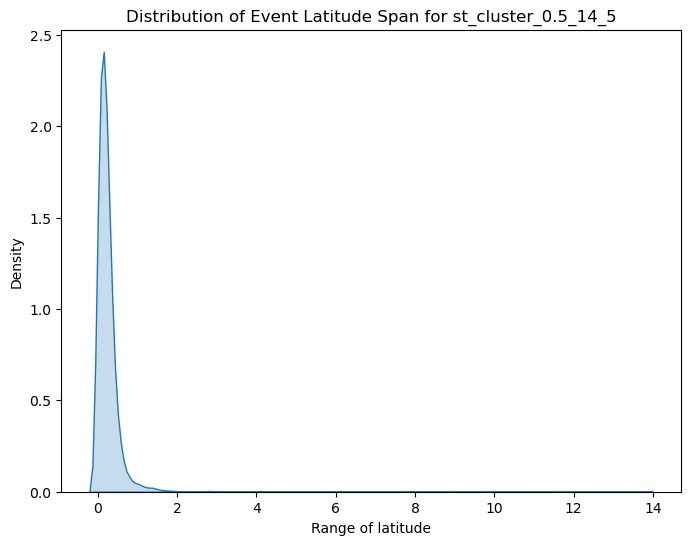

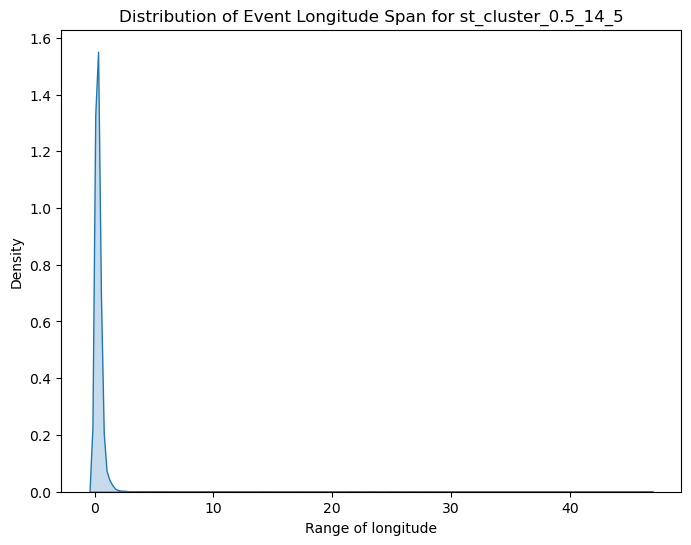


Analyzing st_cluster field: st_cluster_0.5_14_7


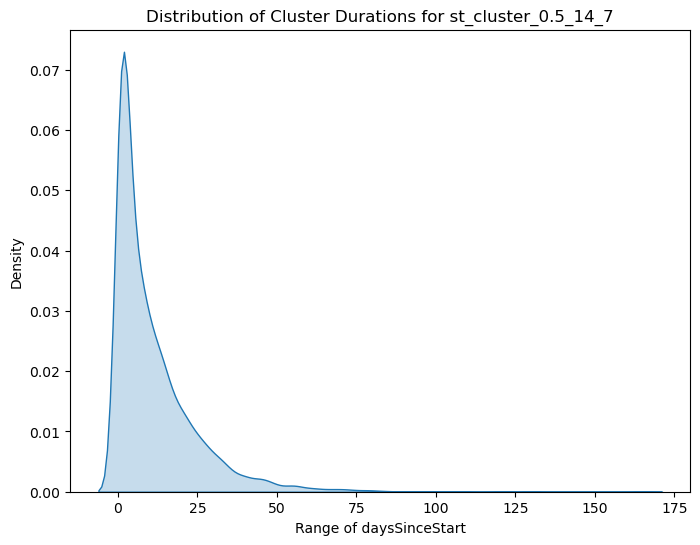

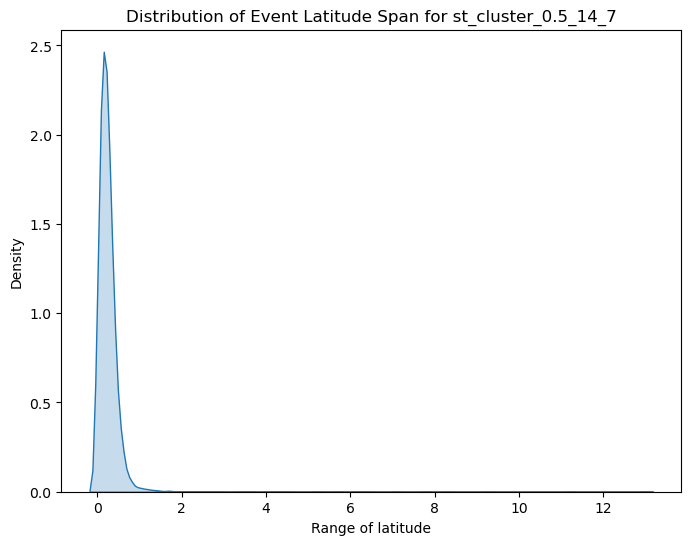

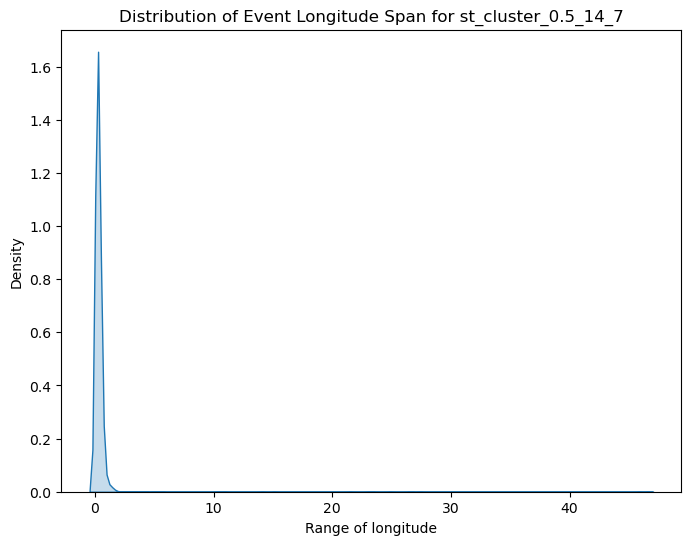


Analyzing st_cluster field: st_cluster_0.5_14_10


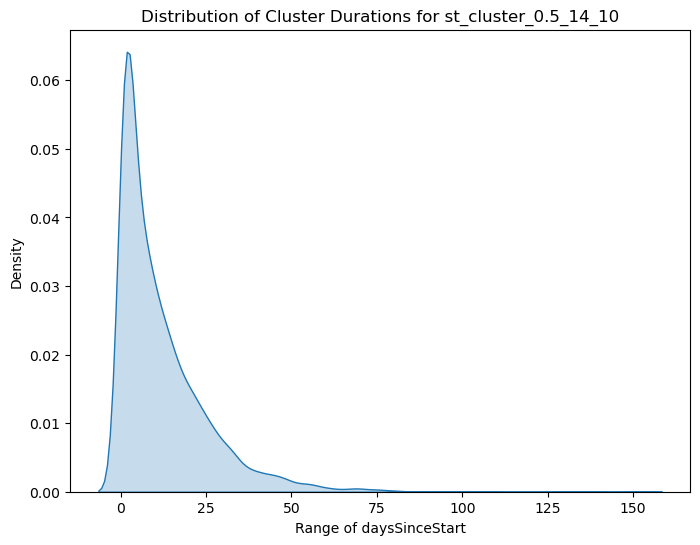

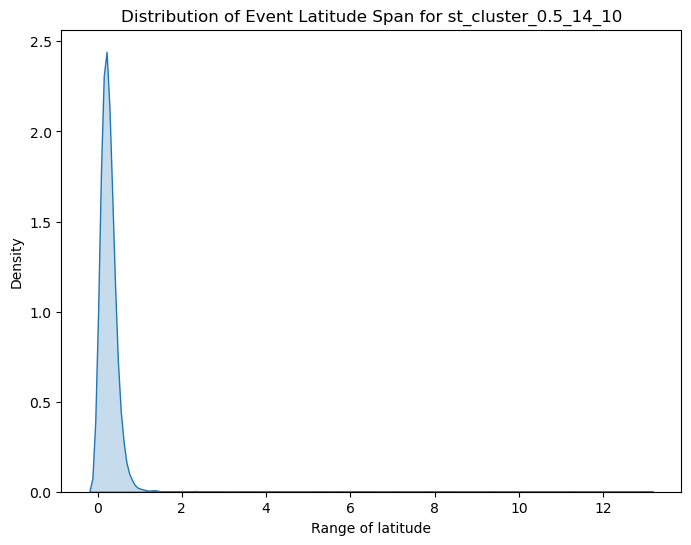

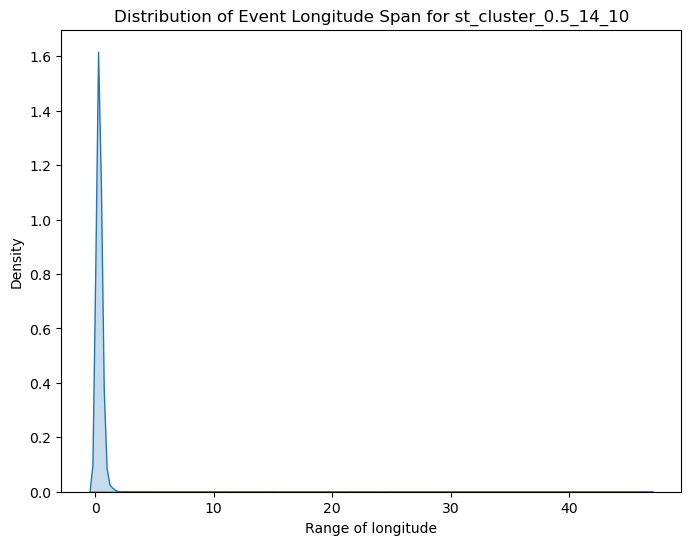


Analyzing st_cluster field: st_cluster_0.5_30_3


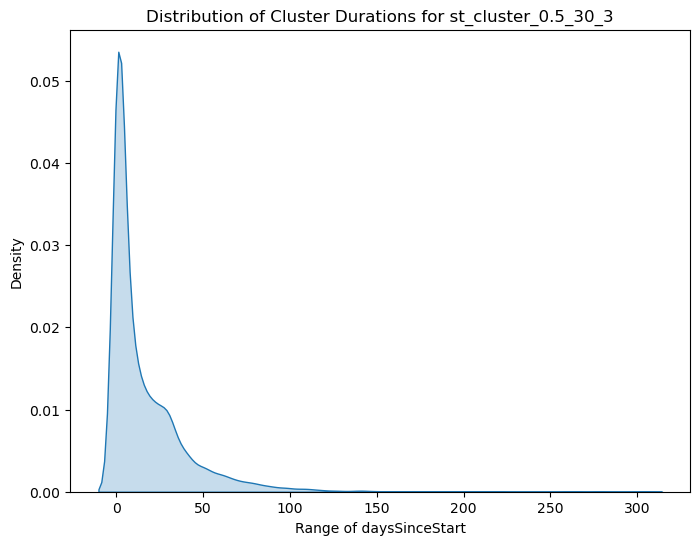

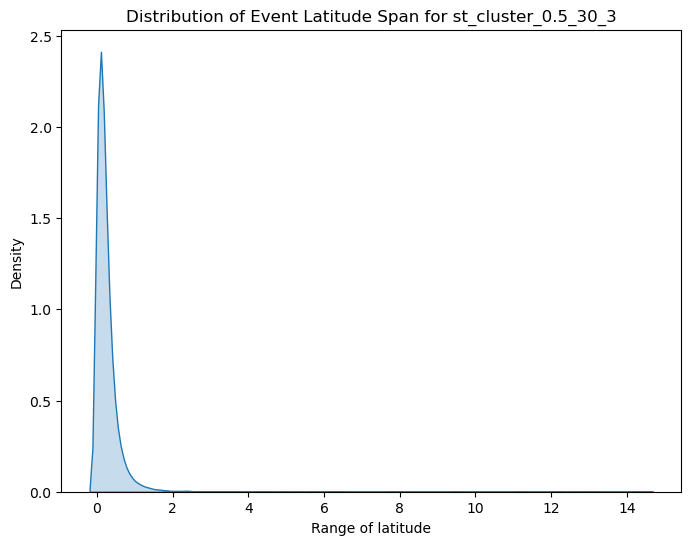

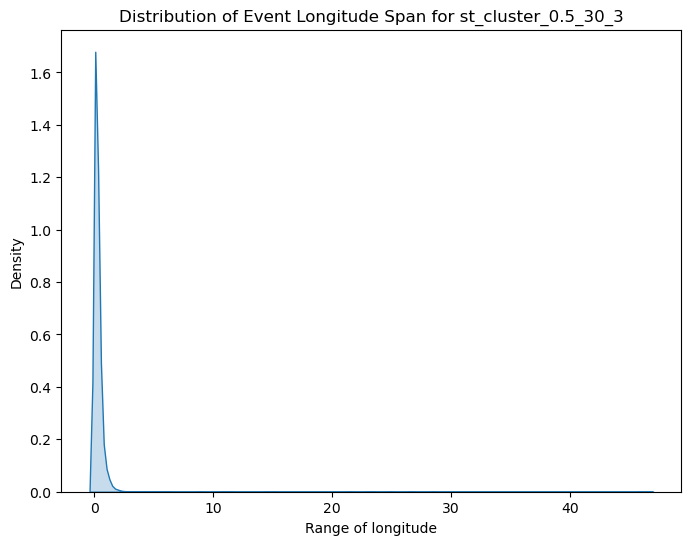


Analyzing st_cluster field: st_cluster_0.5_30_5


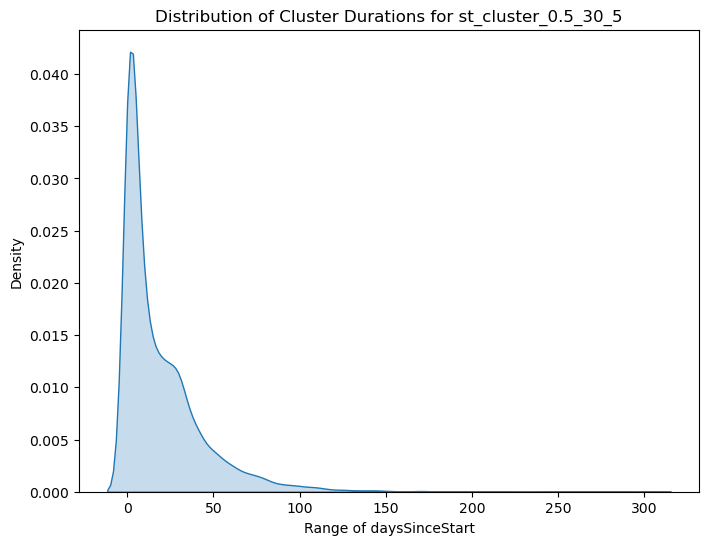

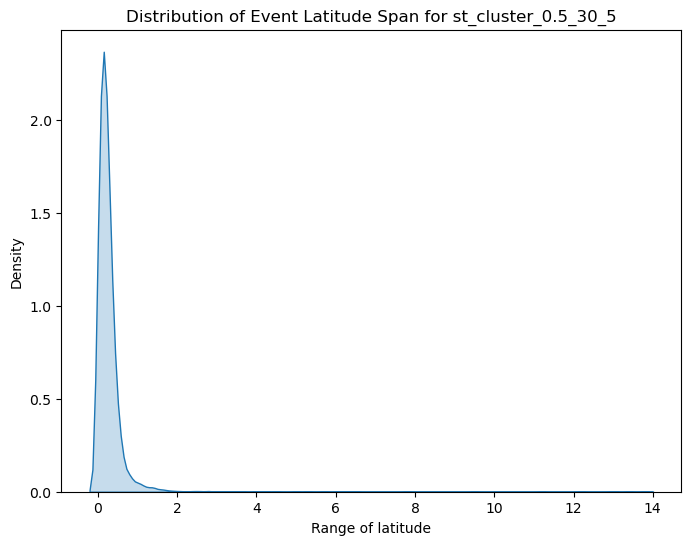

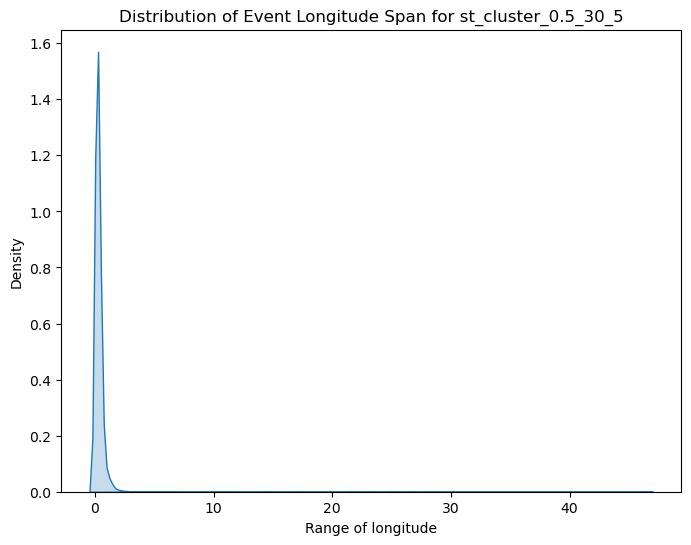


Analyzing st_cluster field: st_cluster_0.5_30_7


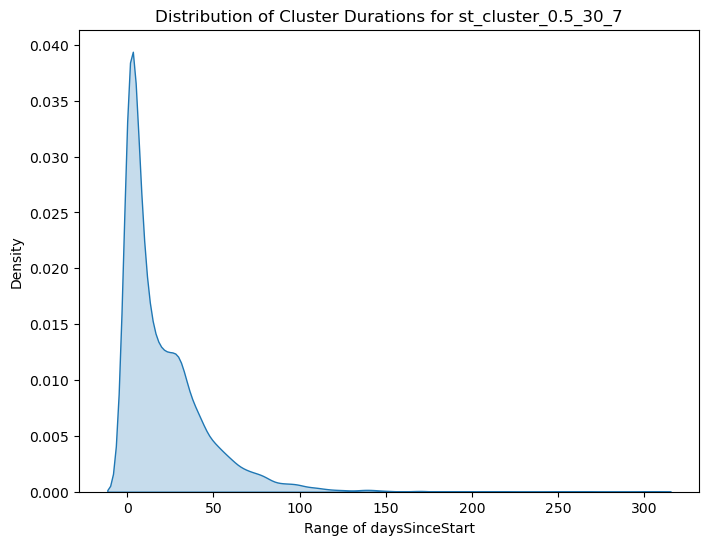

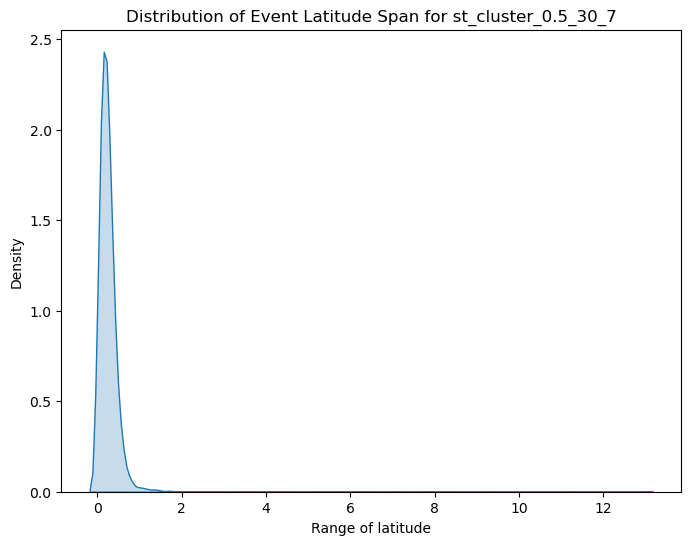

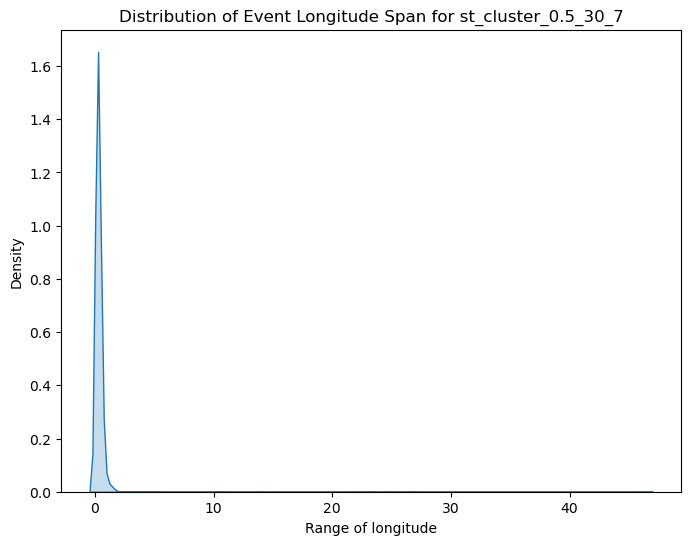


Analyzing st_cluster field: st_cluster_0.5_30_10


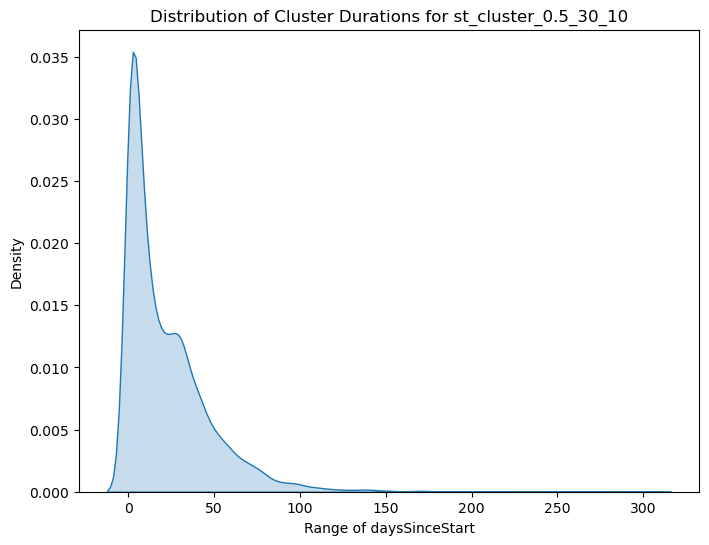

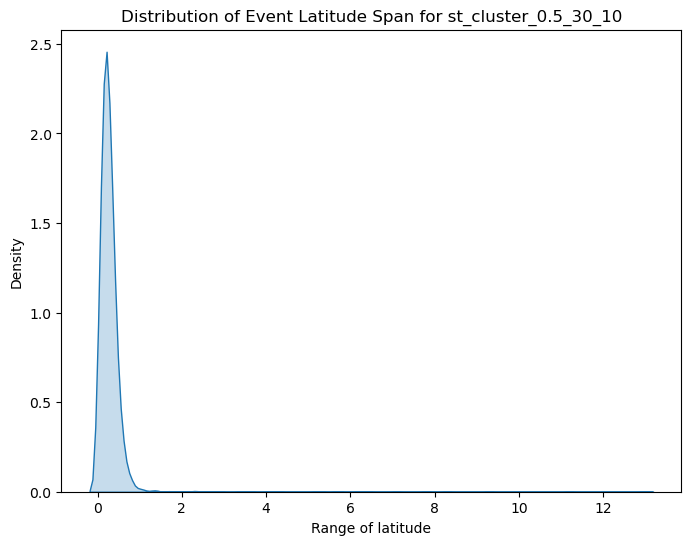

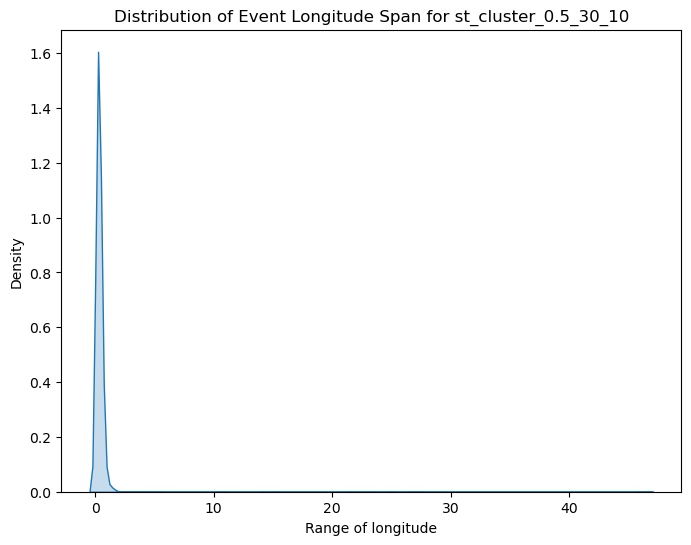


Analyzing st_cluster field: st_cluster_1_3_3


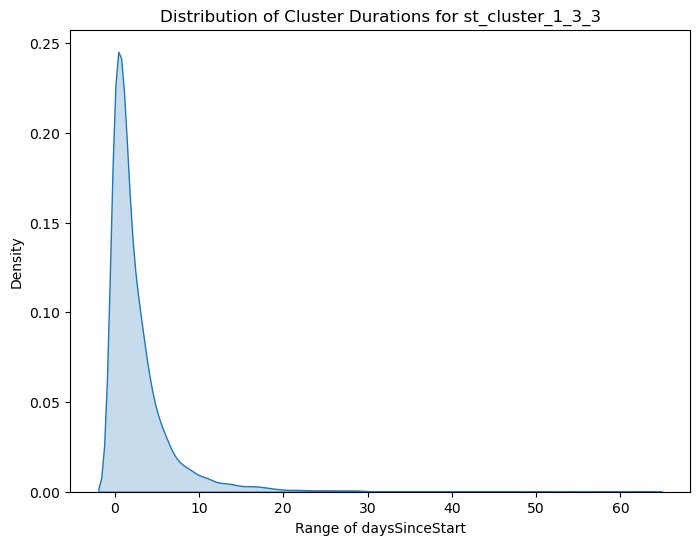

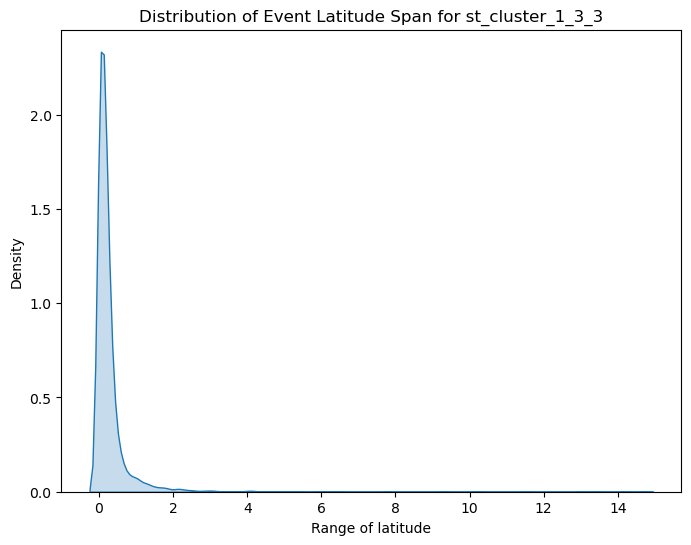

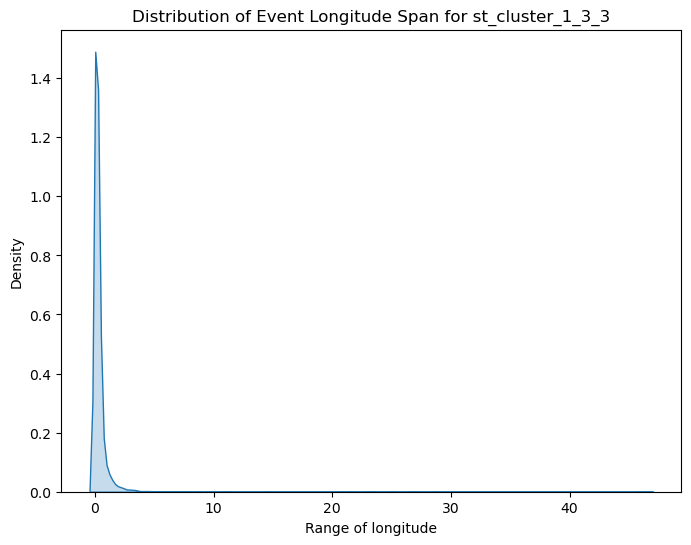


Analyzing st_cluster field: st_cluster_1_3_5


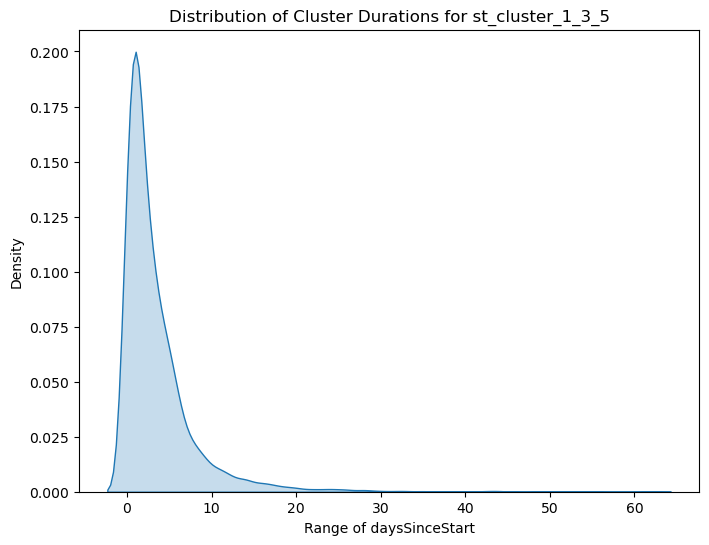

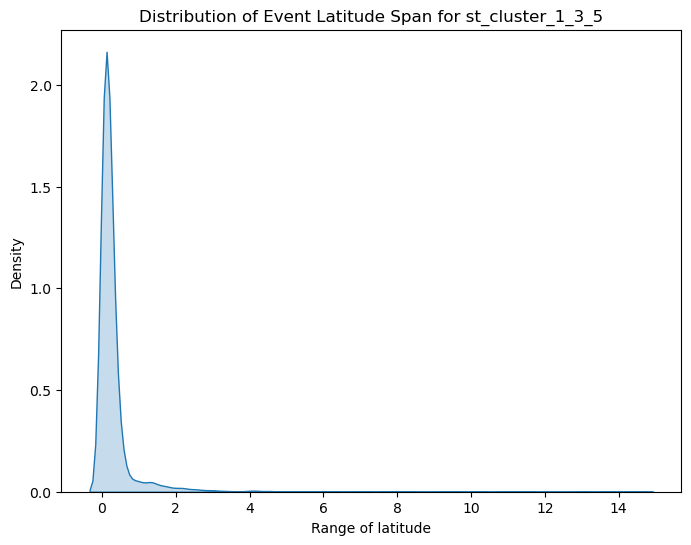

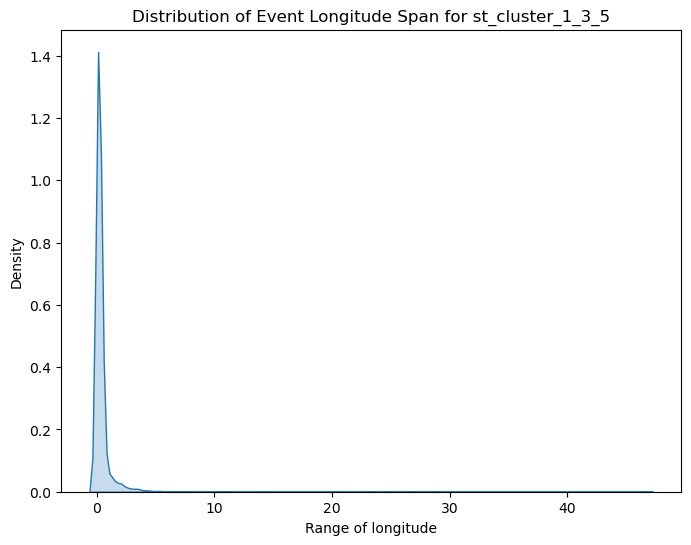


Analyzing st_cluster field: st_cluster_1_3_7


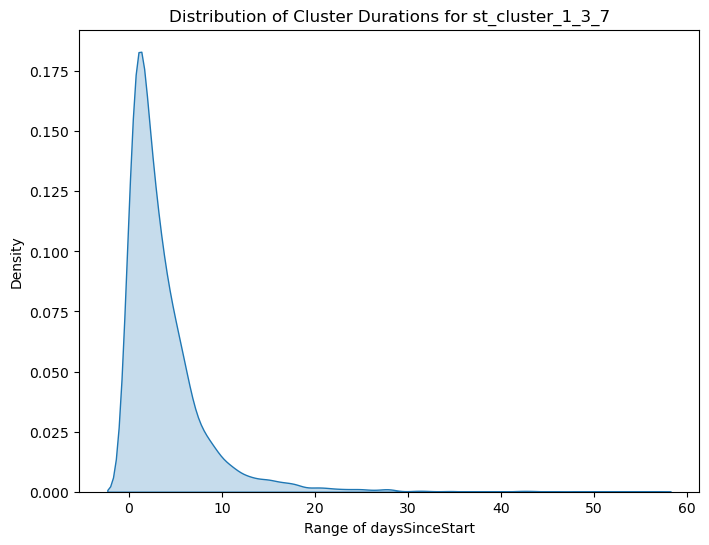

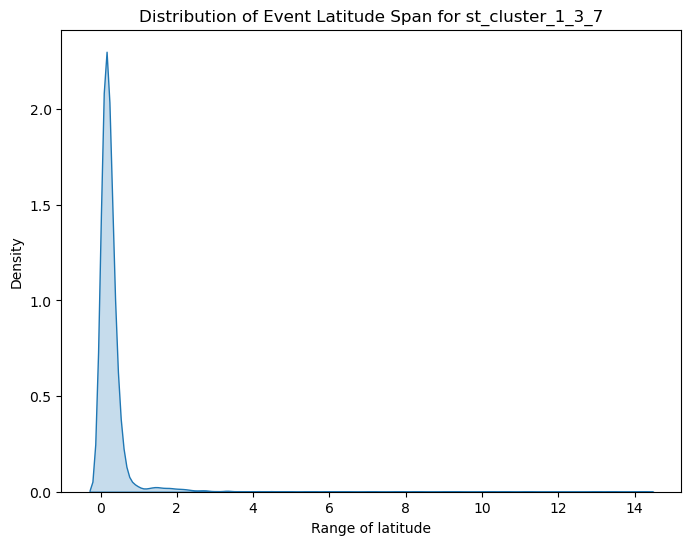

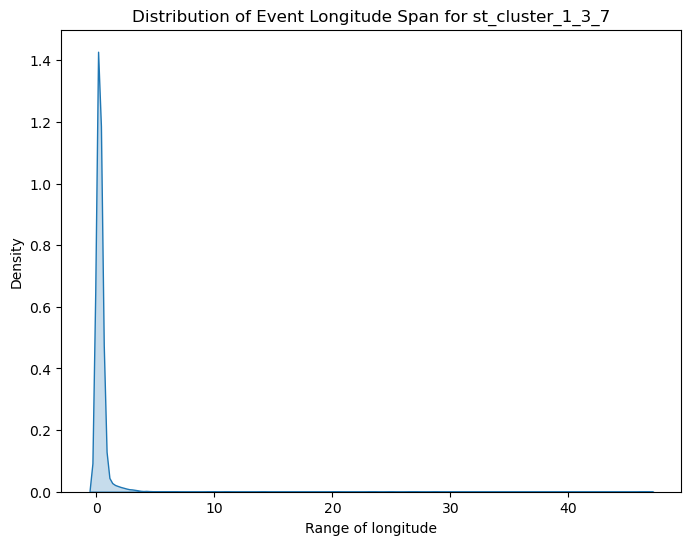


Analyzing st_cluster field: st_cluster_1_3_10


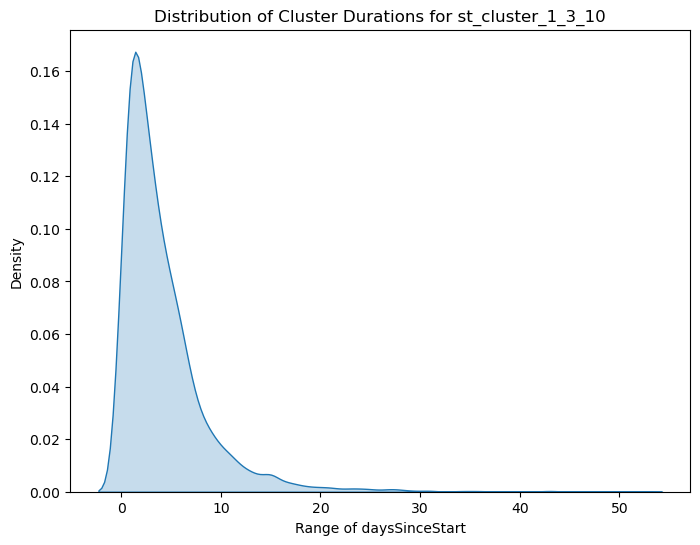

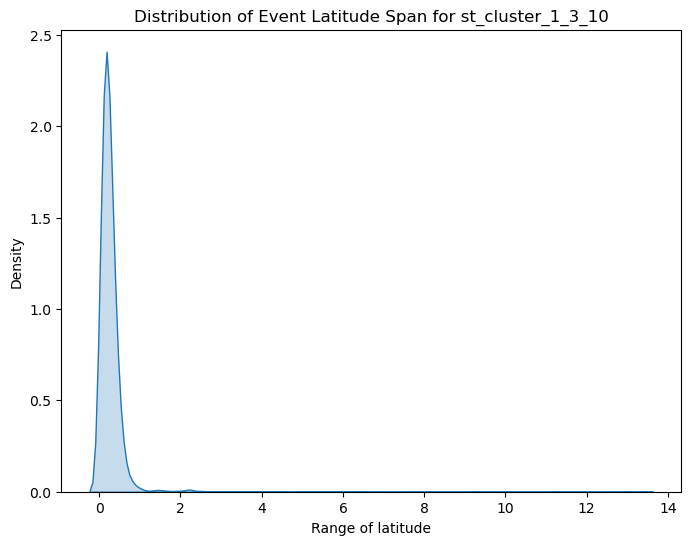

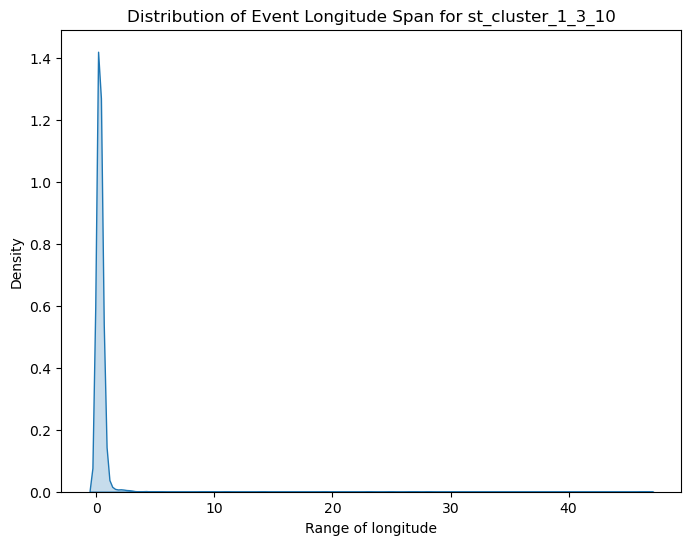


Analyzing st_cluster field: st_cluster_1_5_3


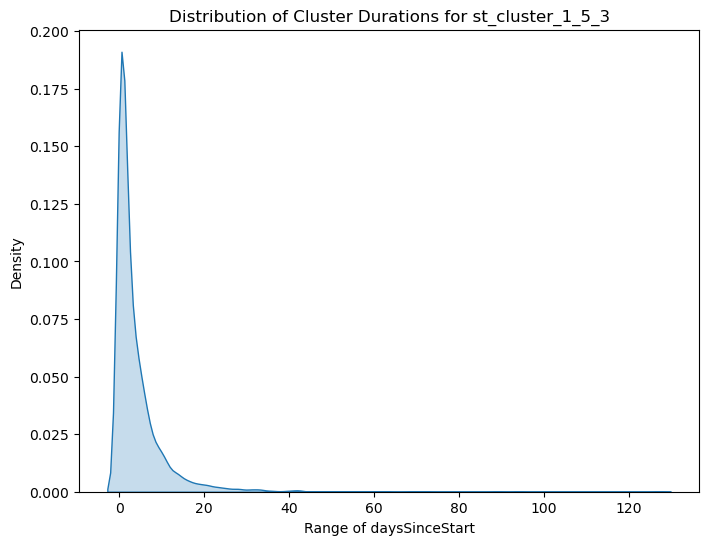

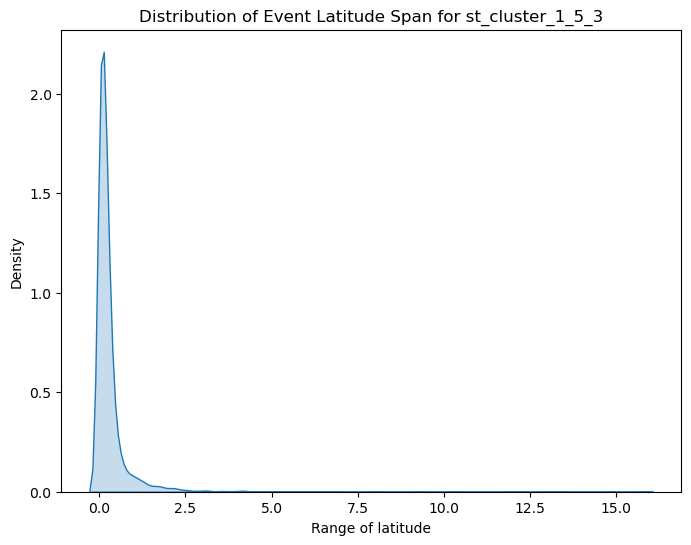

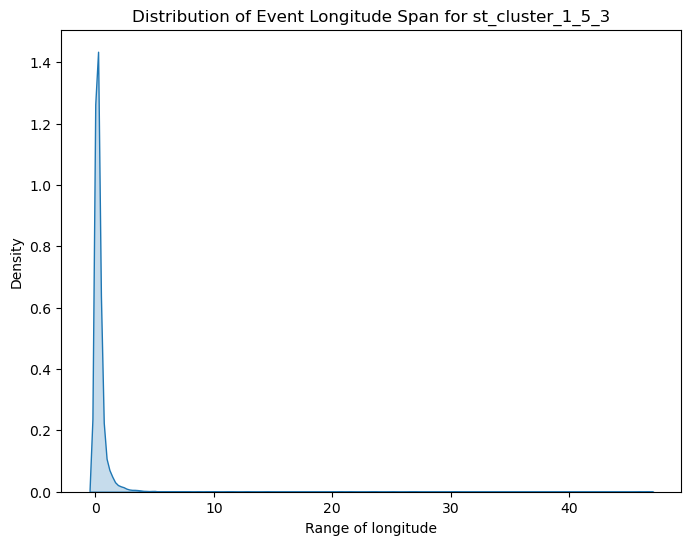


Analyzing st_cluster field: st_cluster_1_5_5


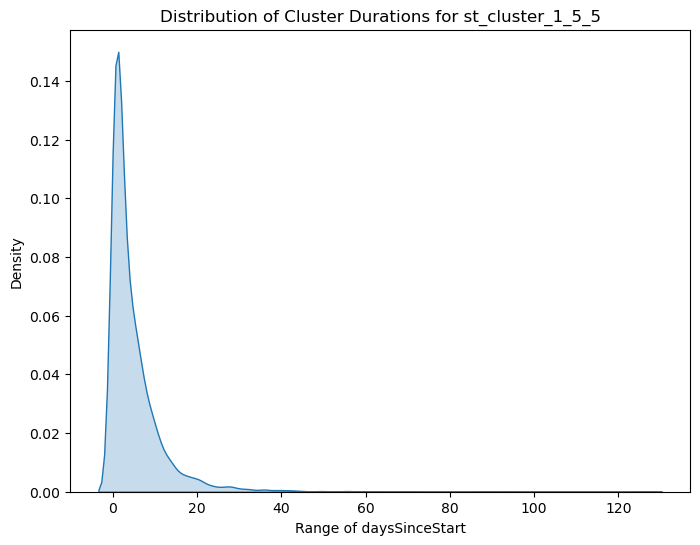

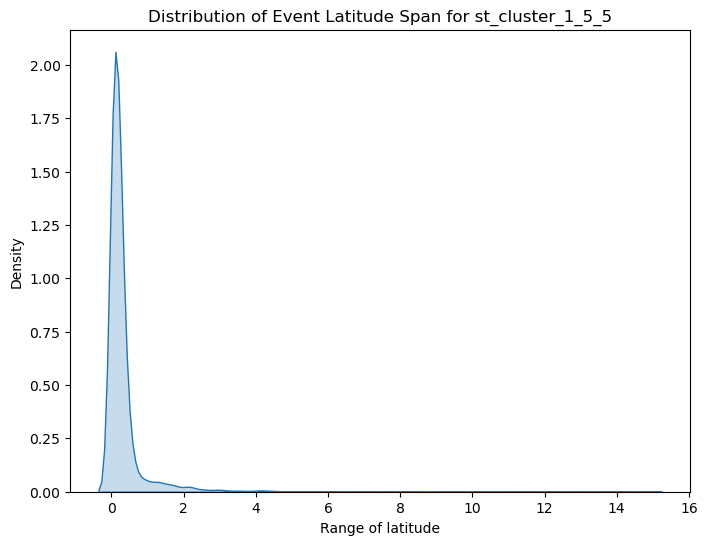

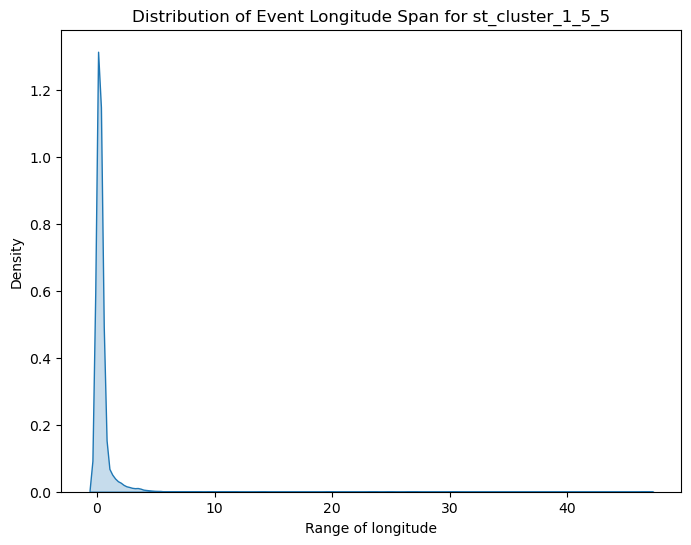


Analyzing st_cluster field: st_cluster_1_5_7


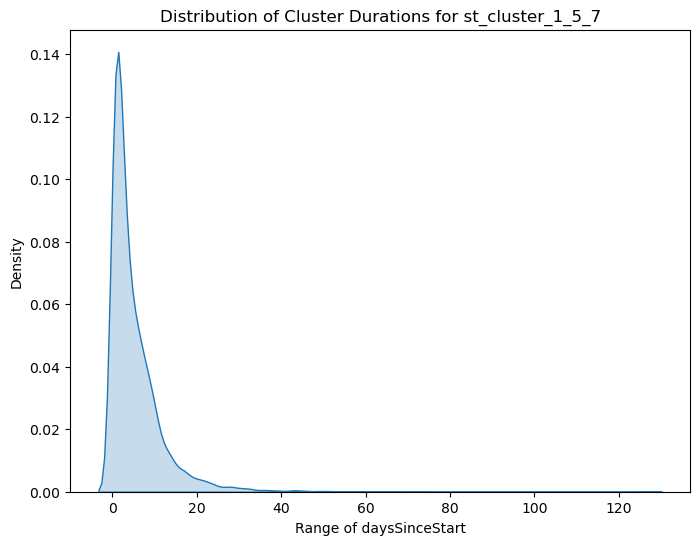

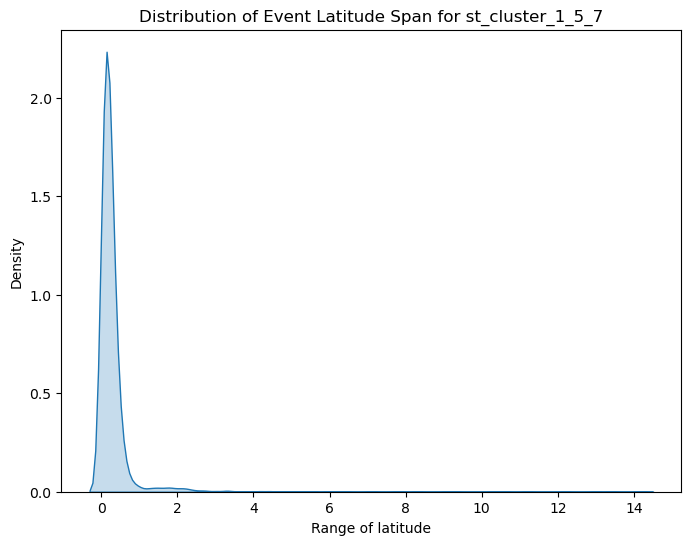

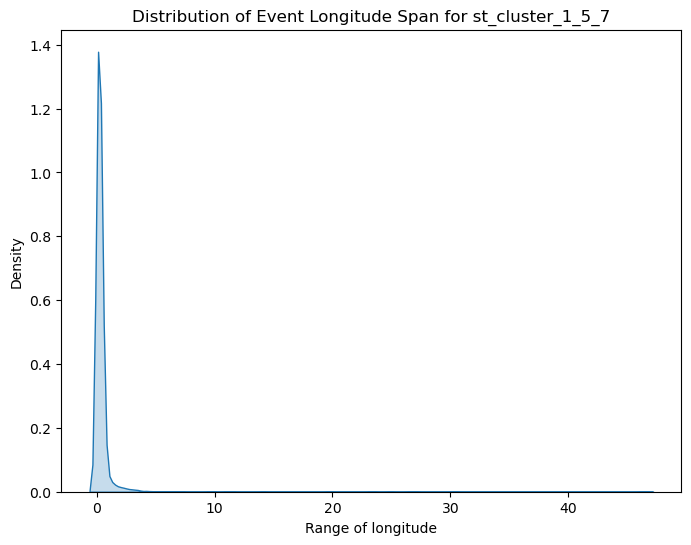


Analyzing st_cluster field: st_cluster_1_5_10


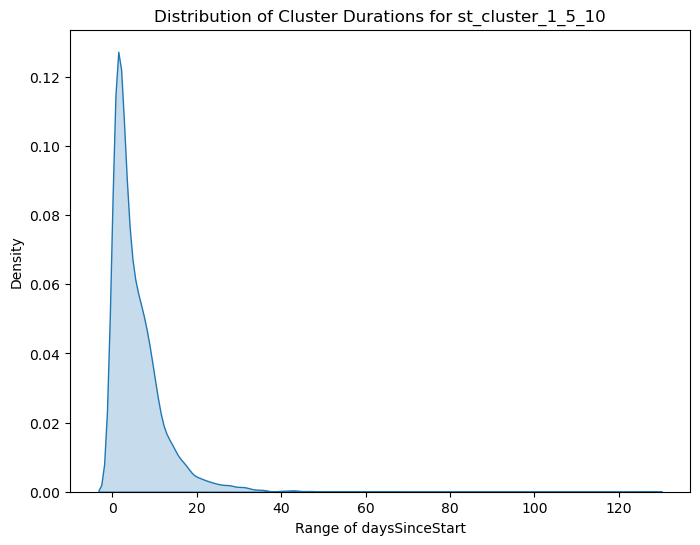

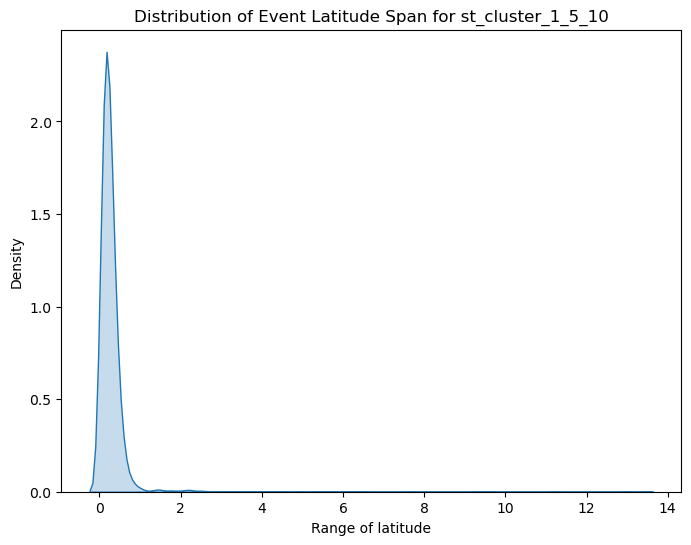

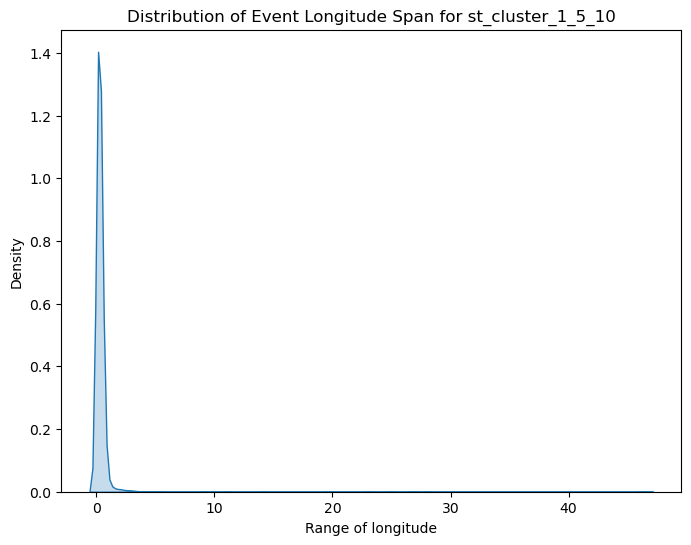


Analyzing st_cluster field: st_cluster_1_7_3


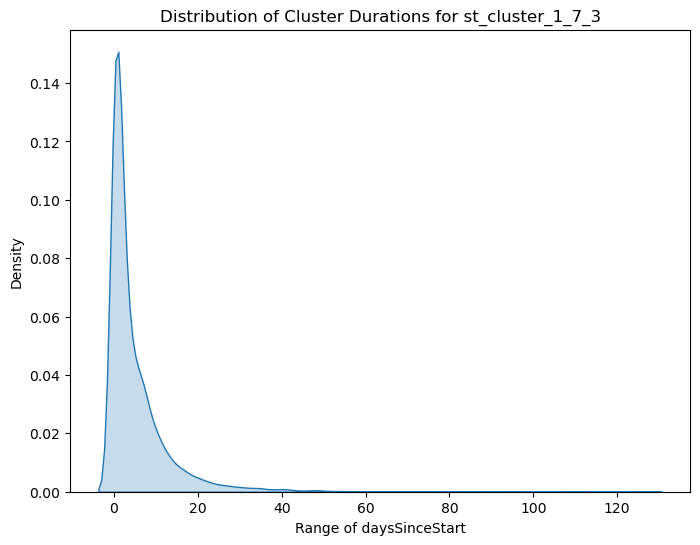

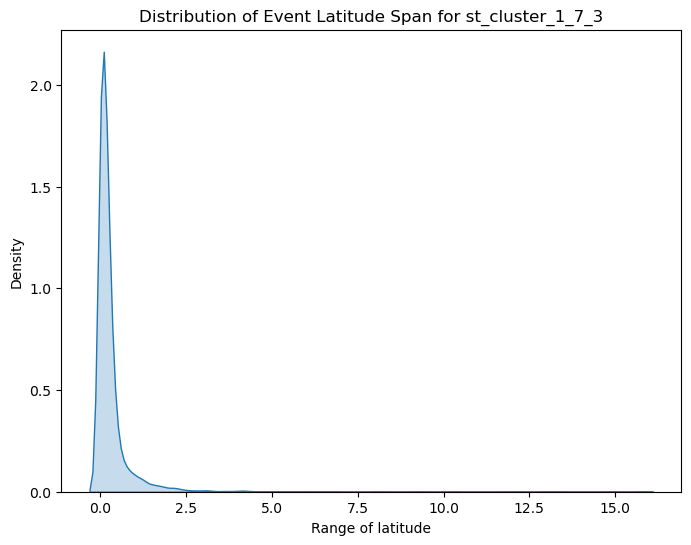

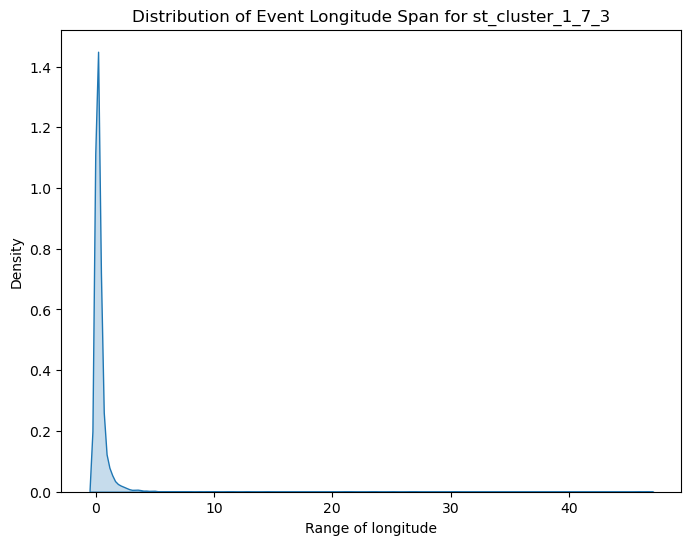


Analyzing st_cluster field: st_cluster_1_7_5


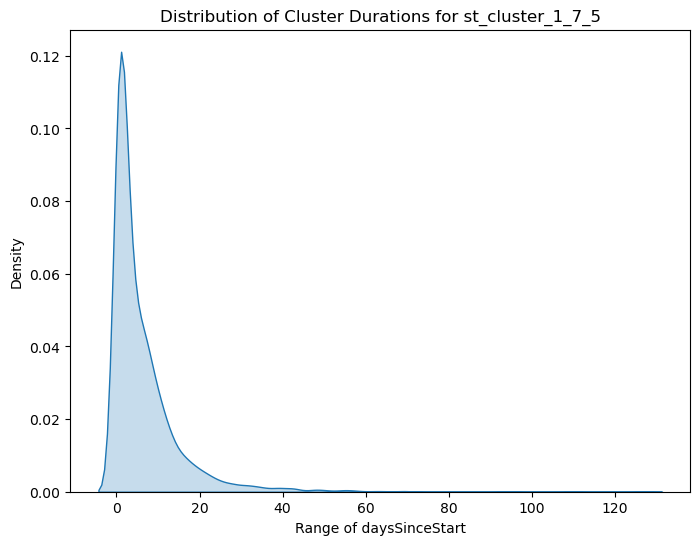

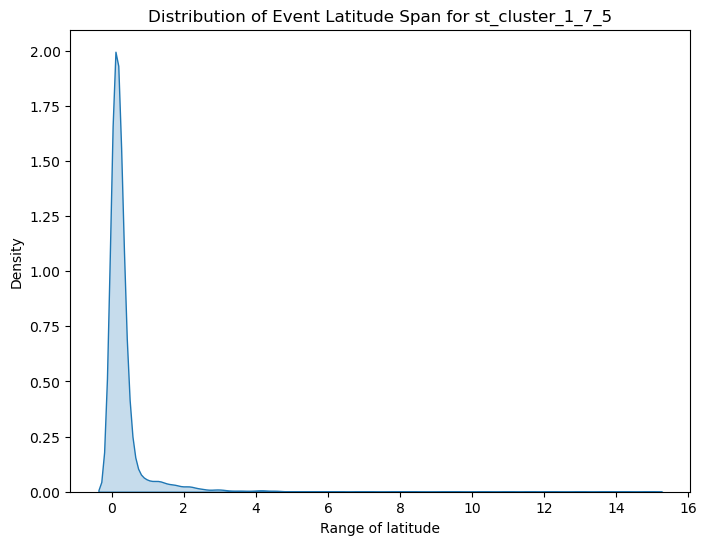

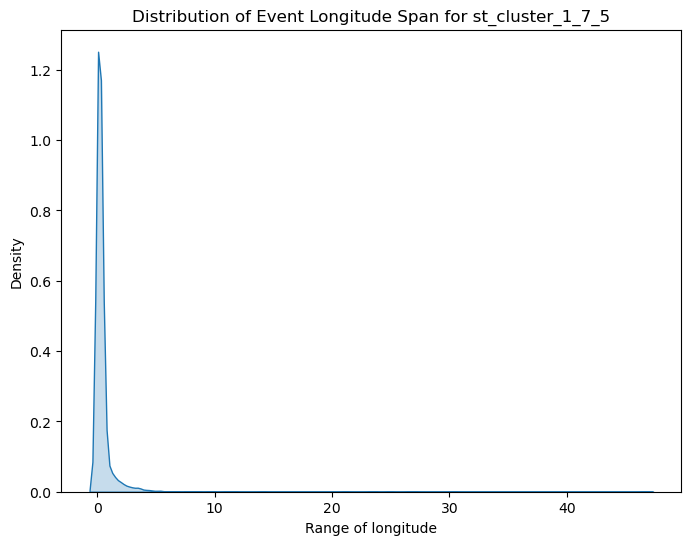


Analyzing st_cluster field: st_cluster_1_7_7


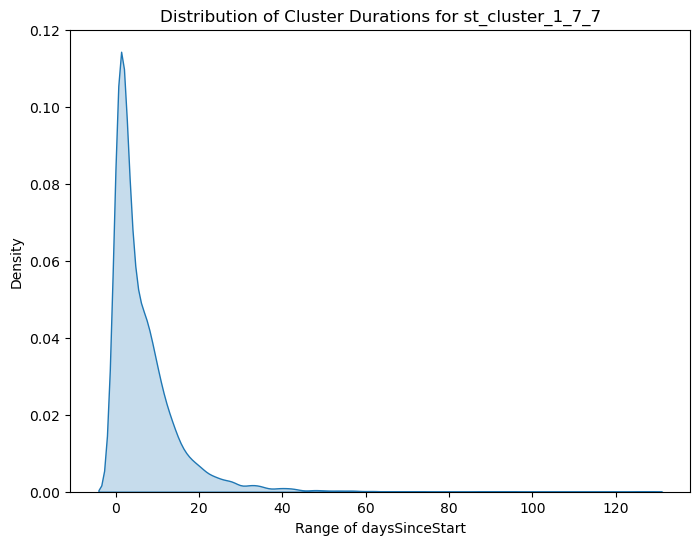

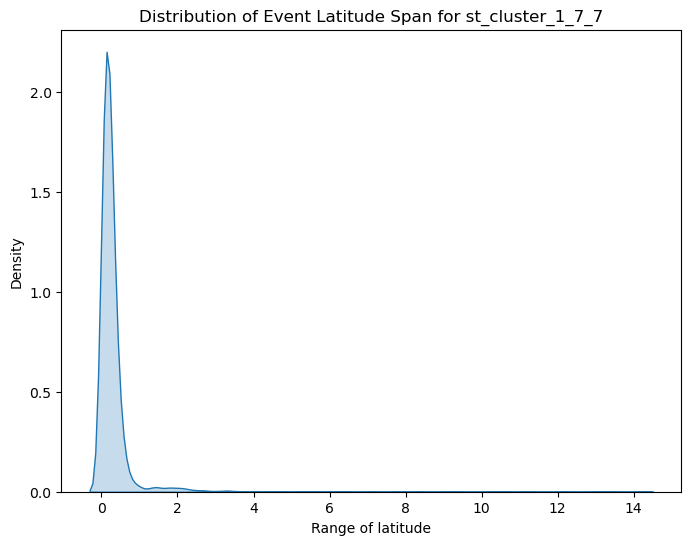

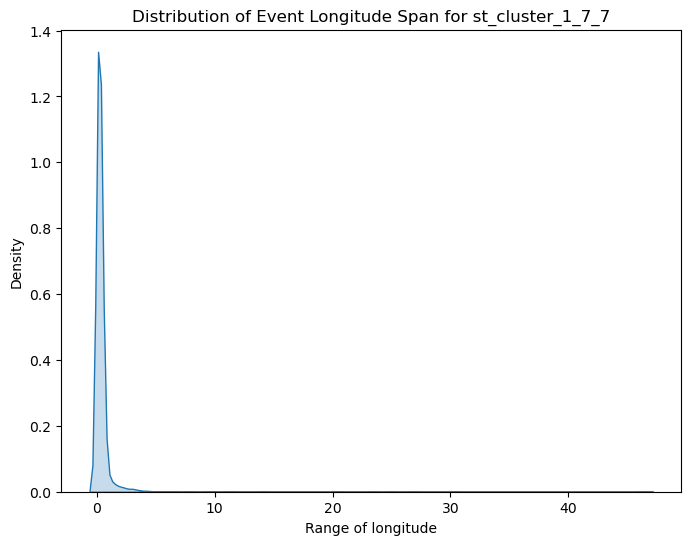


Analyzing st_cluster field: st_cluster_1_7_10


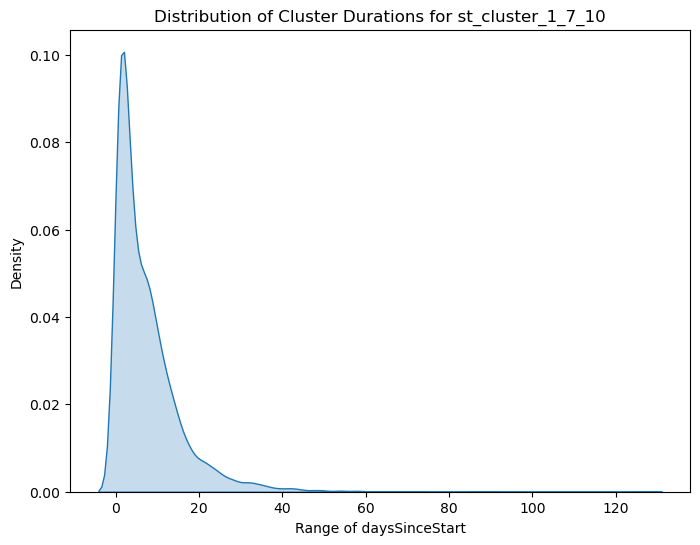

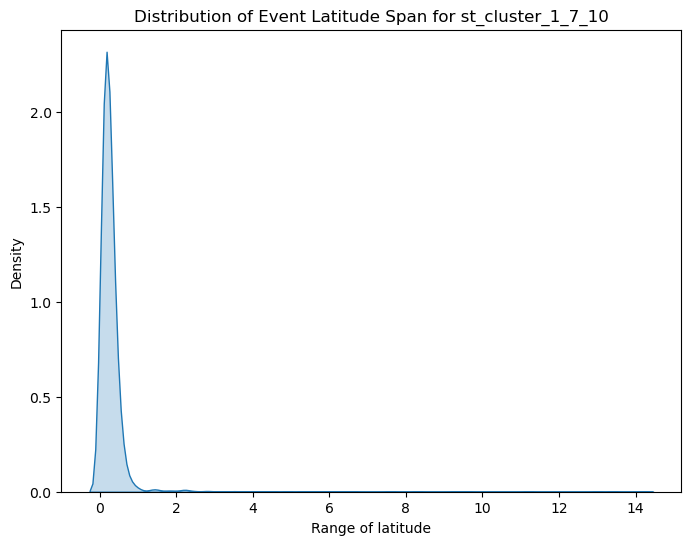

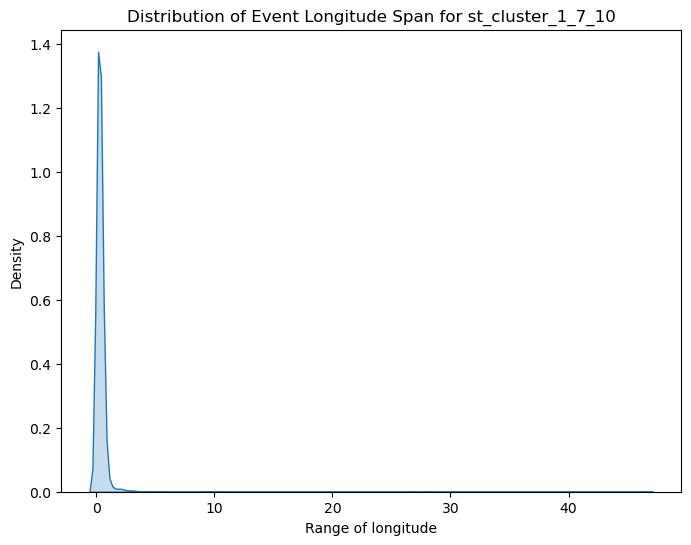


Analyzing st_cluster field: st_cluster_1_14_3


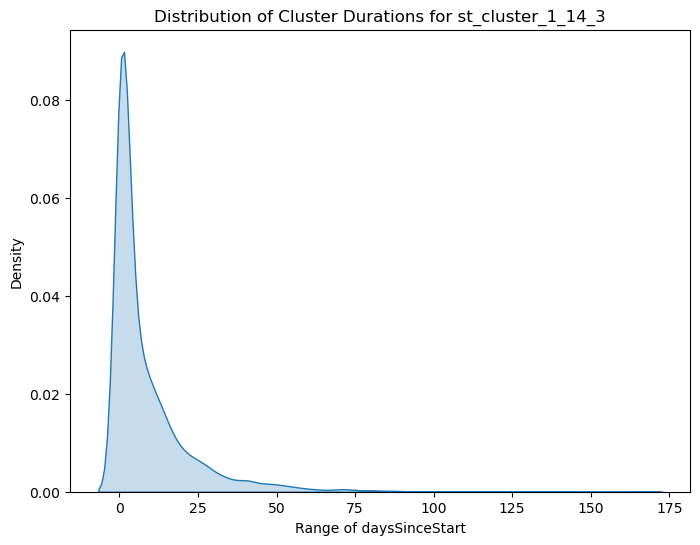

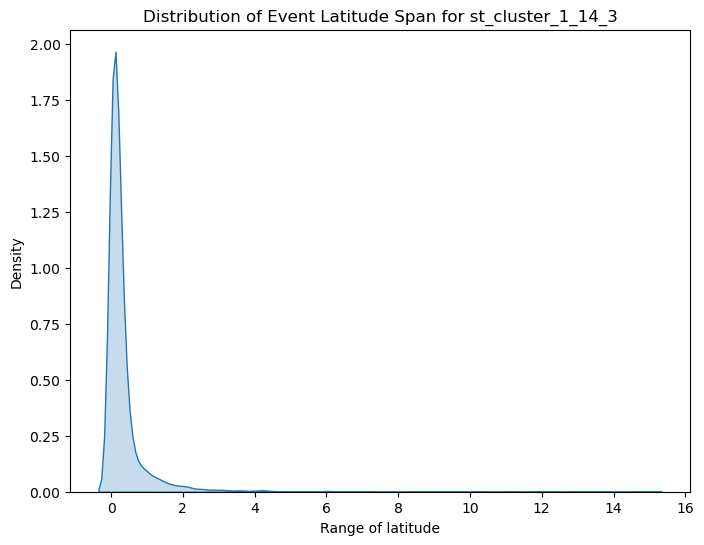

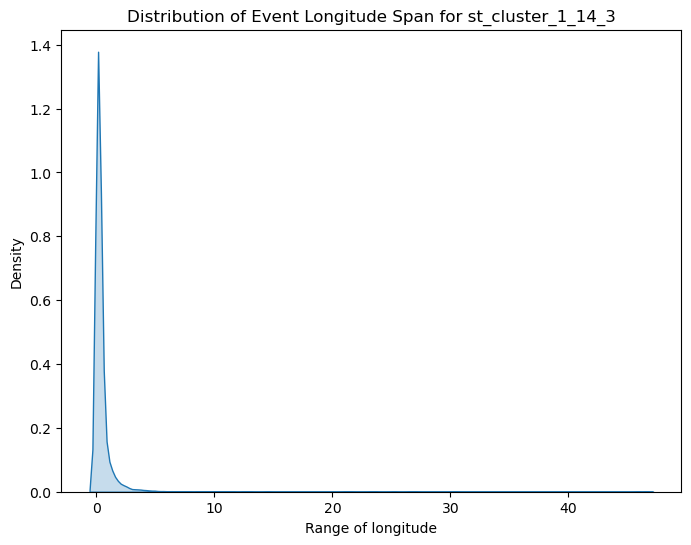


Analyzing st_cluster field: st_cluster_1_14_5


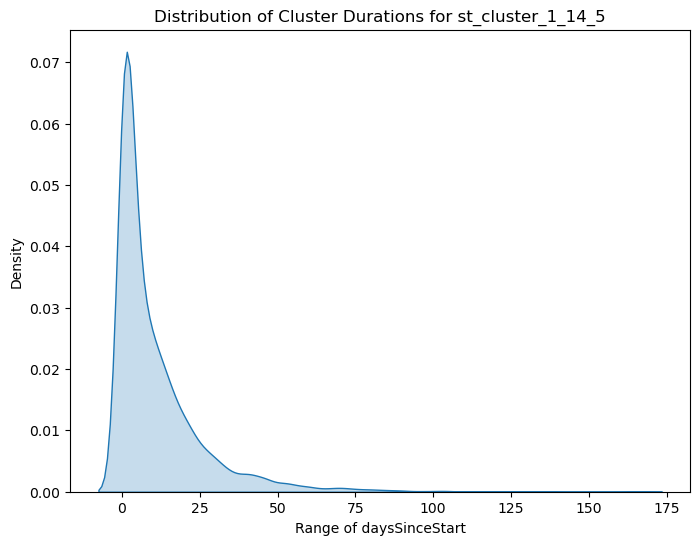

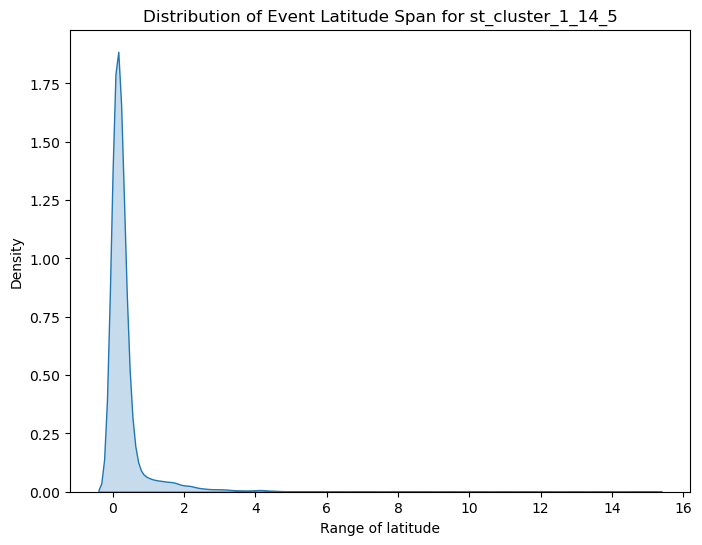

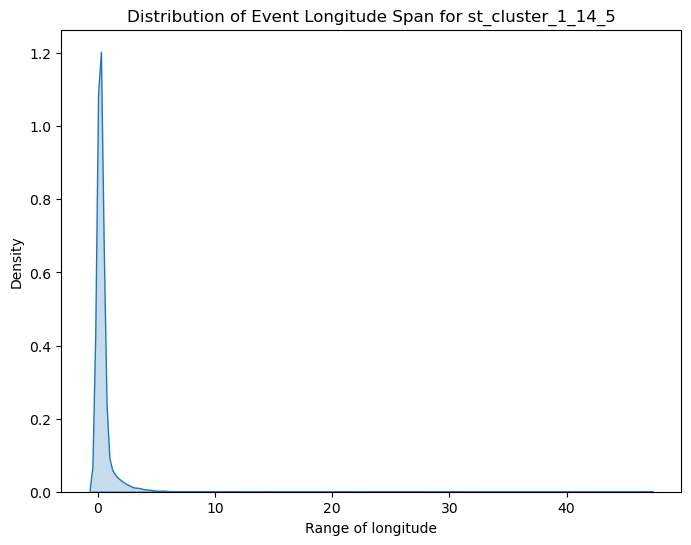


Analyzing st_cluster field: st_cluster_1_14_7


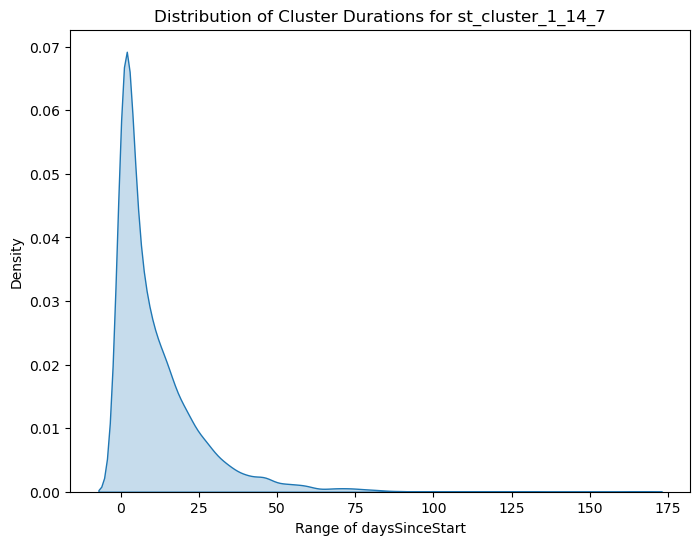

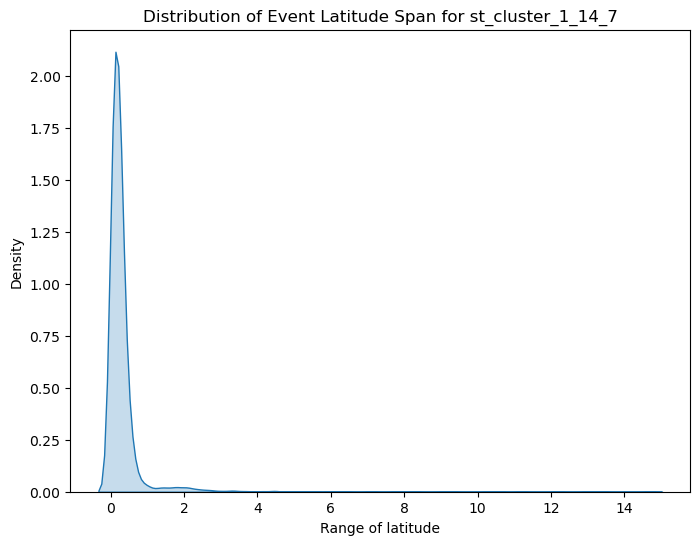

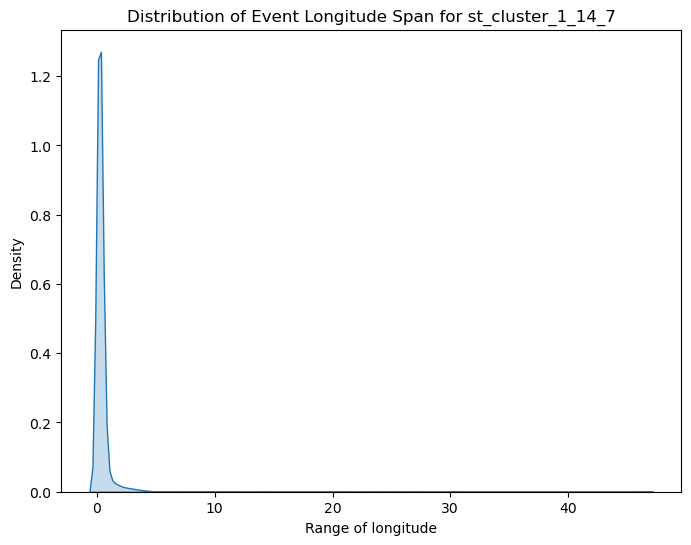


Analyzing st_cluster field: st_cluster_1_14_10


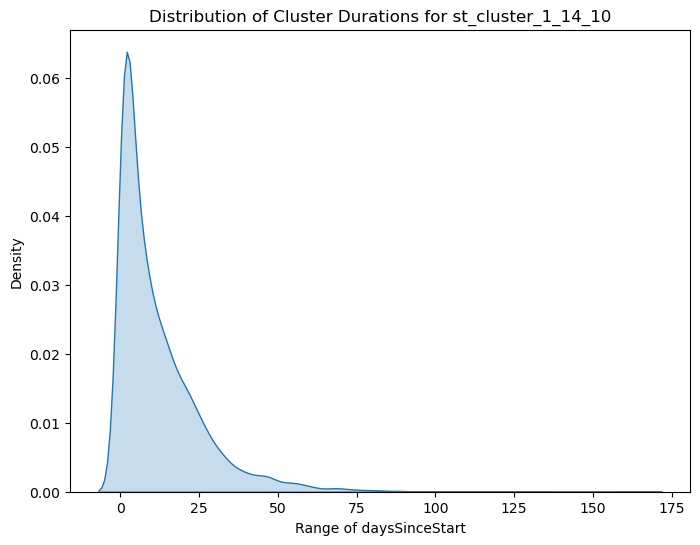

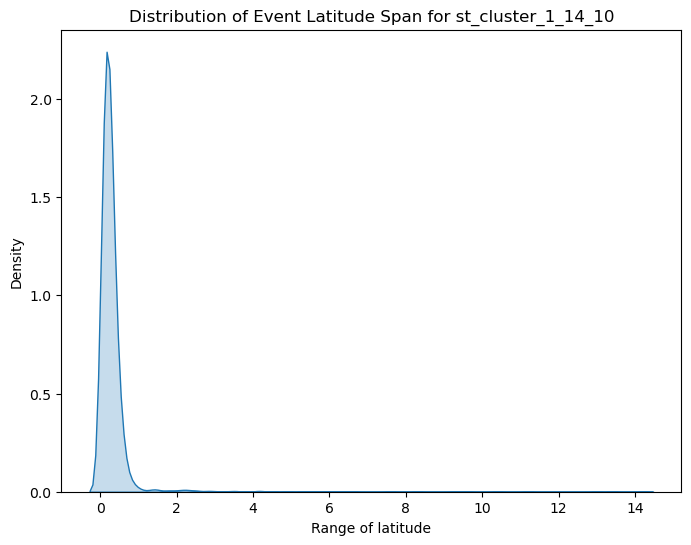

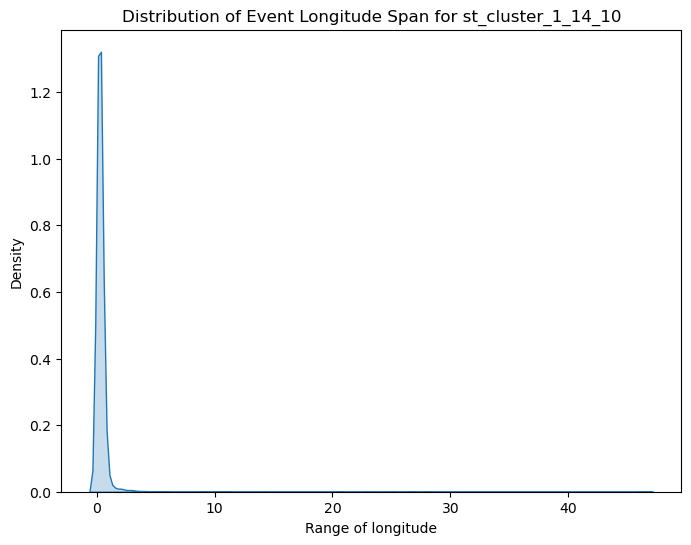


Analyzing st_cluster field: st_cluster_1_30_3


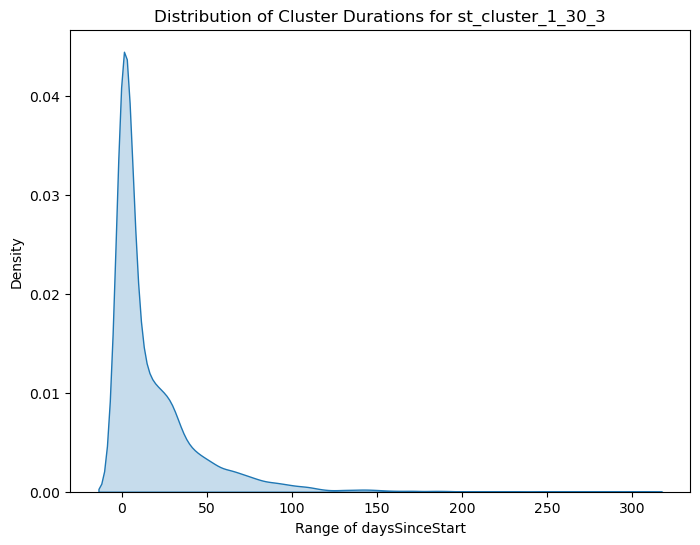

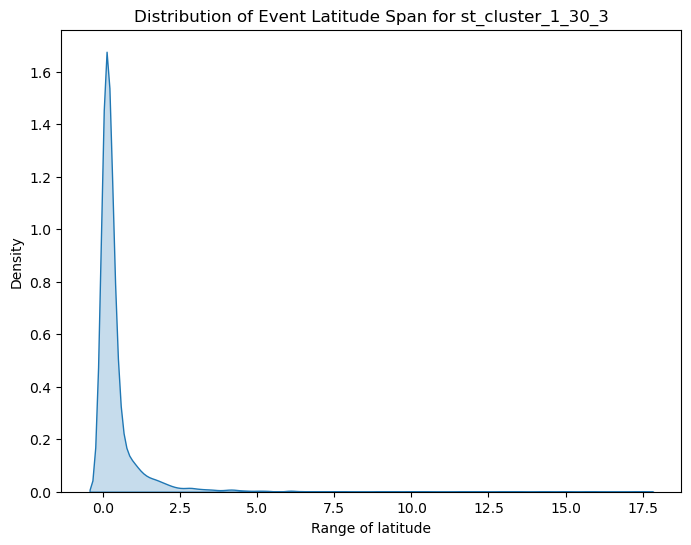

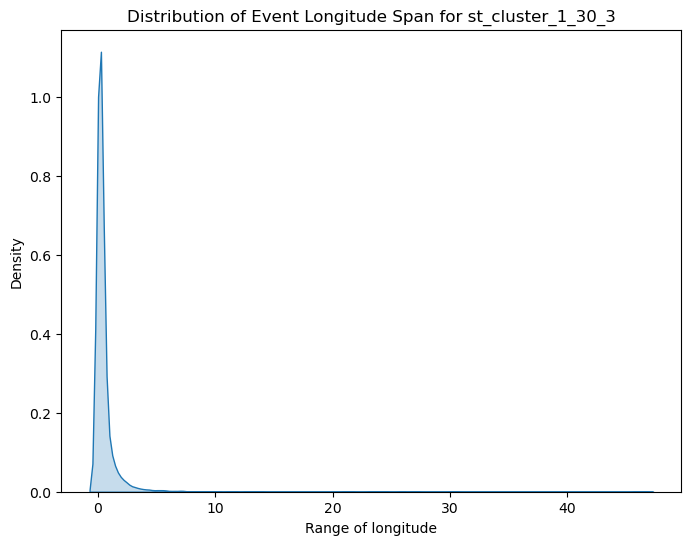


Analyzing st_cluster field: st_cluster_1_30_5


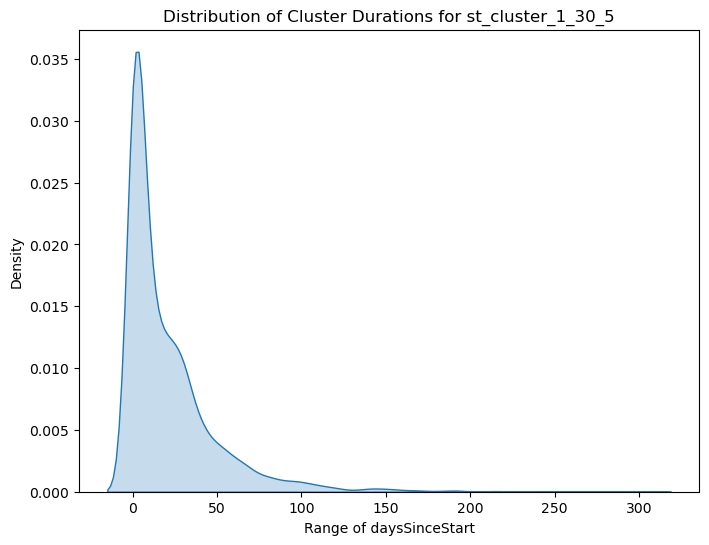

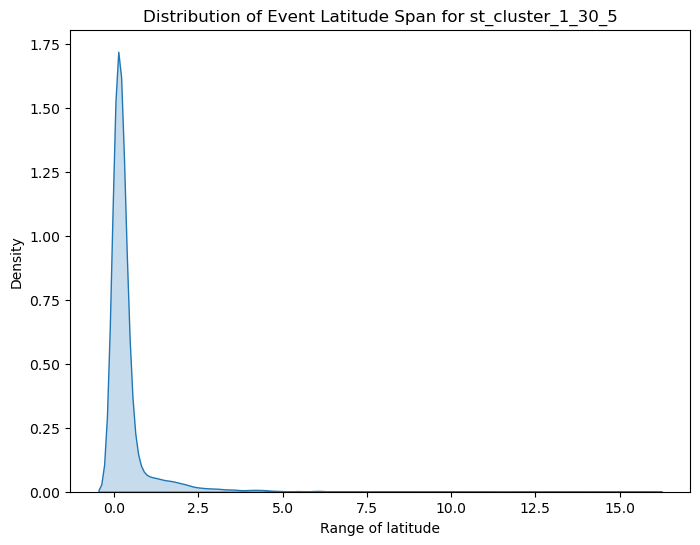

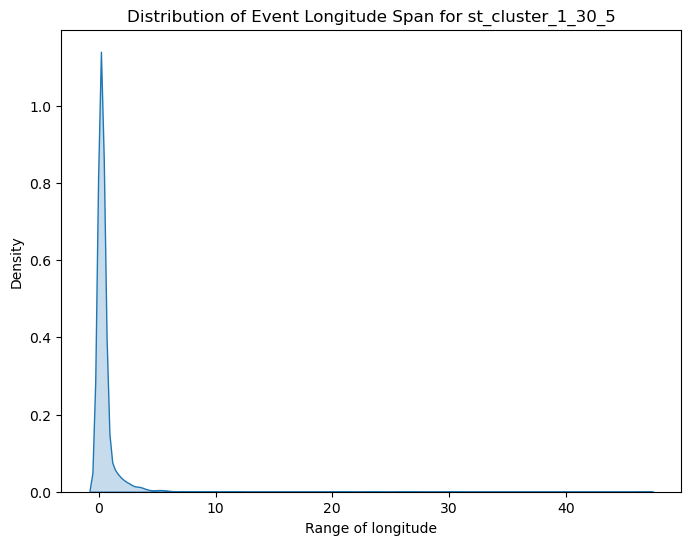


Analyzing st_cluster field: st_cluster_1_30_7


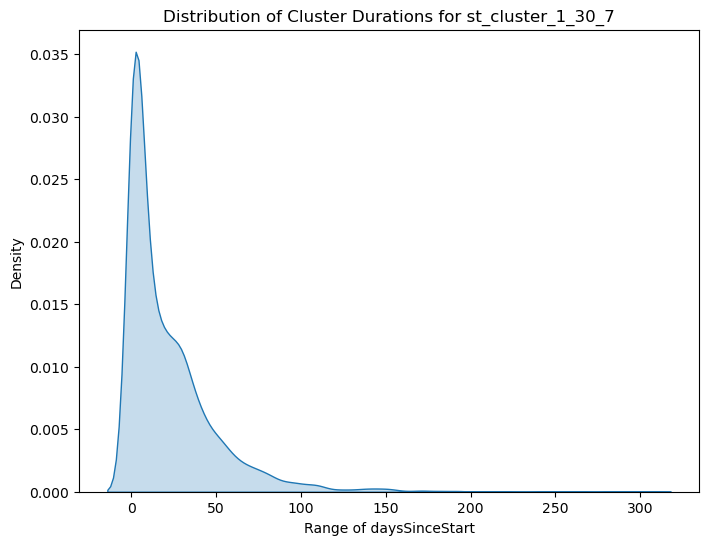

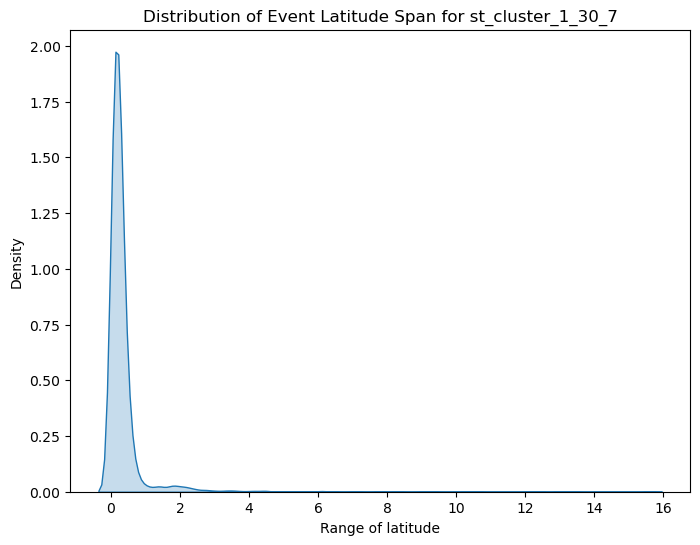

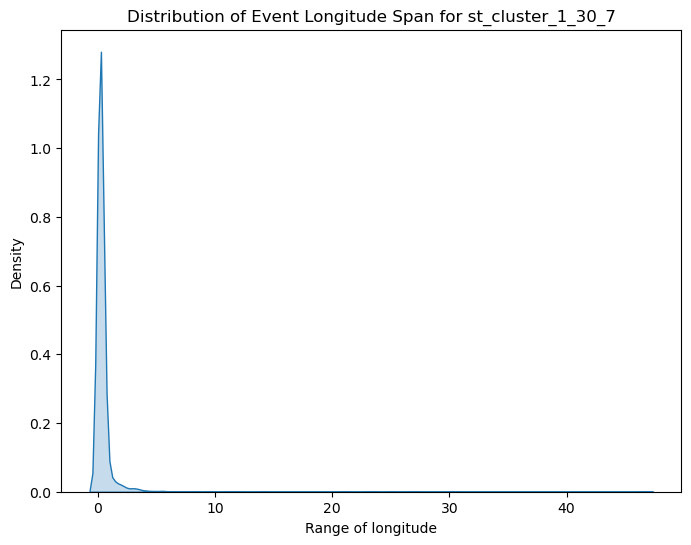


Analyzing st_cluster field: st_cluster_1_30_10


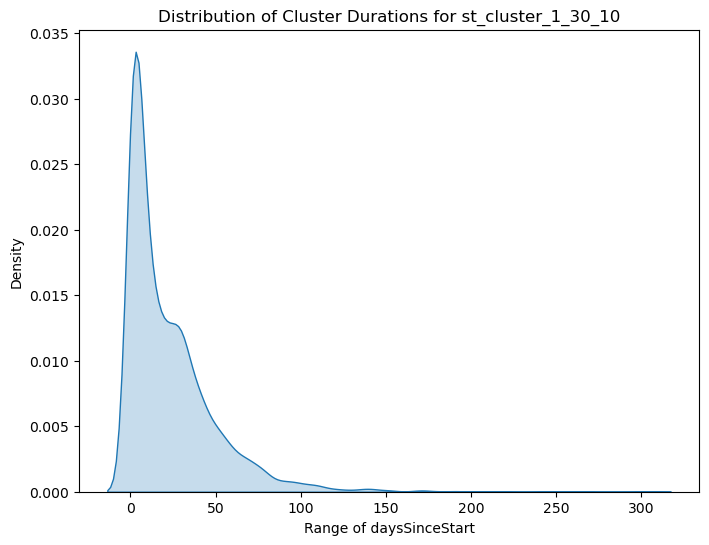

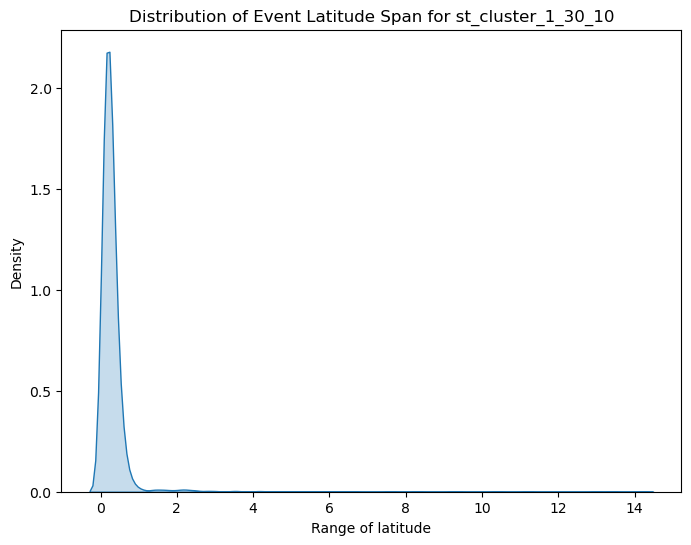

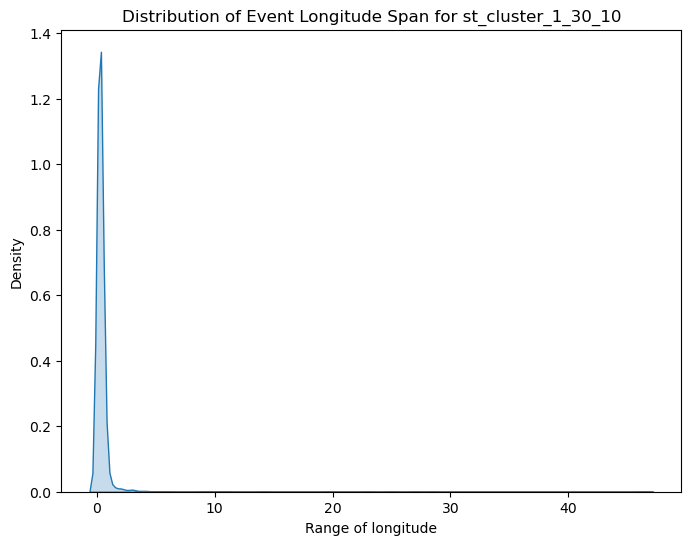


Analyzing st_cluster field: st_cluster_2_3_3


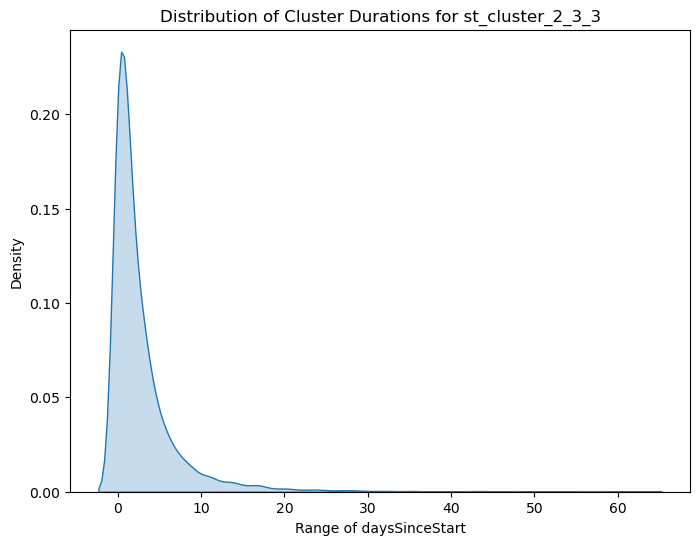

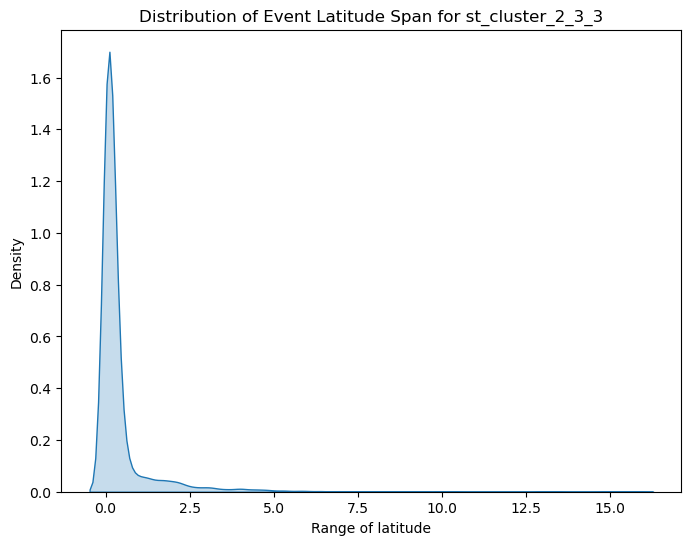

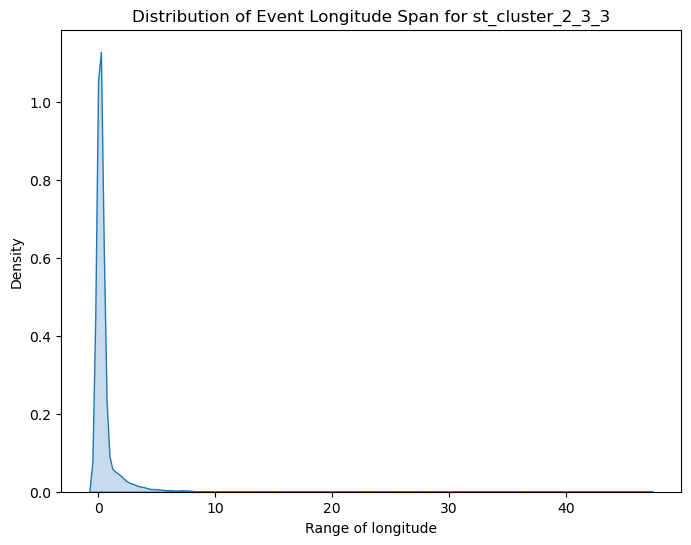


Analyzing st_cluster field: st_cluster_2_3_5


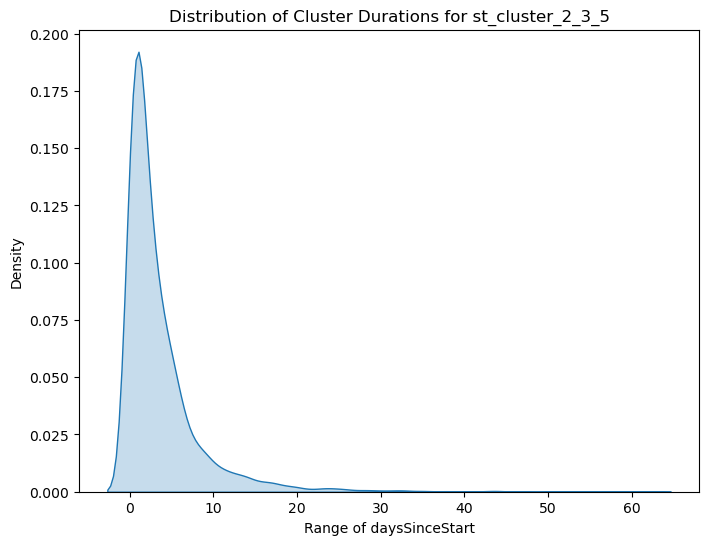

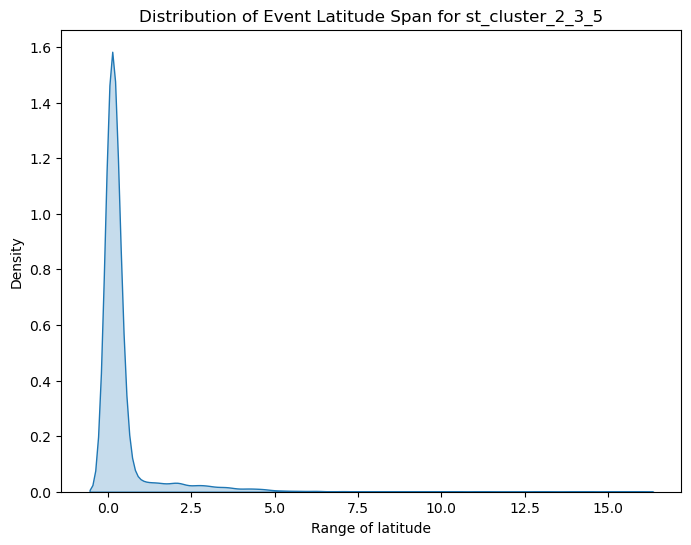

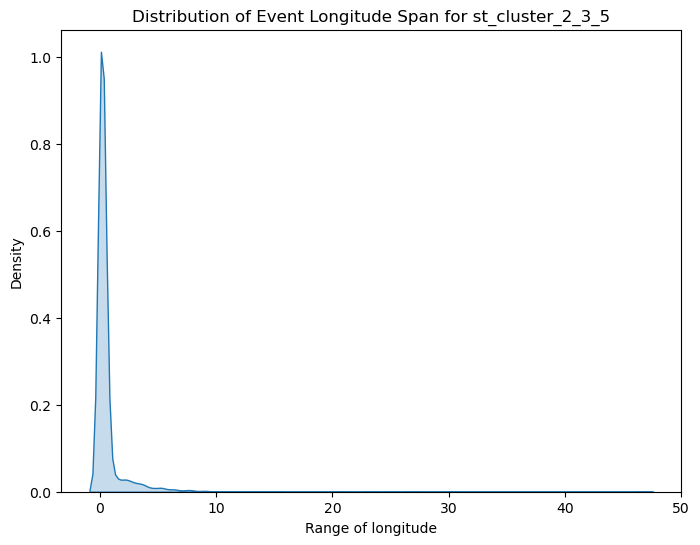


Analyzing st_cluster field: st_cluster_2_3_7


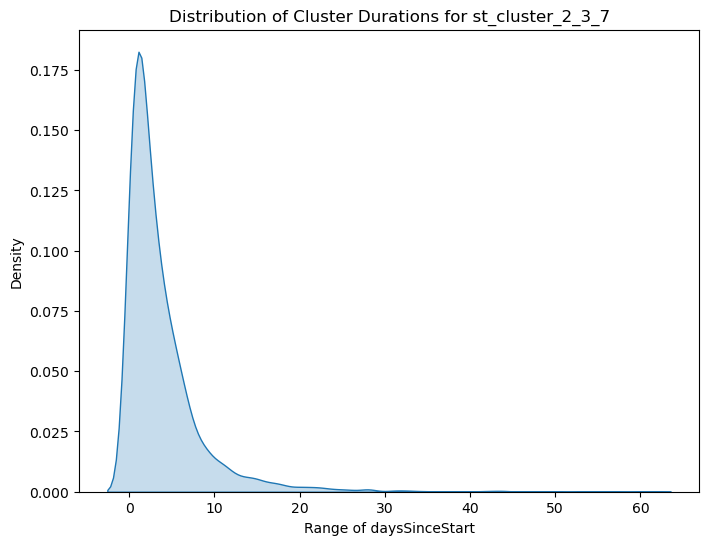

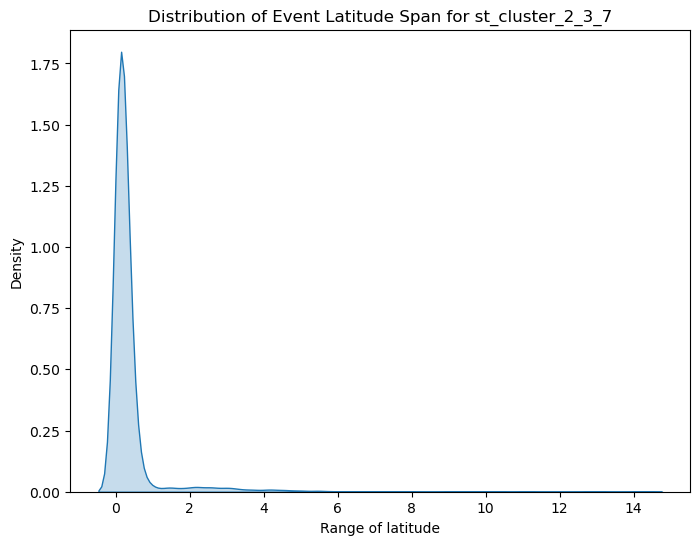

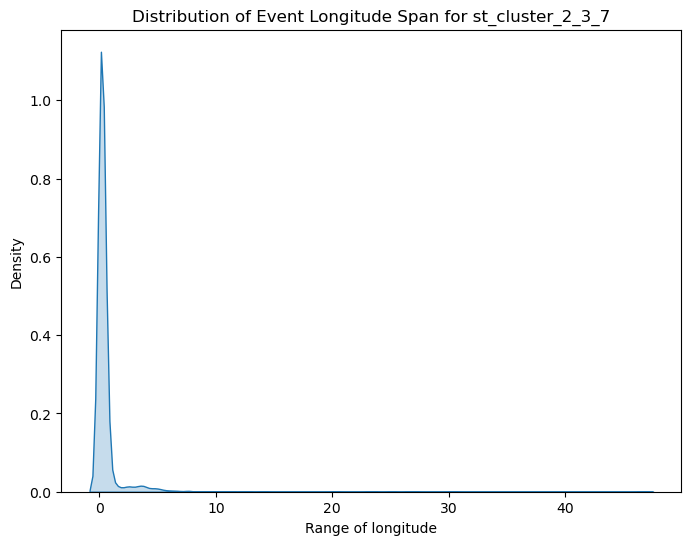


Analyzing st_cluster field: st_cluster_2_3_10


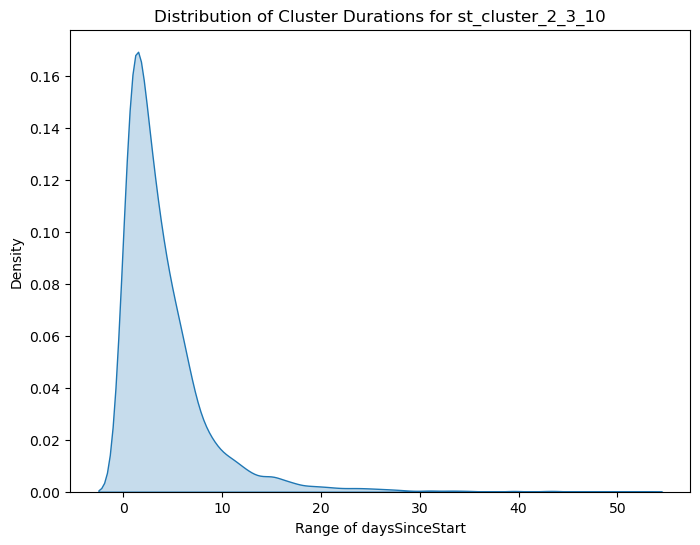

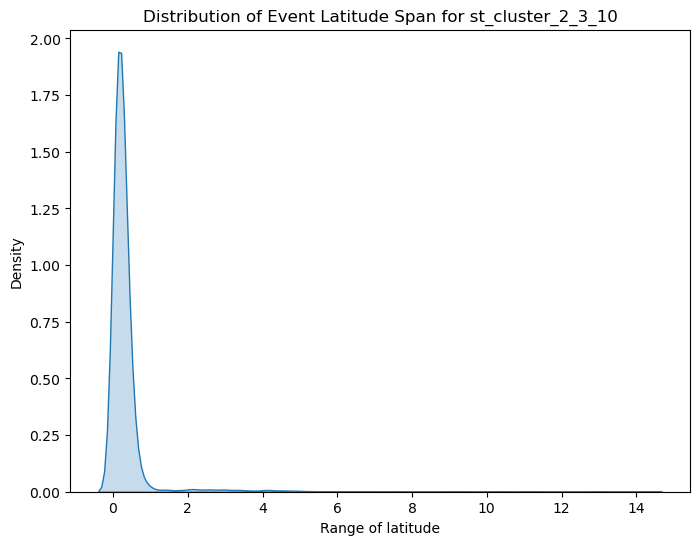

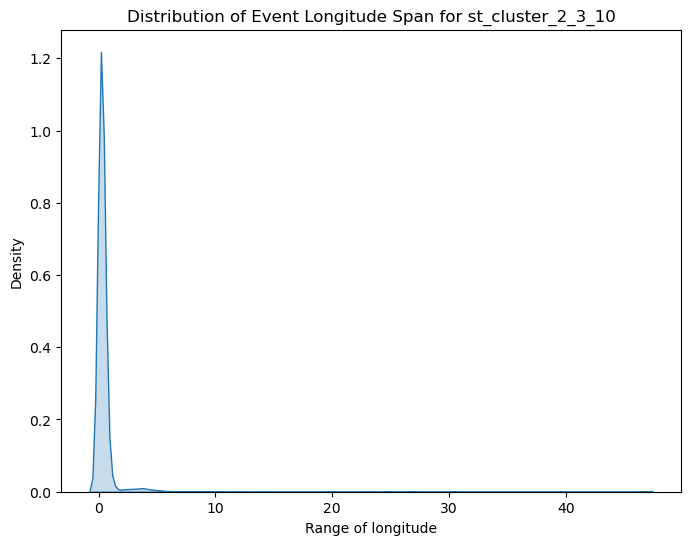


Analyzing st_cluster field: st_cluster_2_5_3


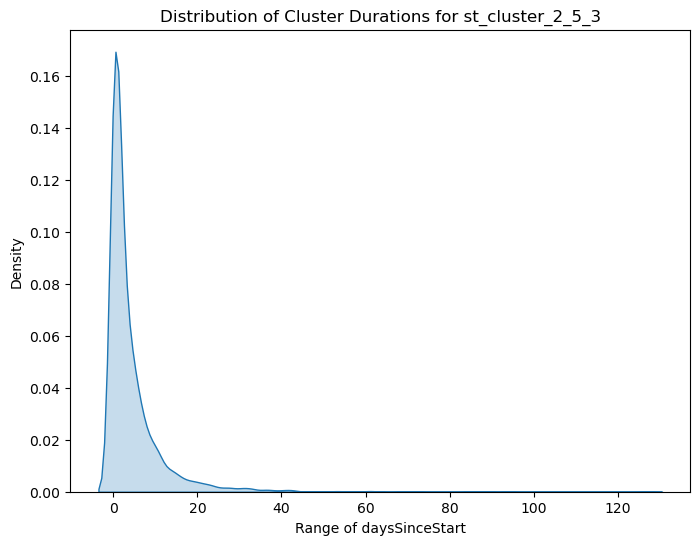

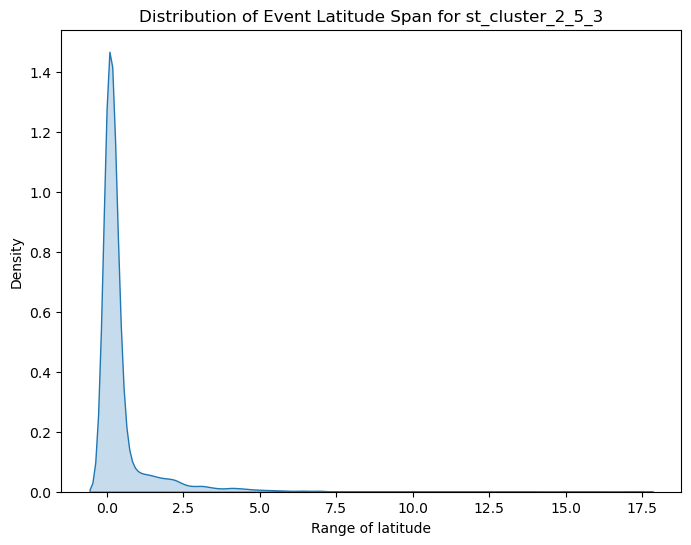

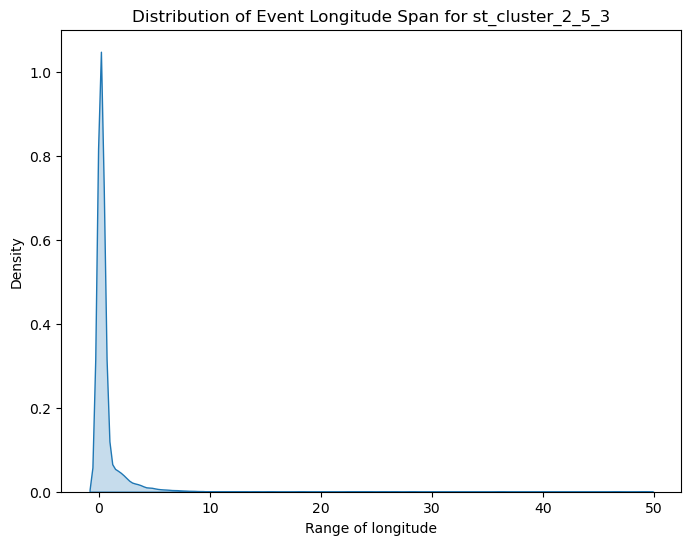


Analyzing st_cluster field: st_cluster_2_5_5


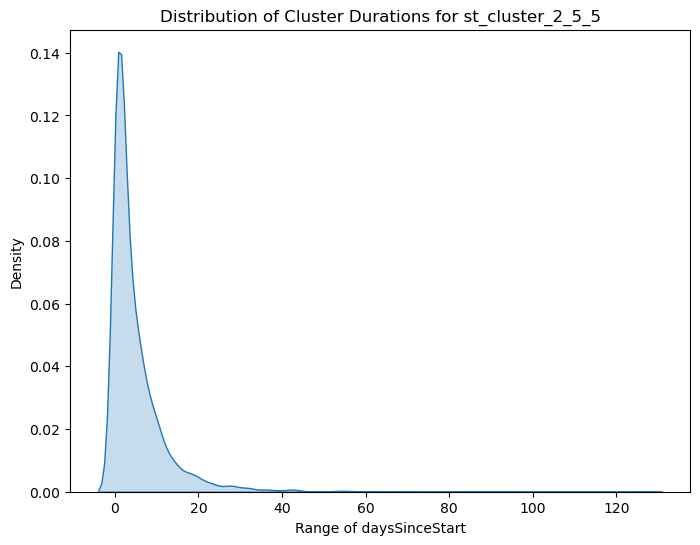

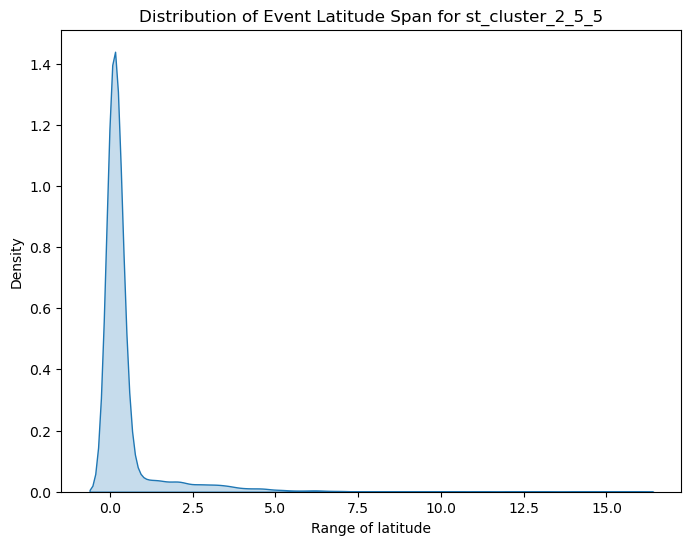

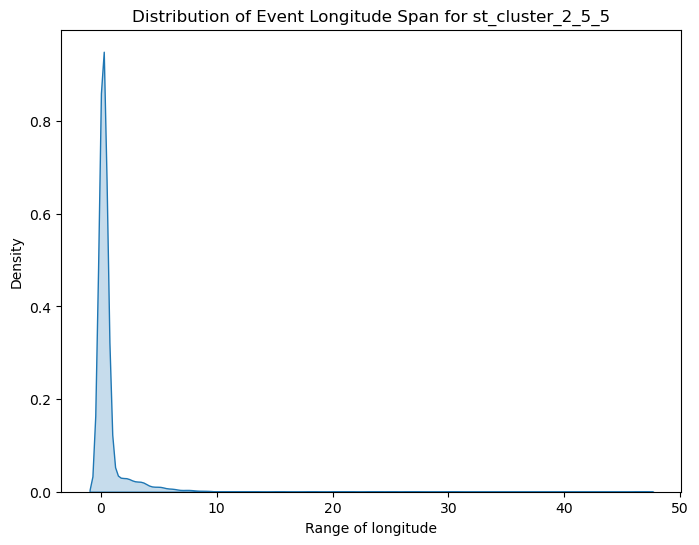


Analyzing st_cluster field: st_cluster_2_5_7


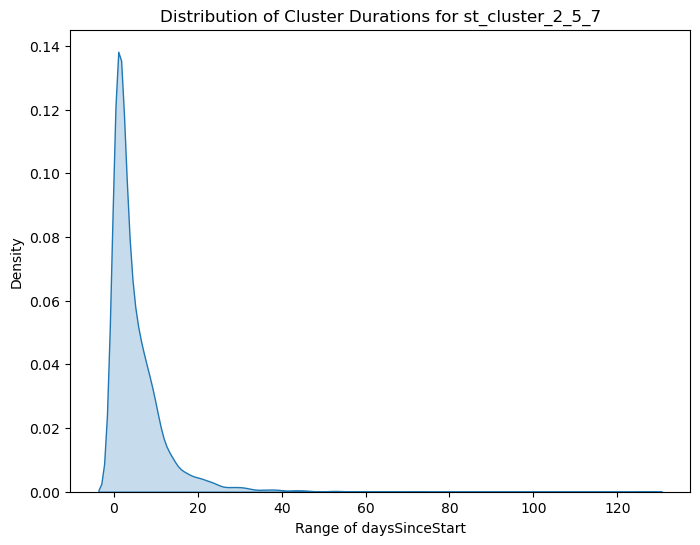

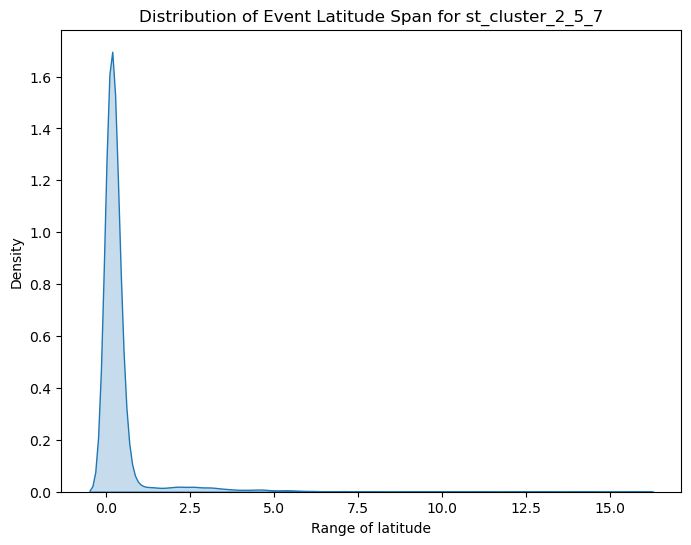

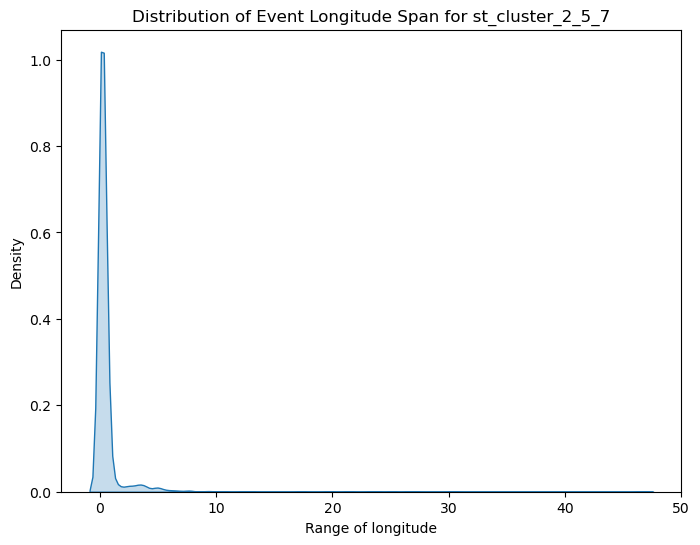


Analyzing st_cluster field: st_cluster_2_5_10


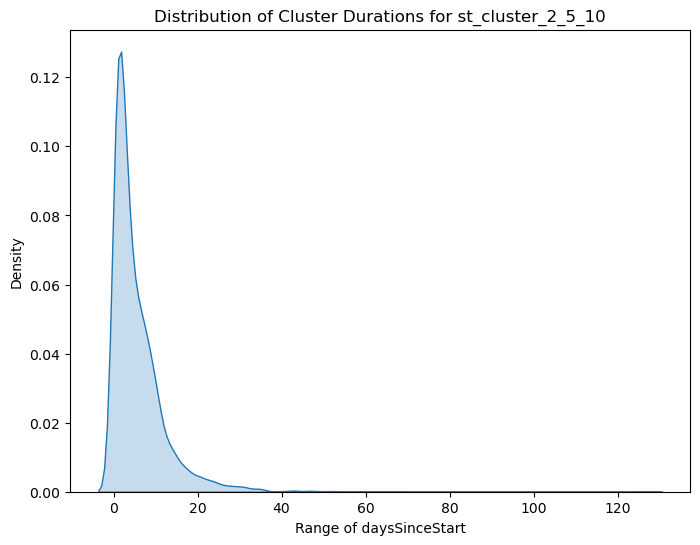

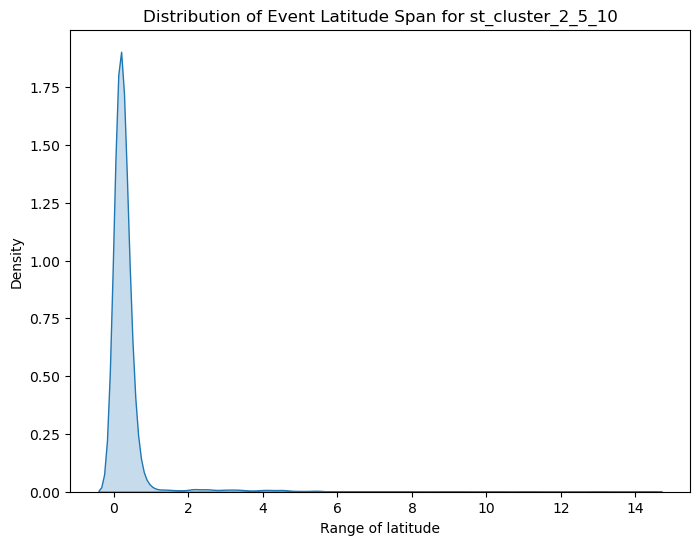

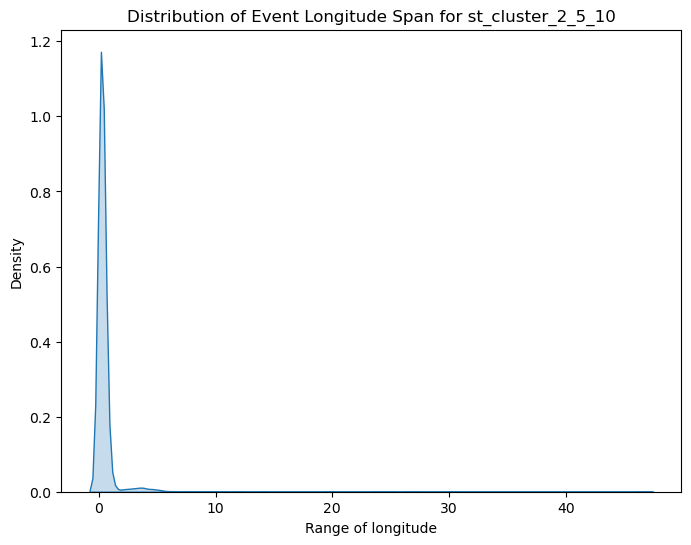


Analyzing st_cluster field: st_cluster_2_7_3


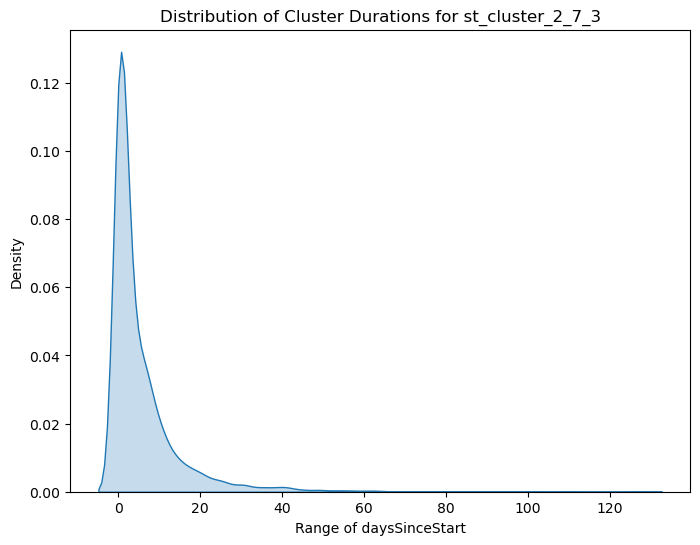

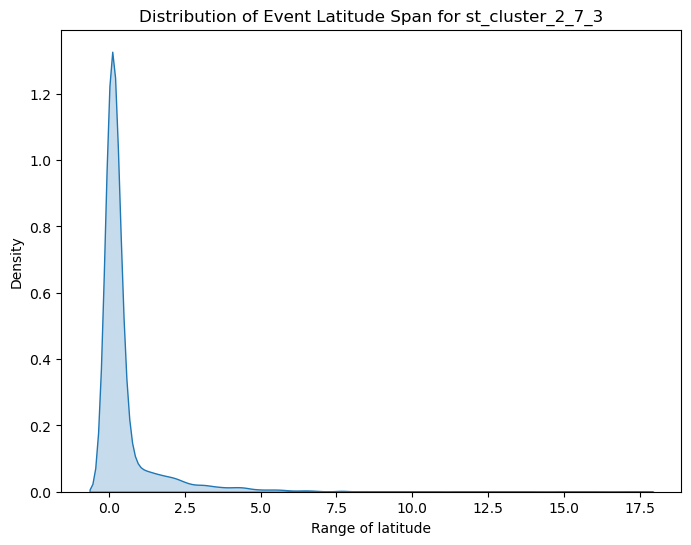

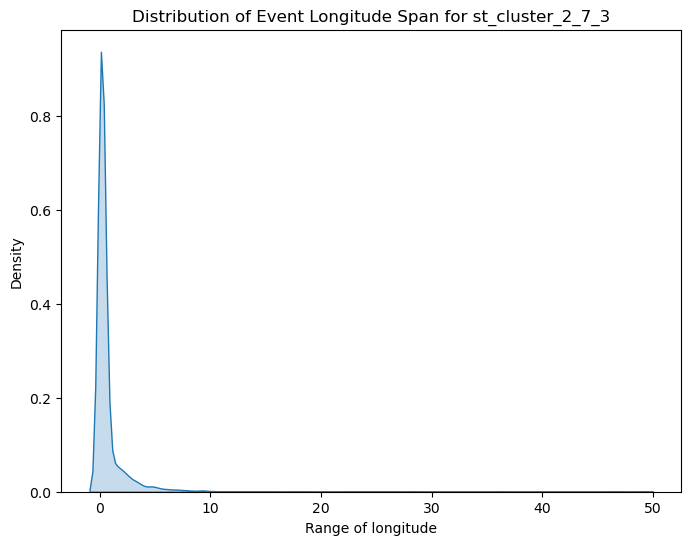


Analyzing st_cluster field: st_cluster_2_7_5


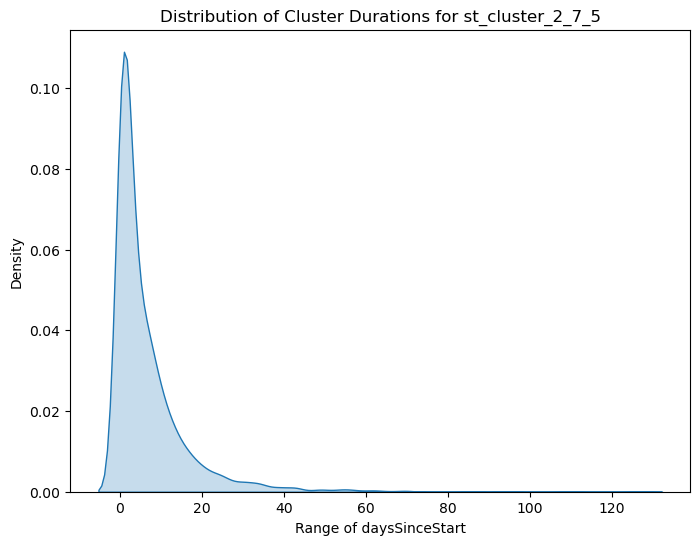

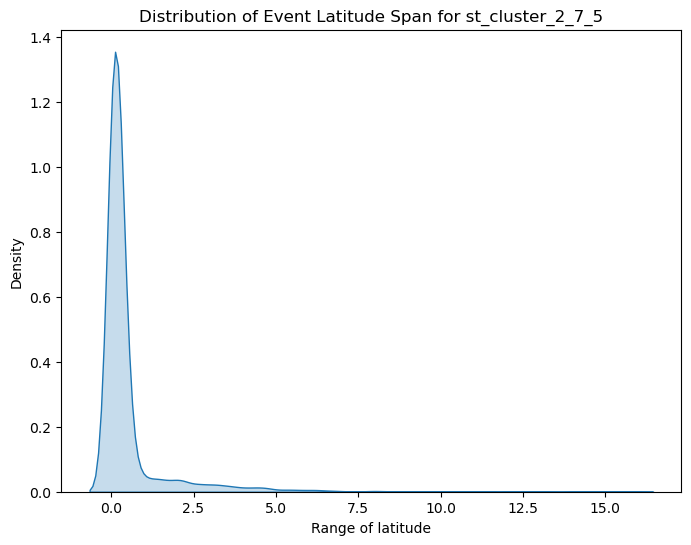

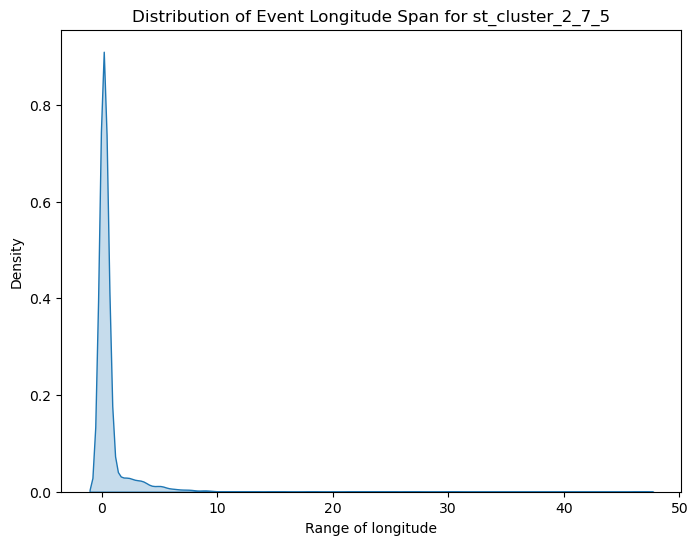


Analyzing st_cluster field: st_cluster_2_7_7


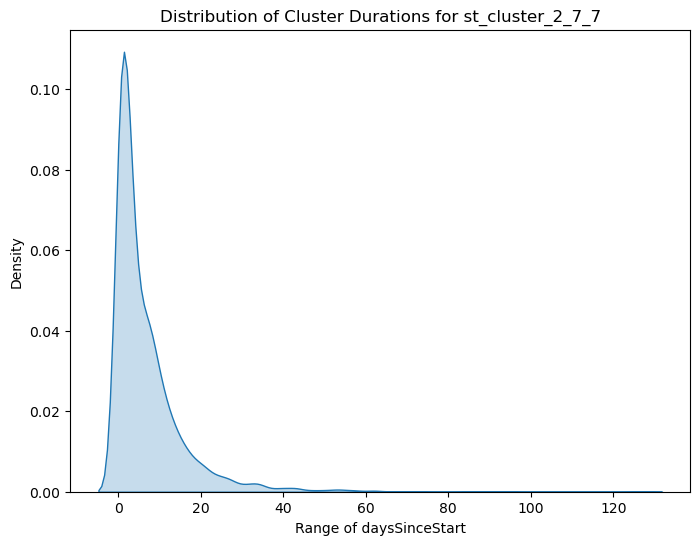

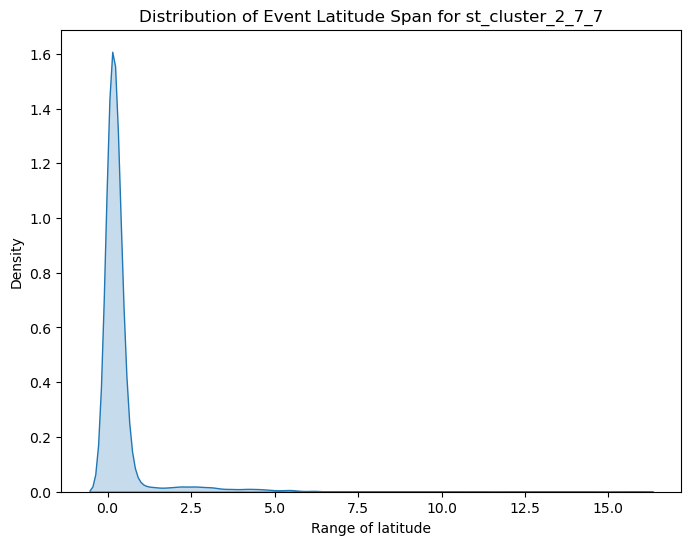

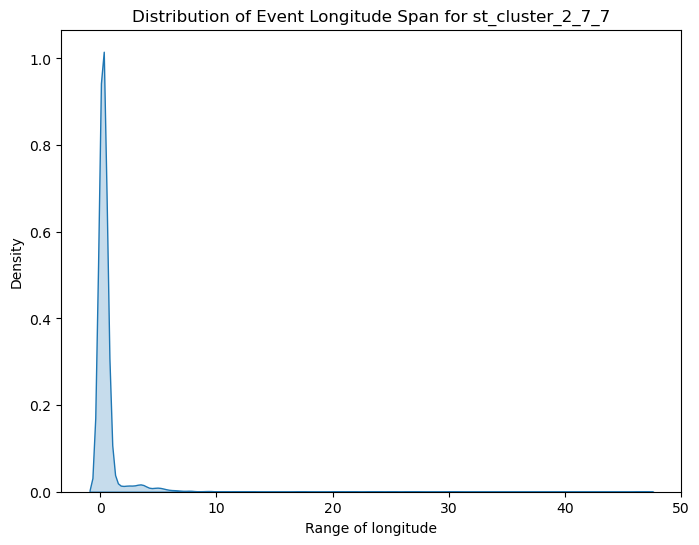


Analyzing st_cluster field: st_cluster_2_7_10


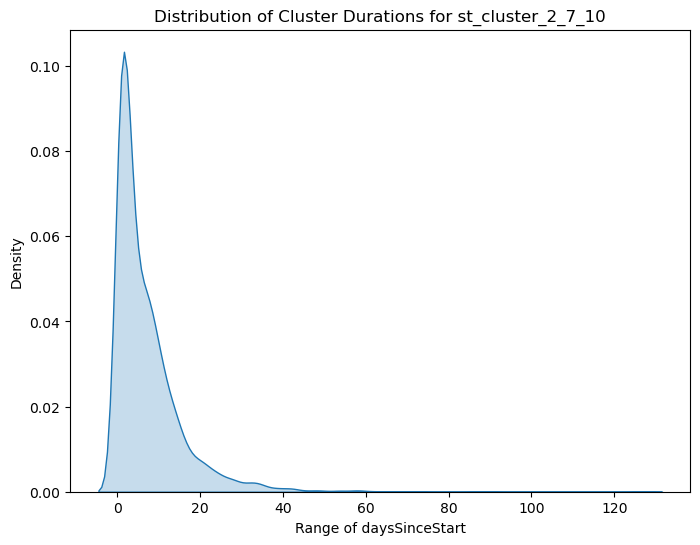

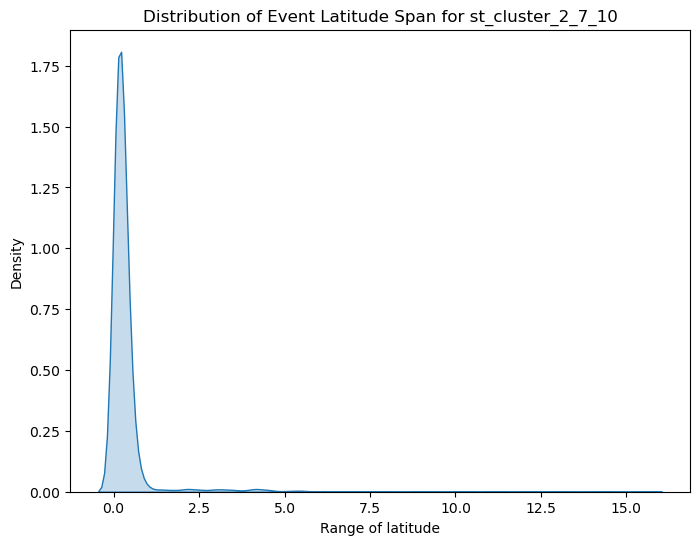

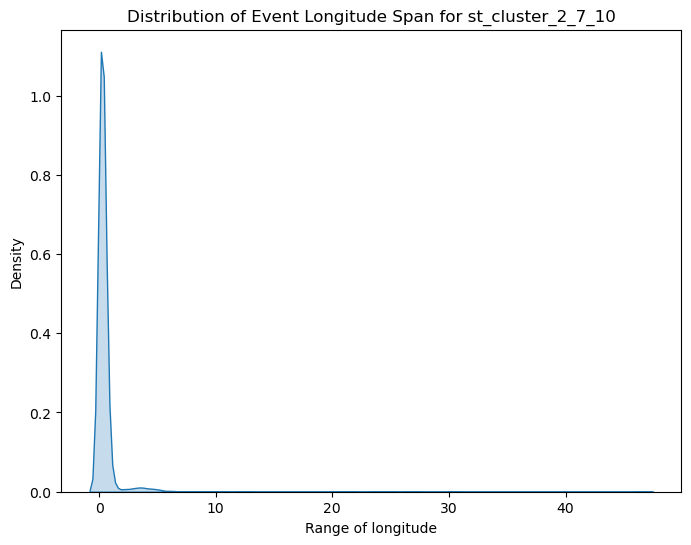


Analyzing st_cluster field: st_cluster_2_14_3


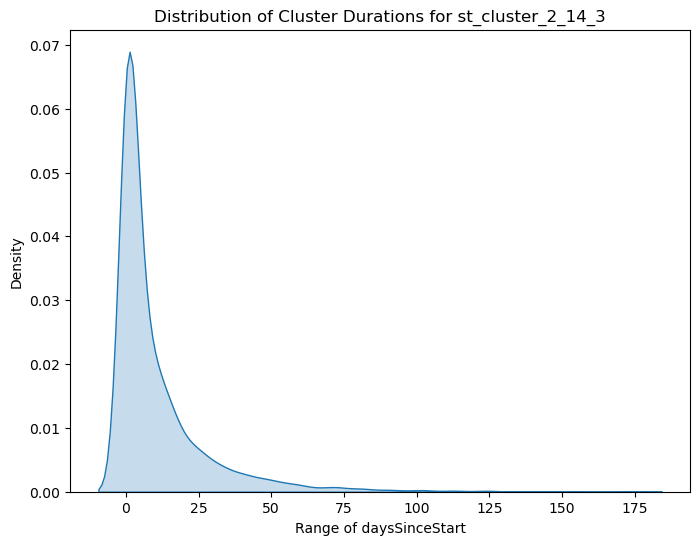

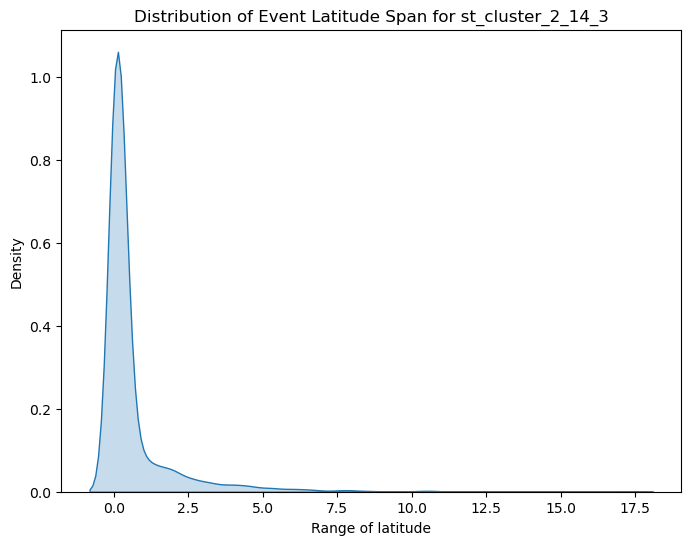

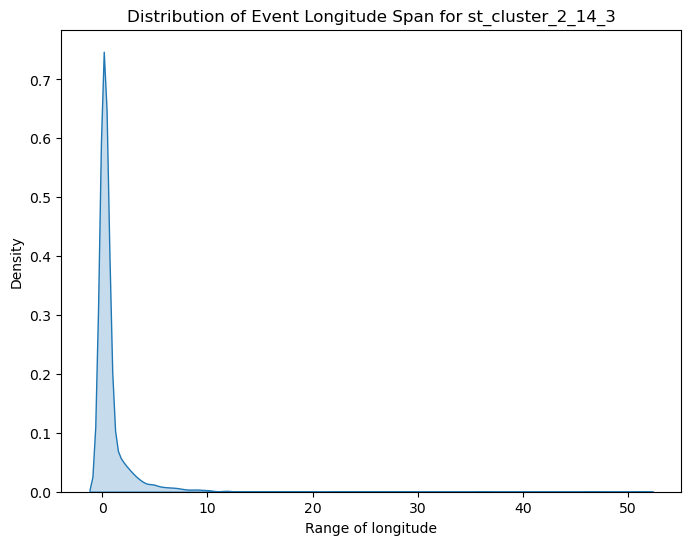


Analyzing st_cluster field: st_cluster_2_14_5


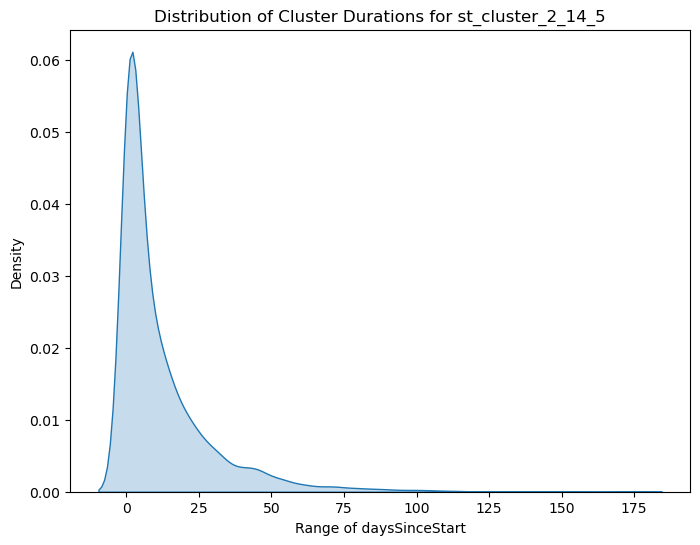

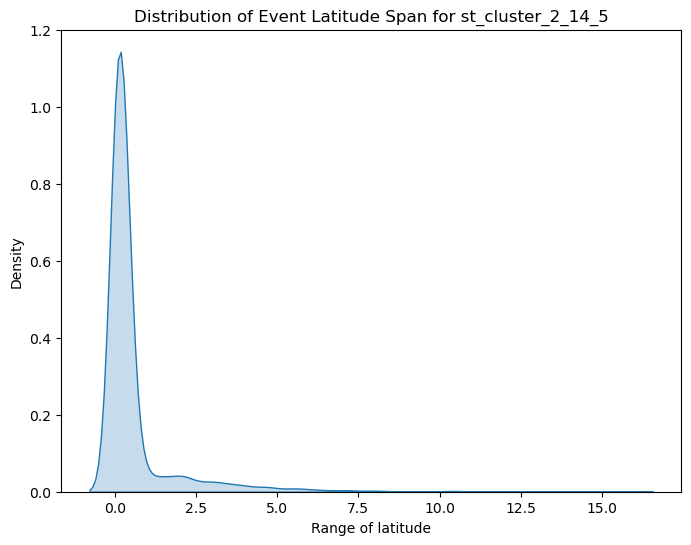

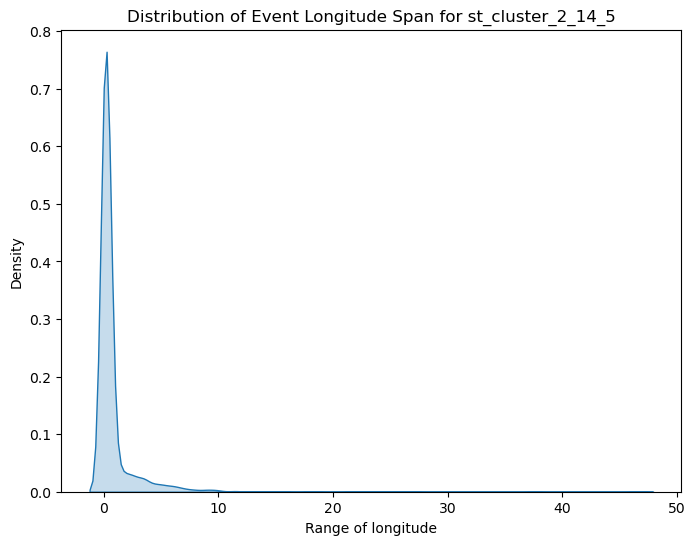


Analyzing st_cluster field: st_cluster_2_14_7


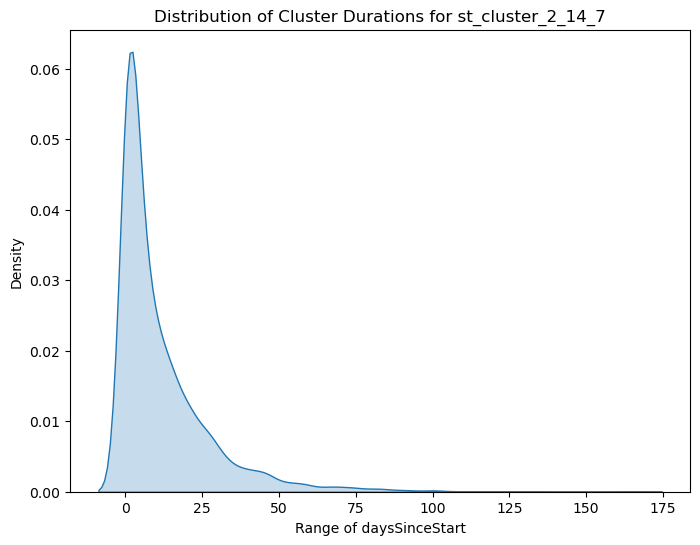

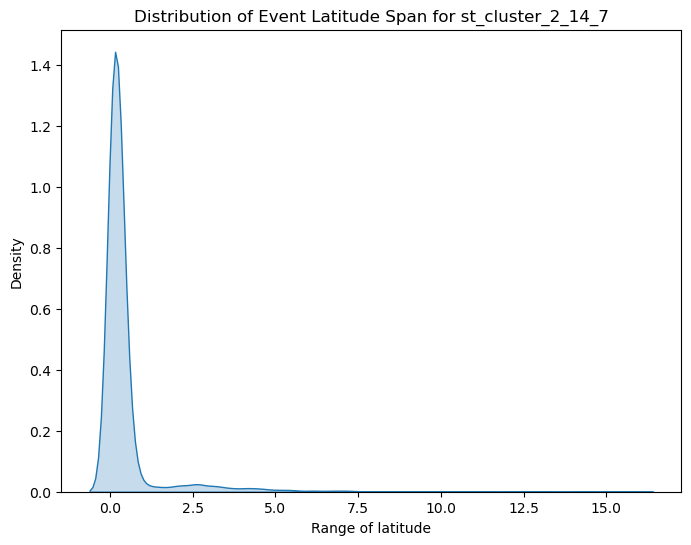

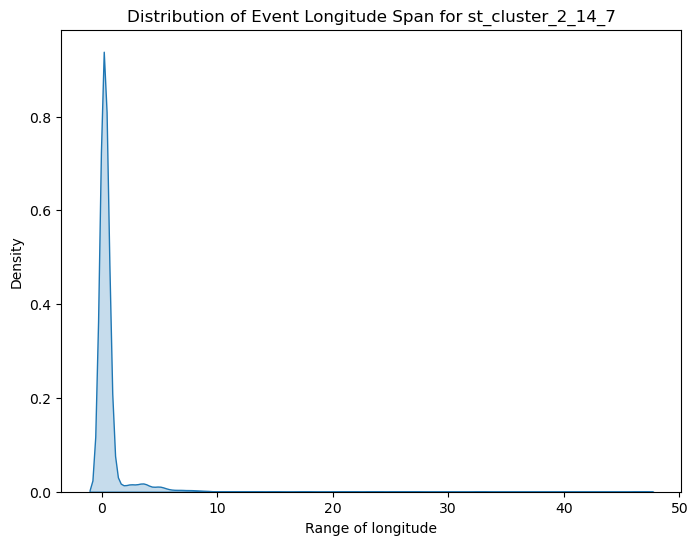


Analyzing st_cluster field: st_cluster_2_14_10


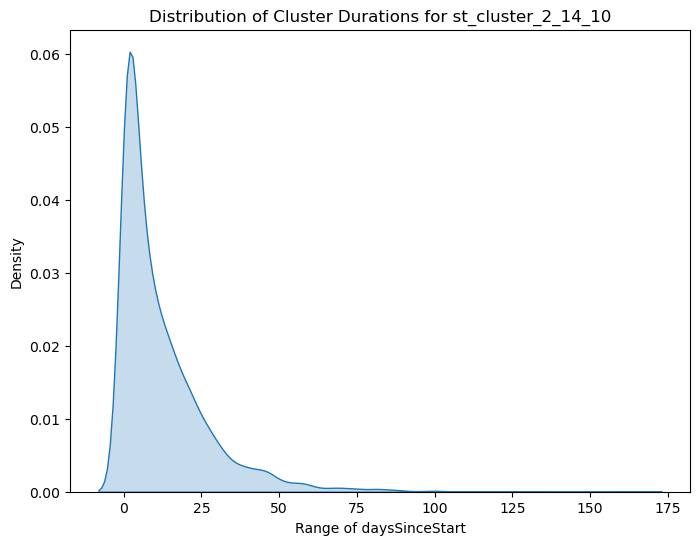

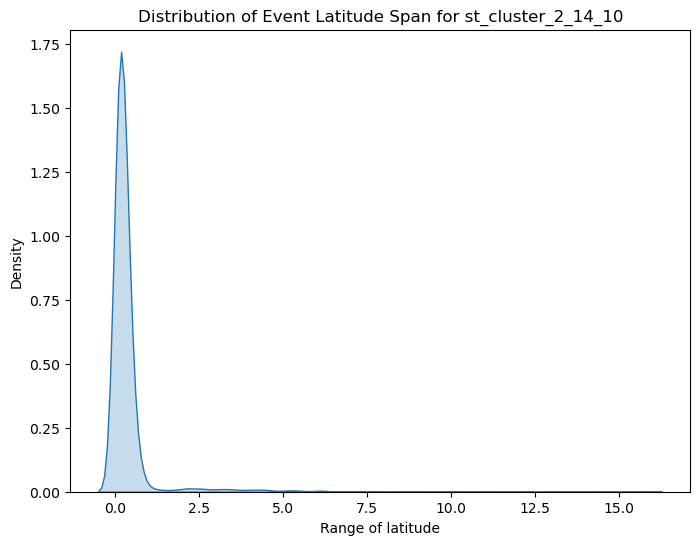

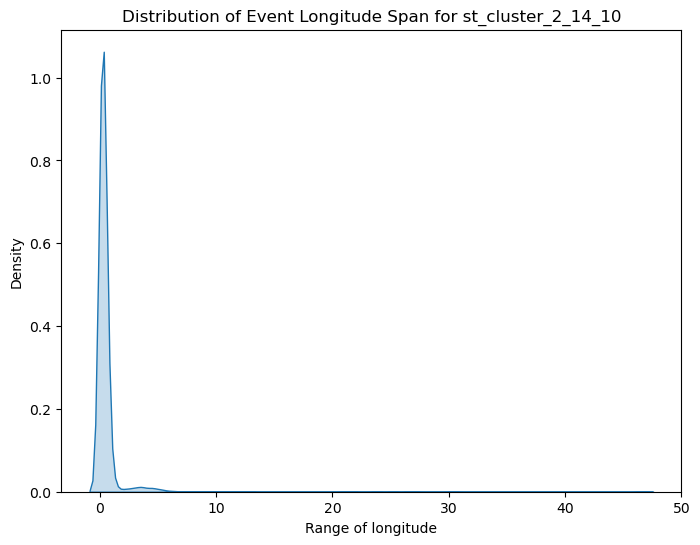


Analyzing st_cluster field: st_cluster_2_30_3


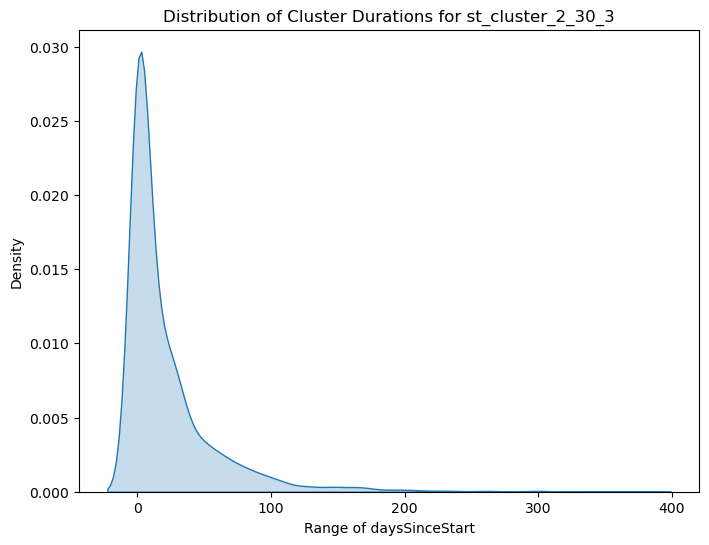

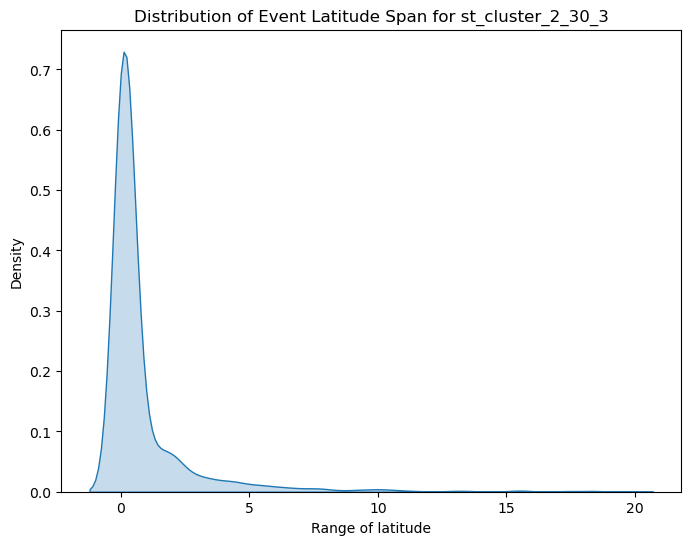

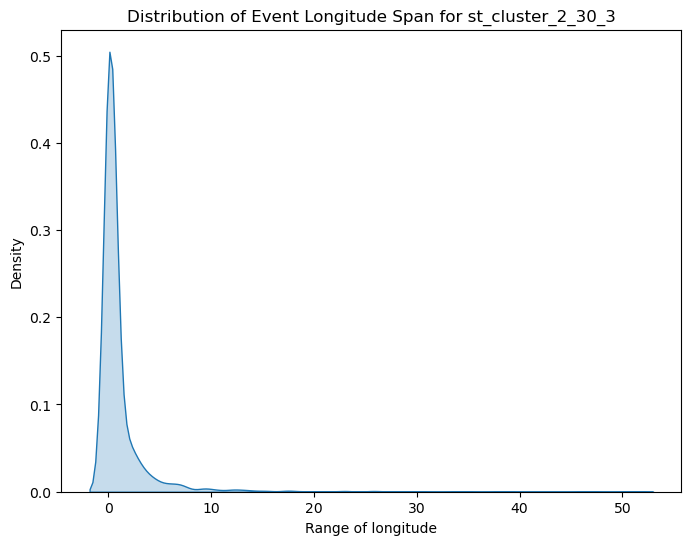


Analyzing st_cluster field: st_cluster_2_30_5


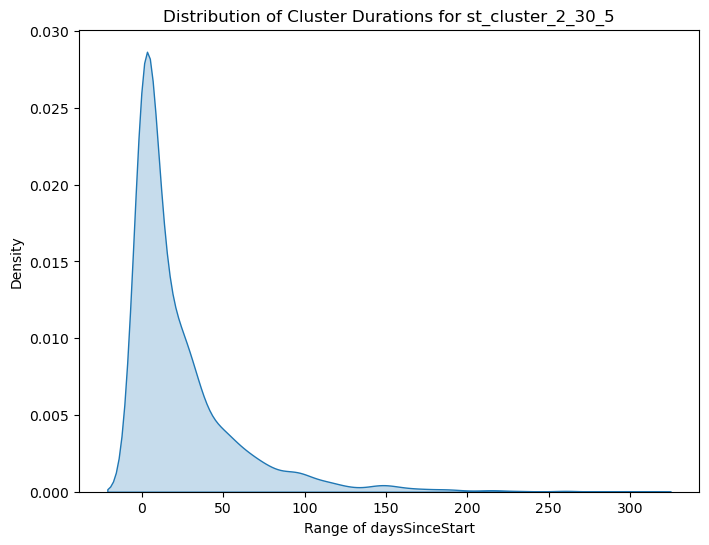

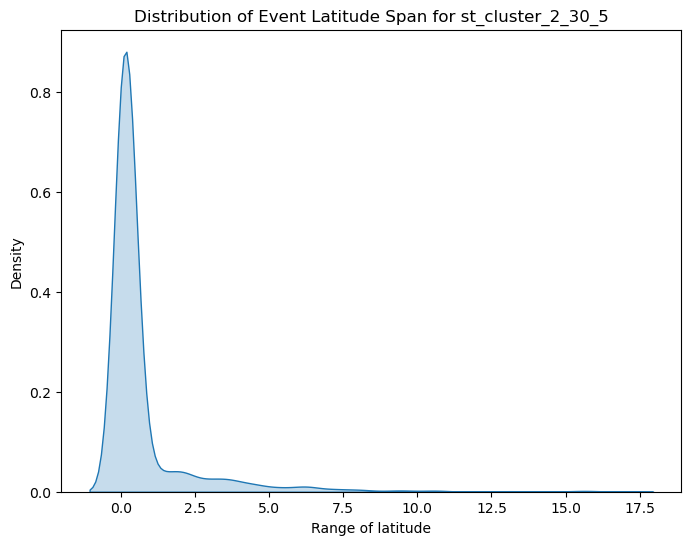

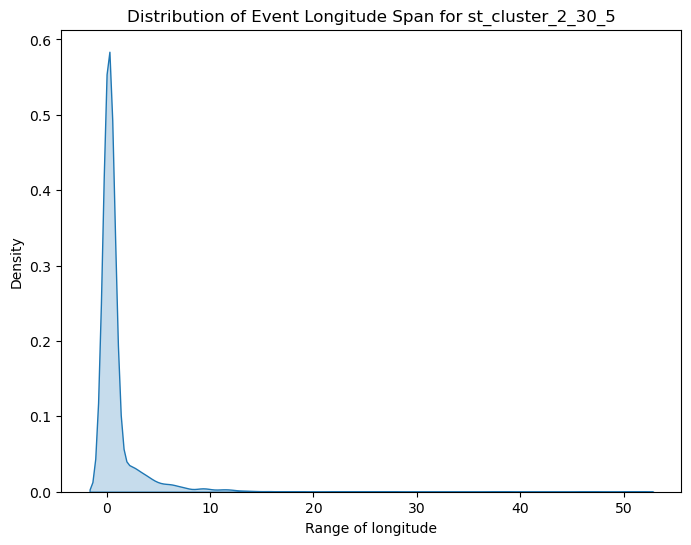


Analyzing st_cluster field: st_cluster_2_30_7


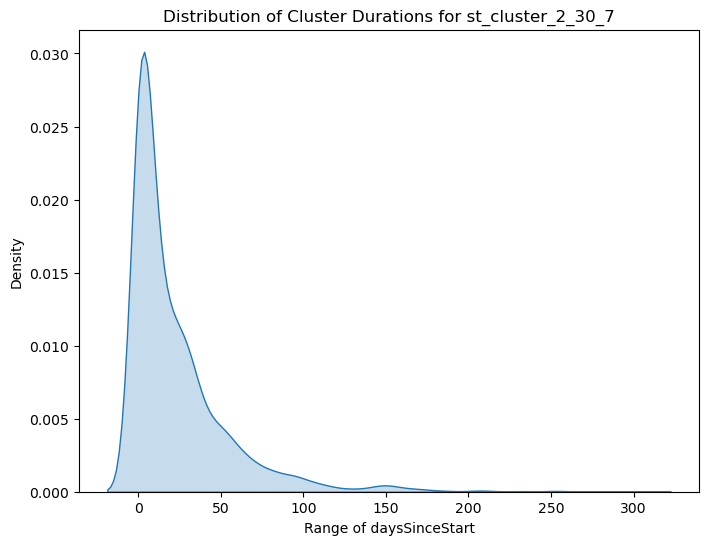

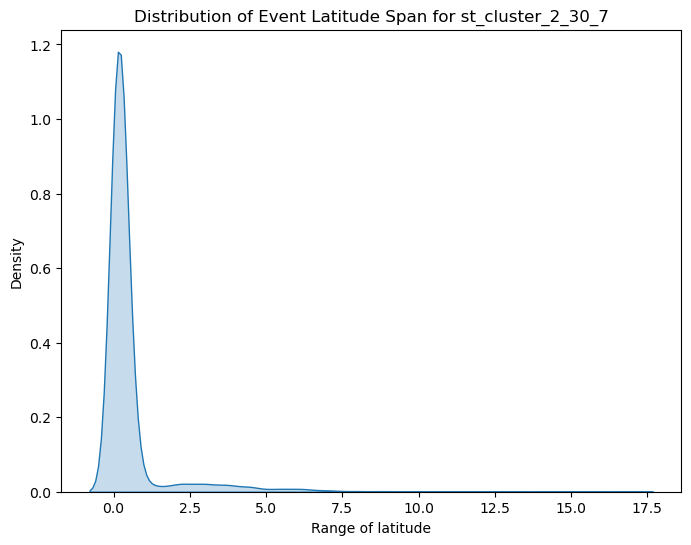

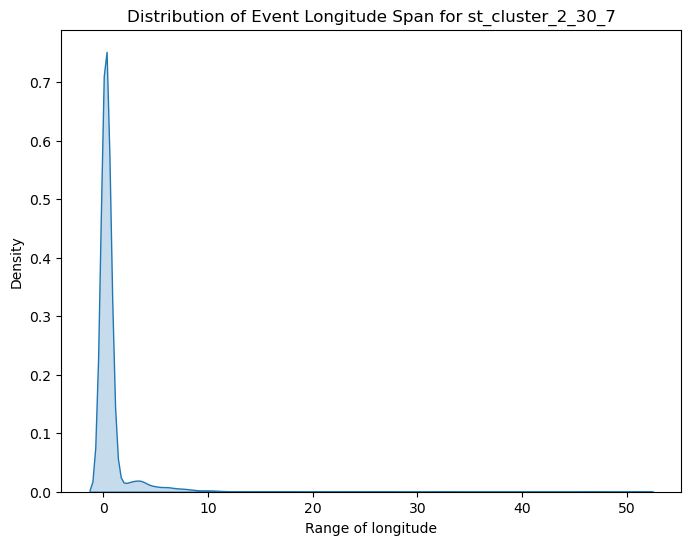


Analyzing st_cluster field: st_cluster_2_30_10


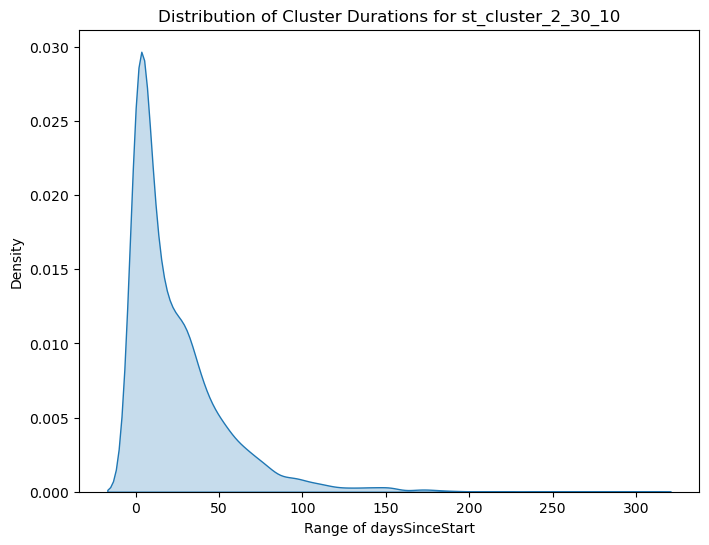

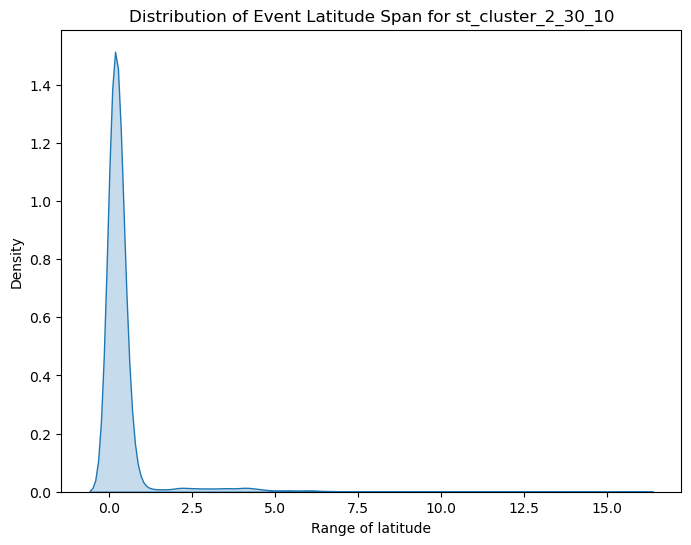

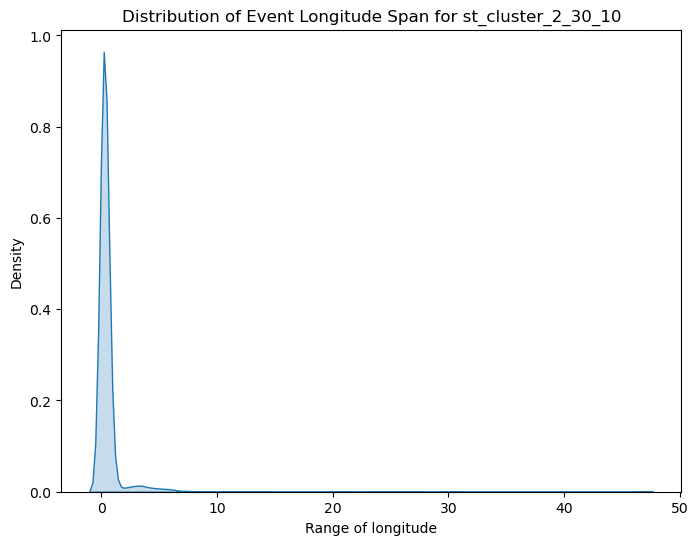


Analyzing st_cluster field: st_cluster_3_3_3


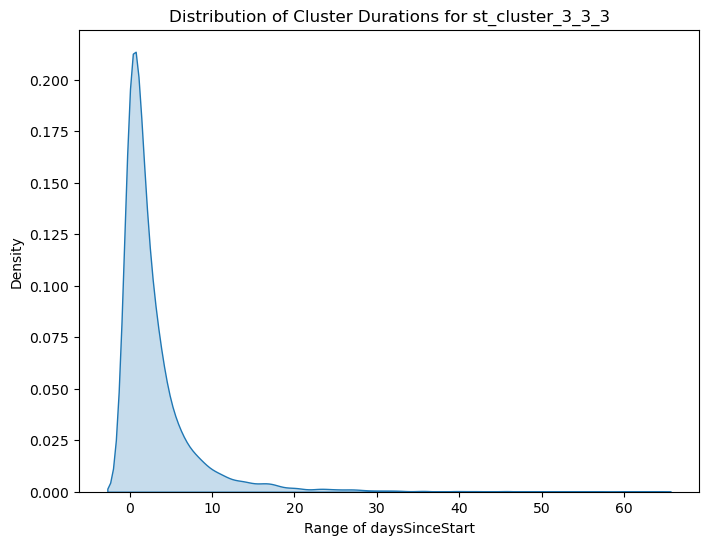

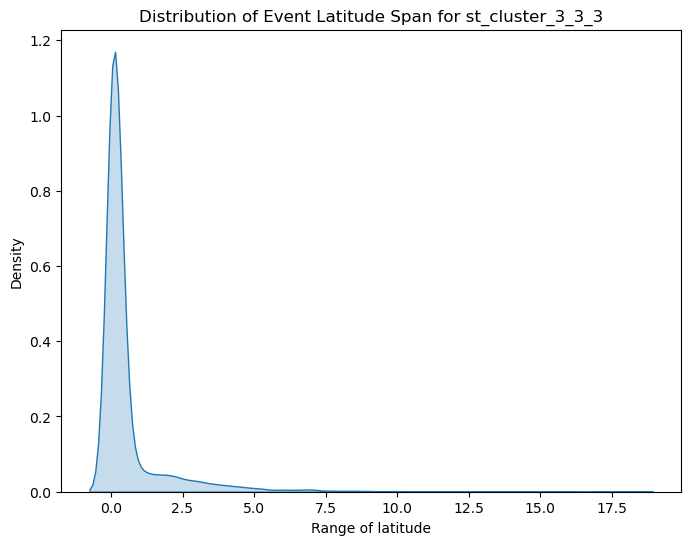

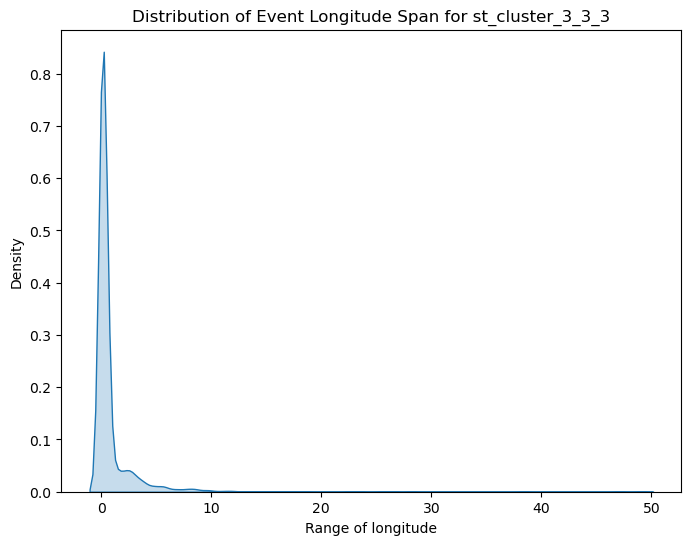


Analyzing st_cluster field: st_cluster_3_3_5


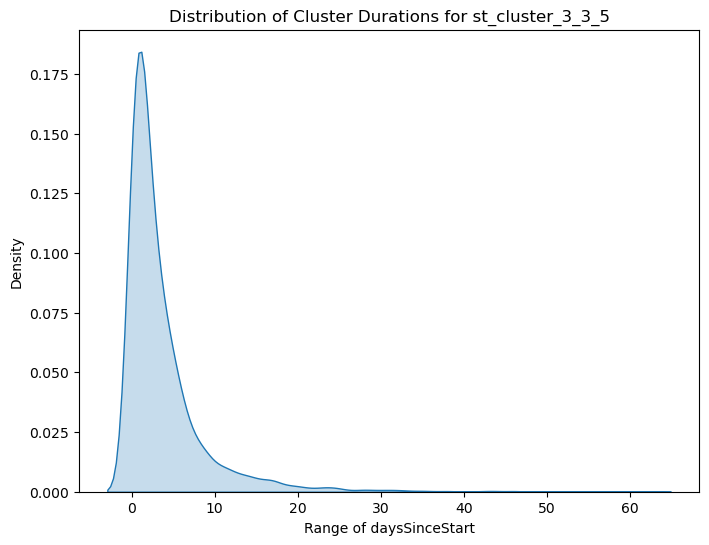

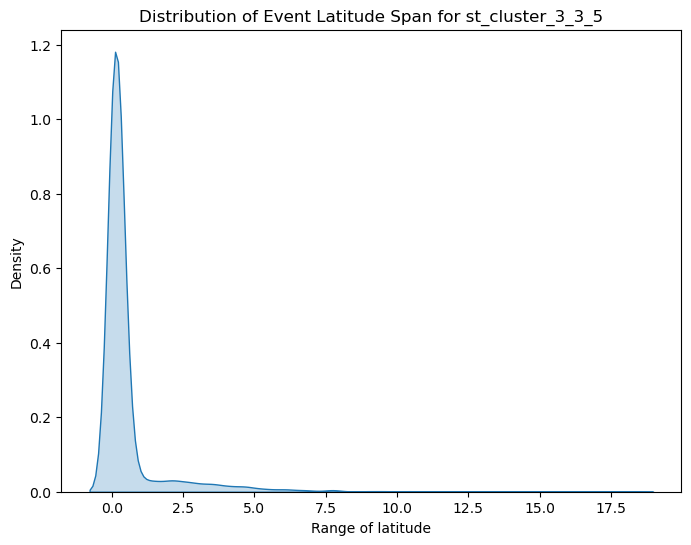

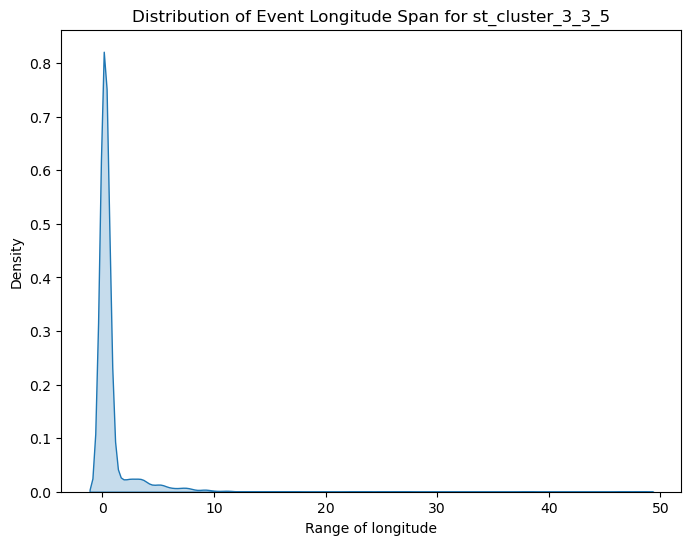


Analyzing st_cluster field: st_cluster_3_3_7


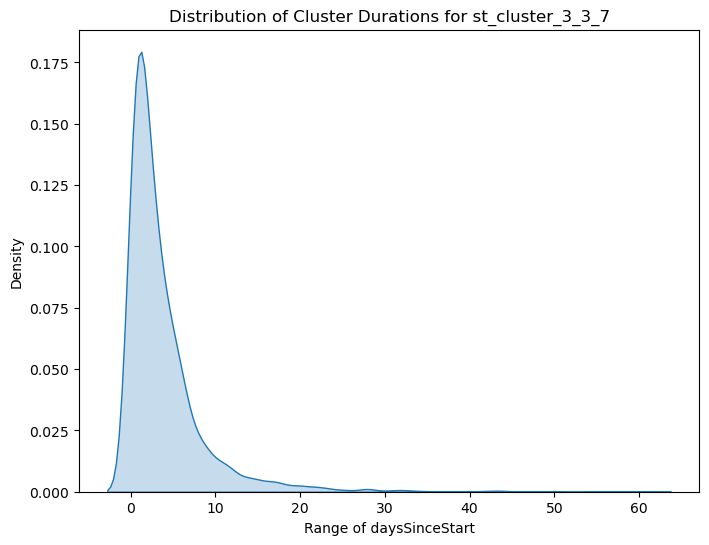

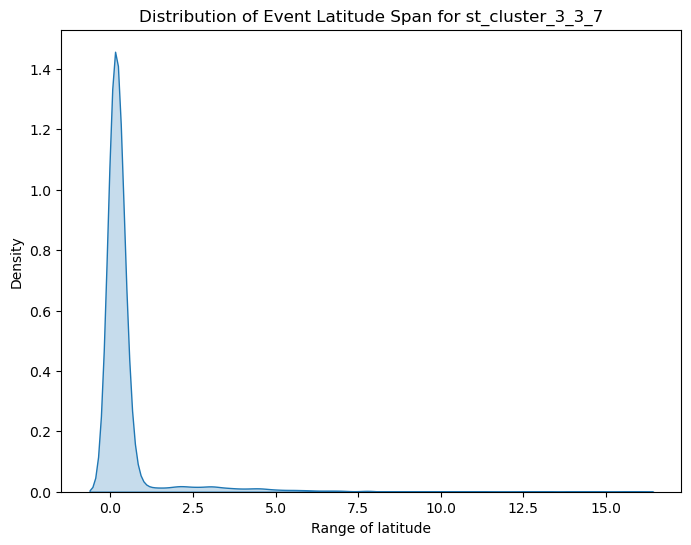

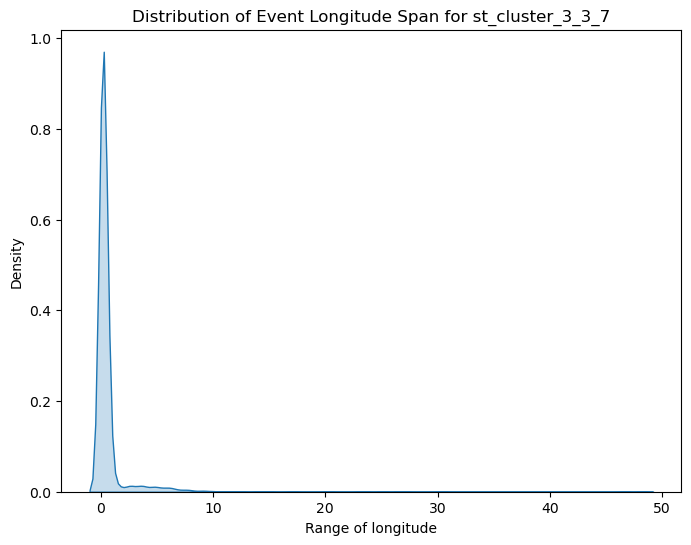


Analyzing st_cluster field: st_cluster_3_3_10


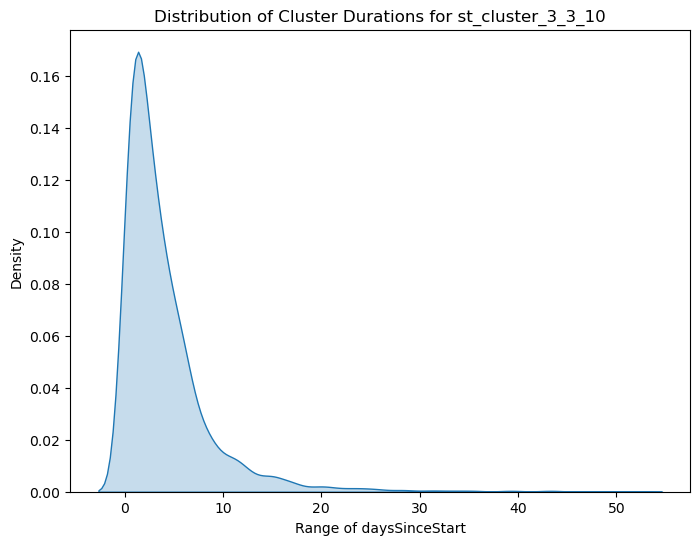

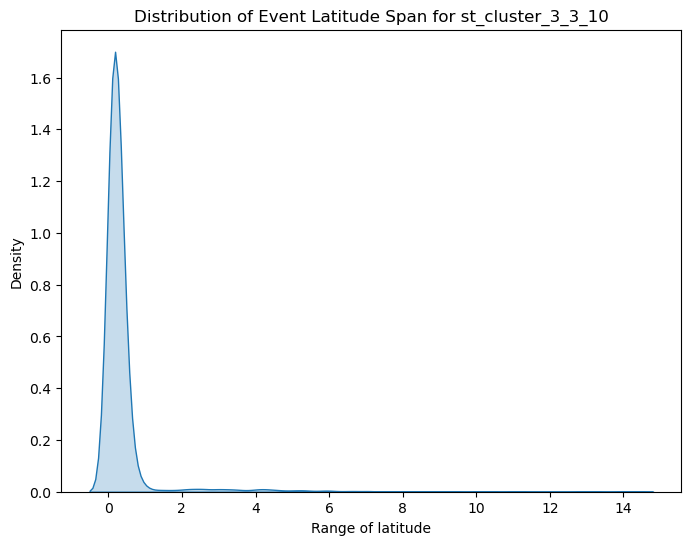

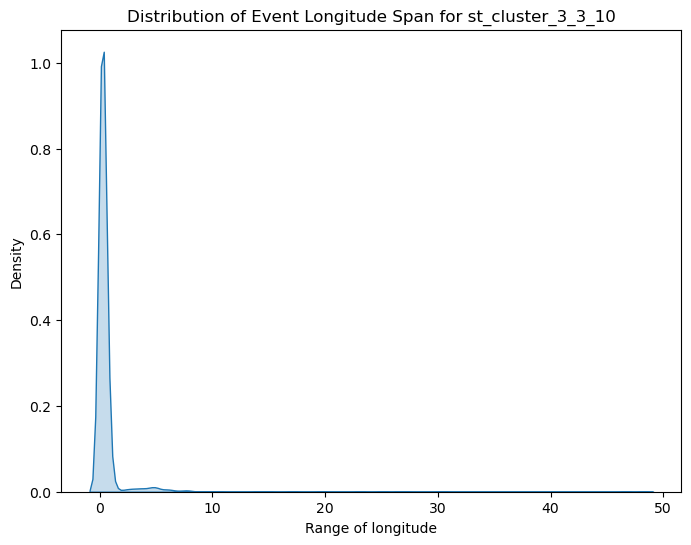


Analyzing st_cluster field: st_cluster_3_5_3


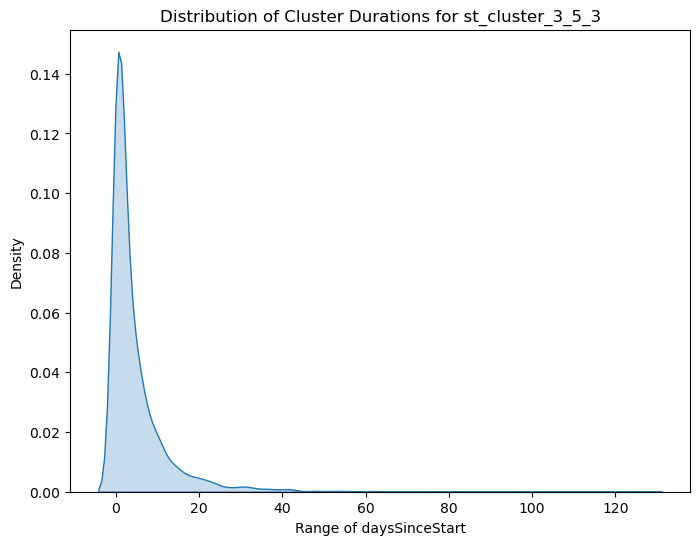

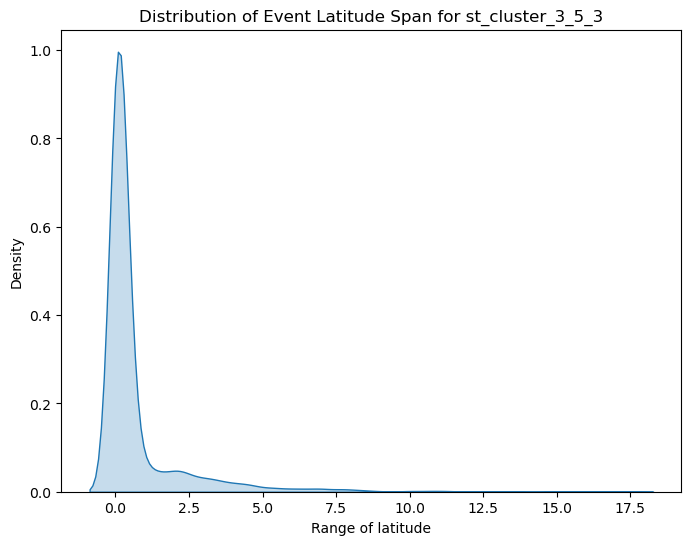

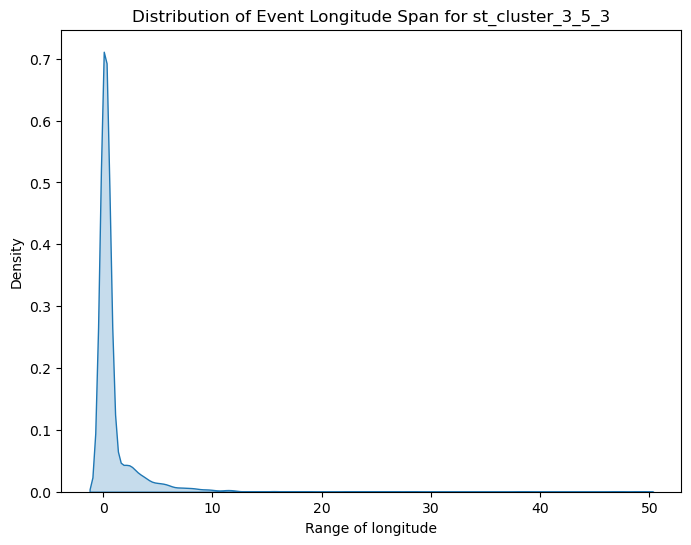


Analyzing st_cluster field: st_cluster_3_5_5


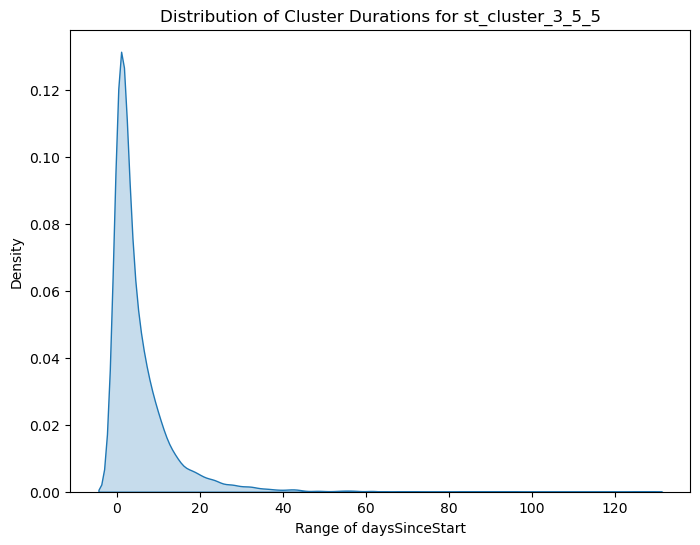

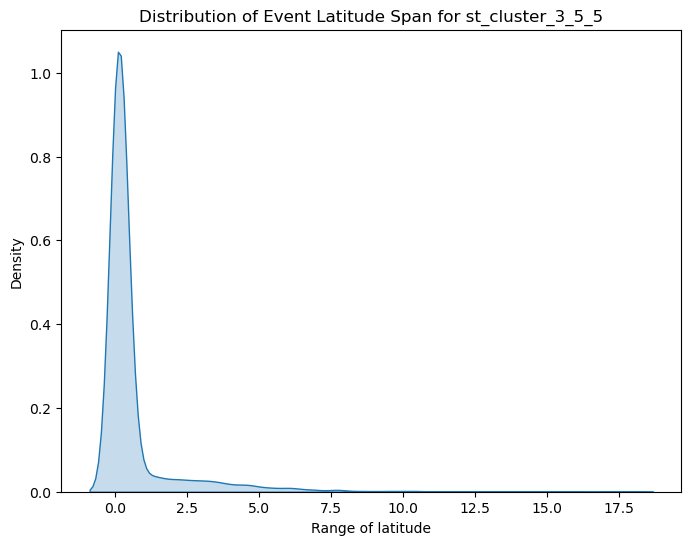

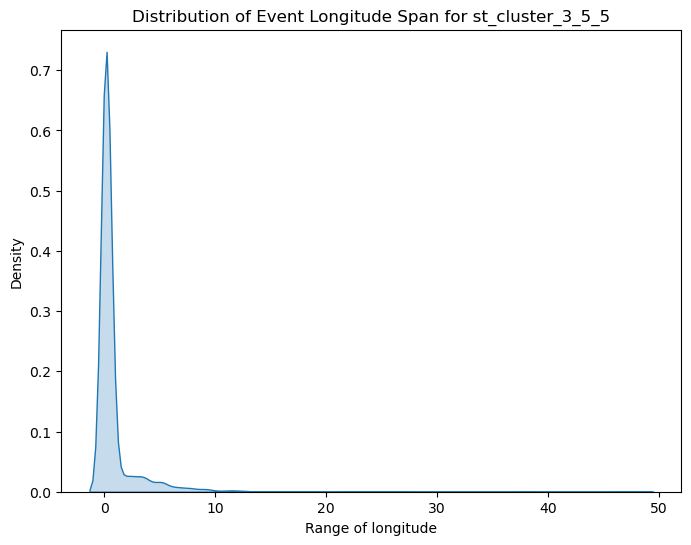


Analyzing st_cluster field: st_cluster_3_5_7


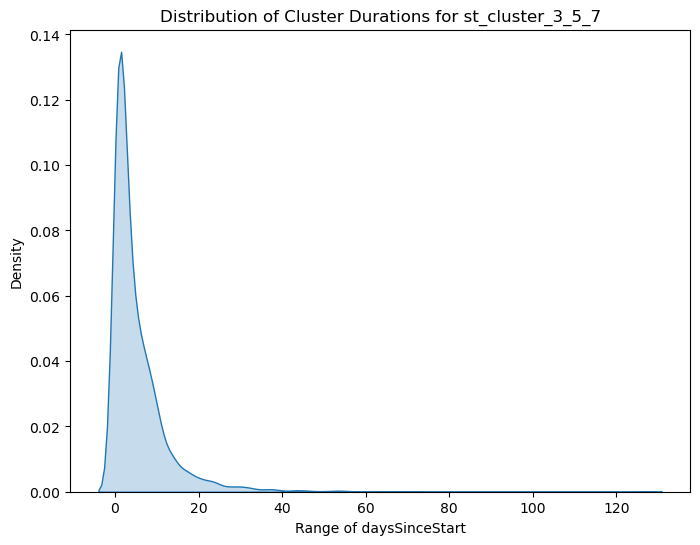

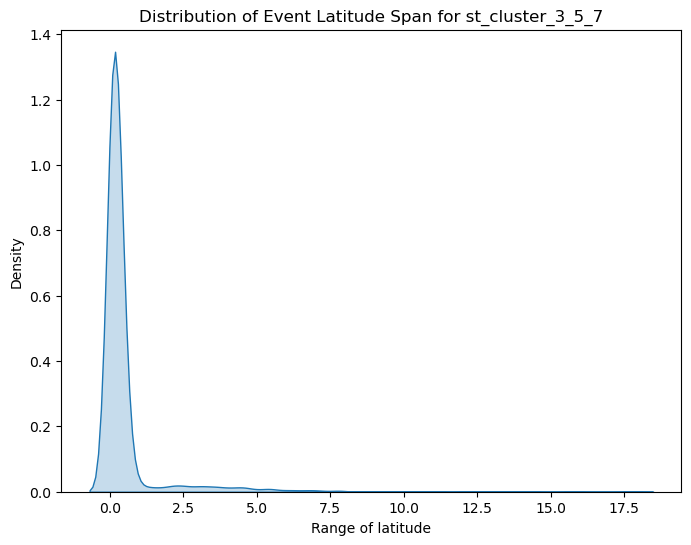

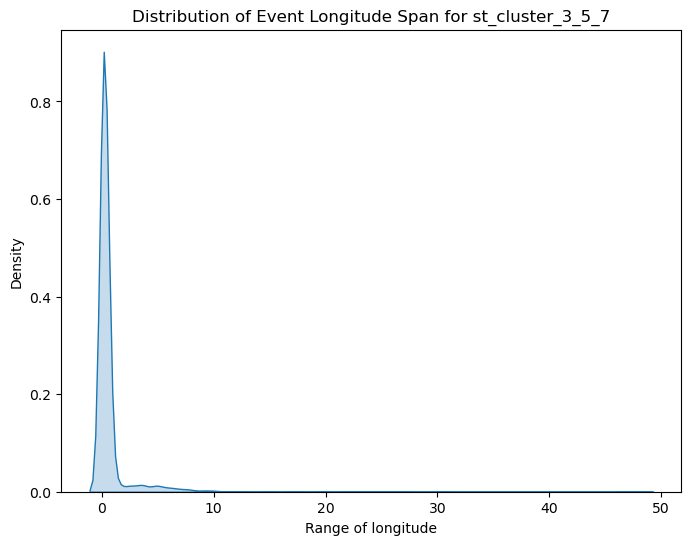


Analyzing st_cluster field: st_cluster_3_5_10


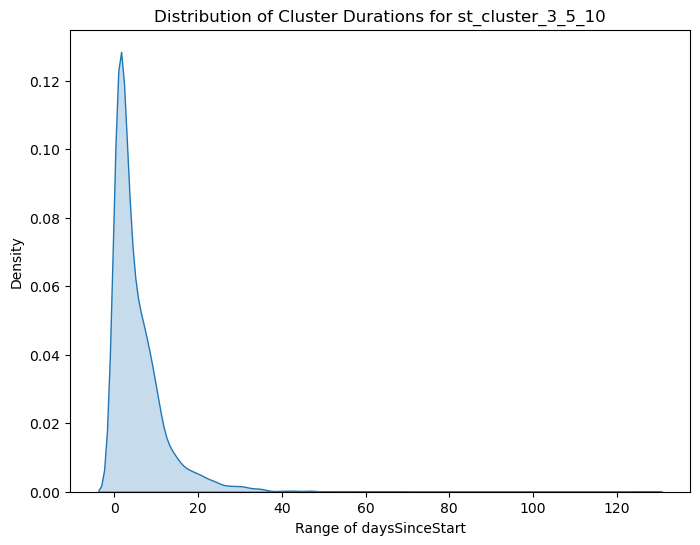

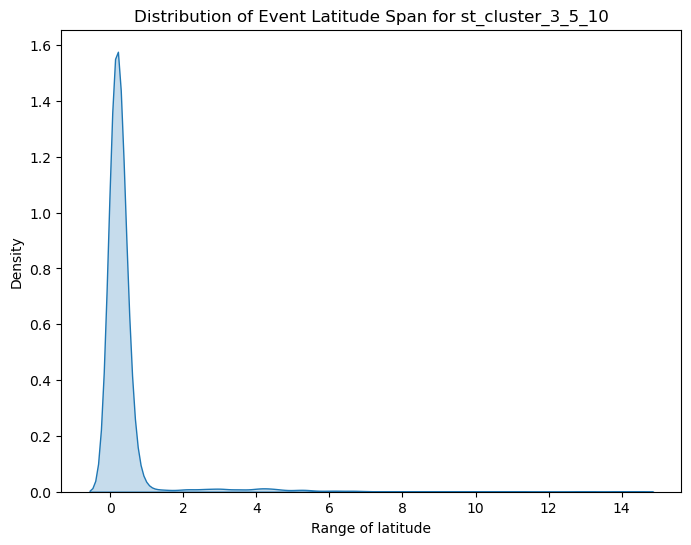

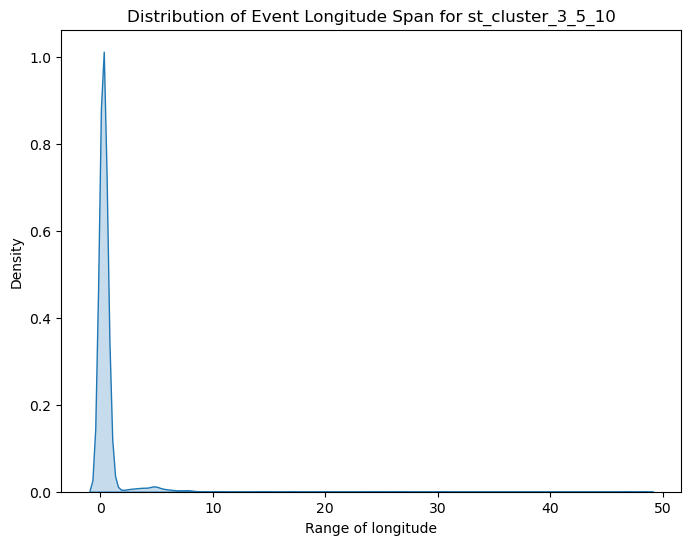


Analyzing st_cluster field: st_cluster_3_7_3


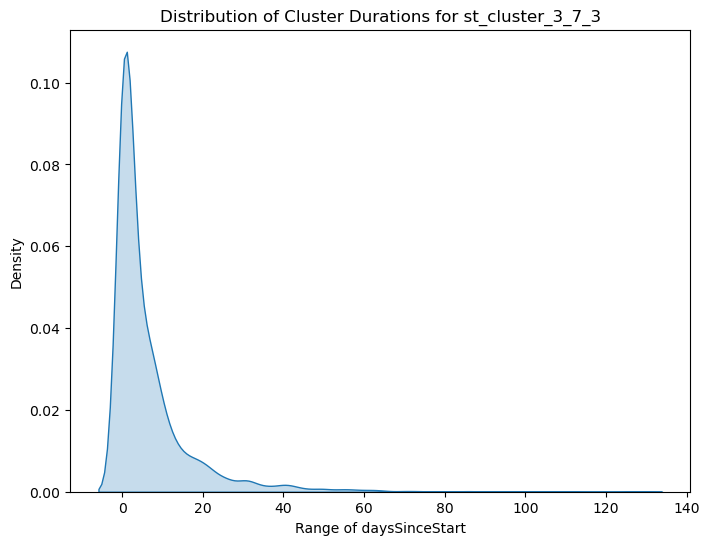

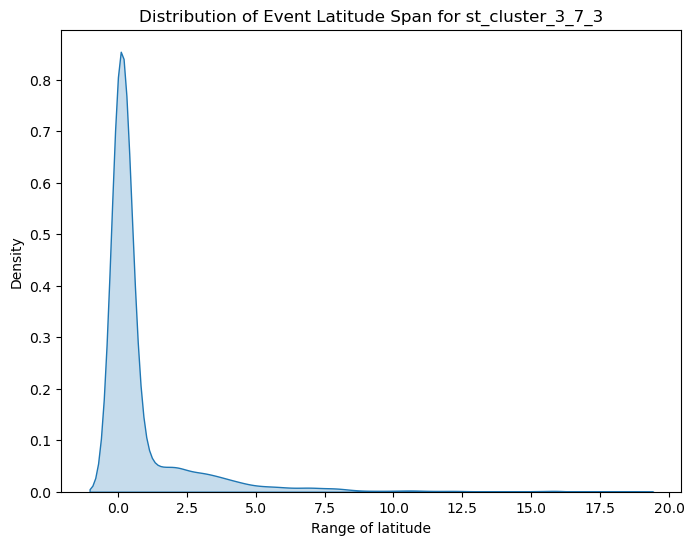

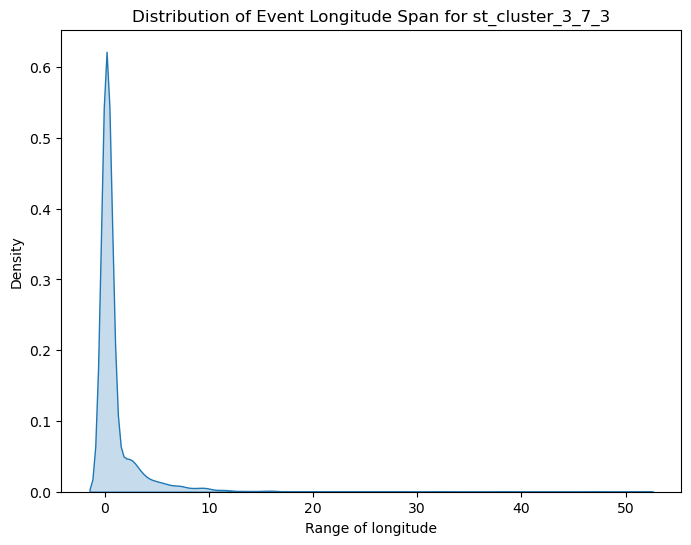


Analyzing st_cluster field: st_cluster_3_7_5


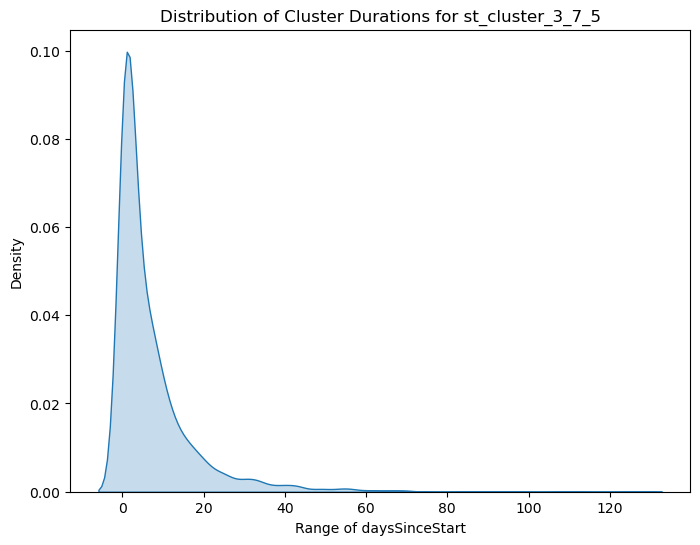

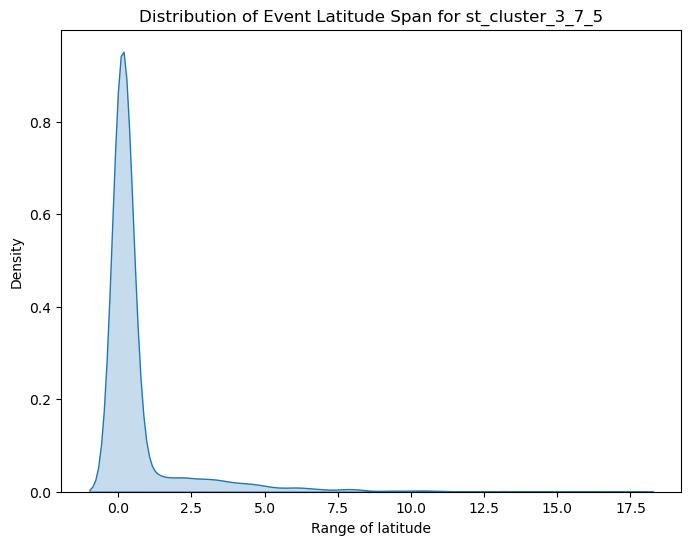

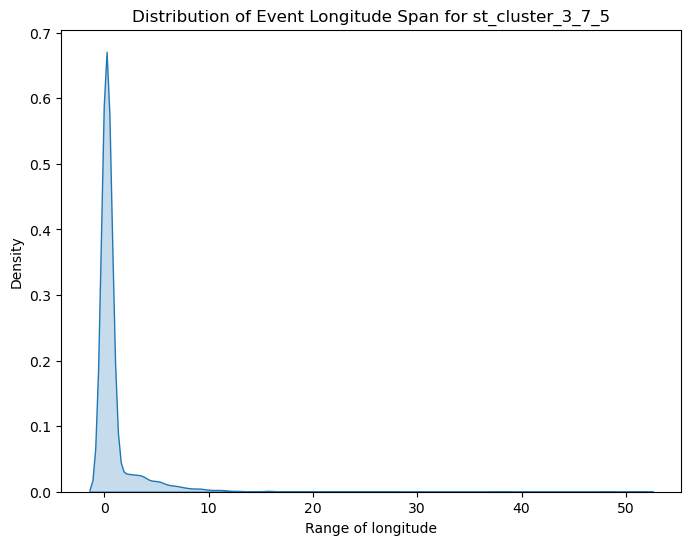


Analyzing st_cluster field: st_cluster_3_7_7


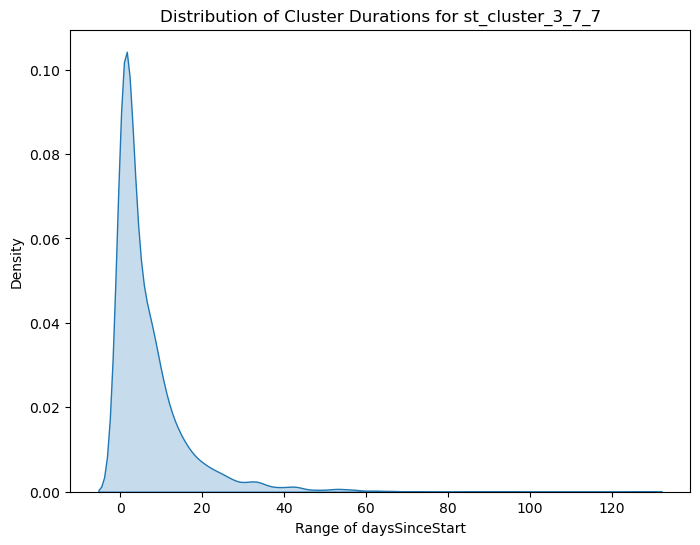

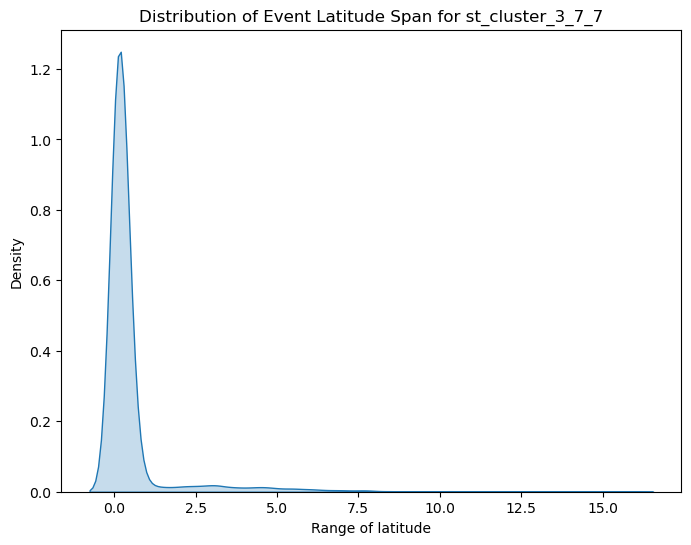

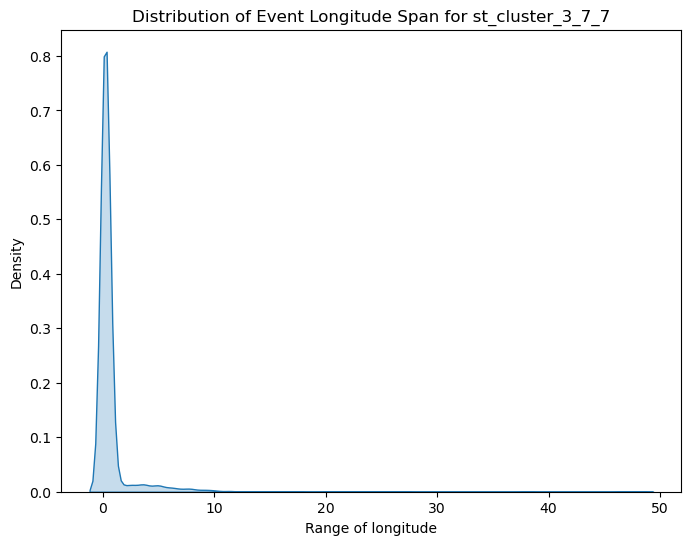


Analyzing st_cluster field: st_cluster_3_7_10


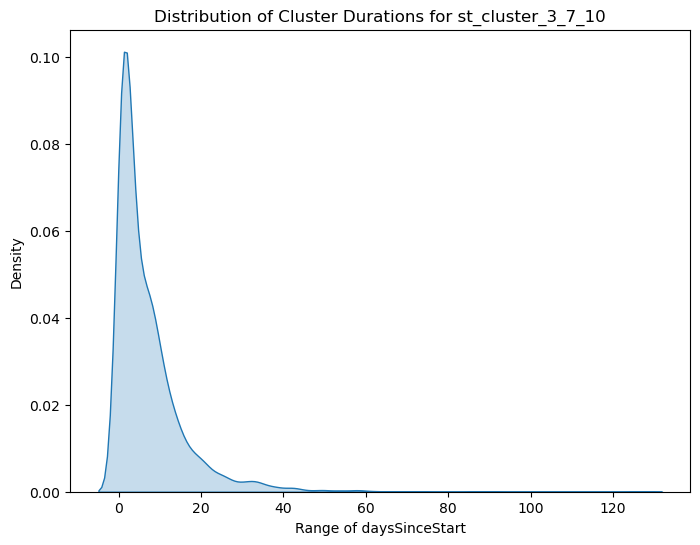

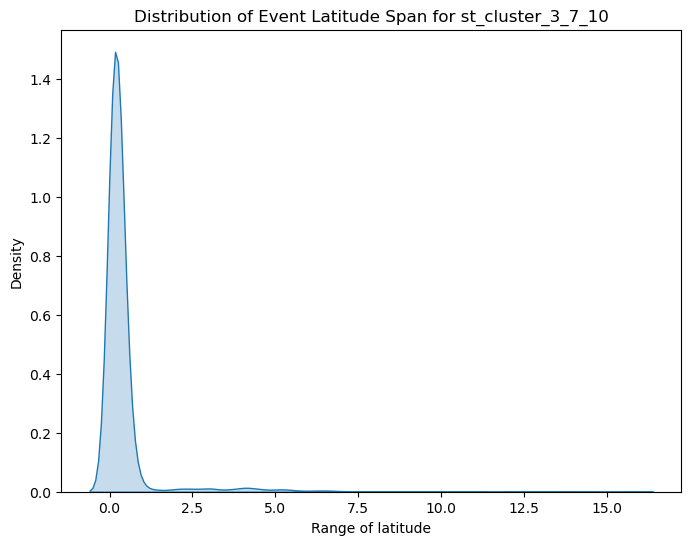

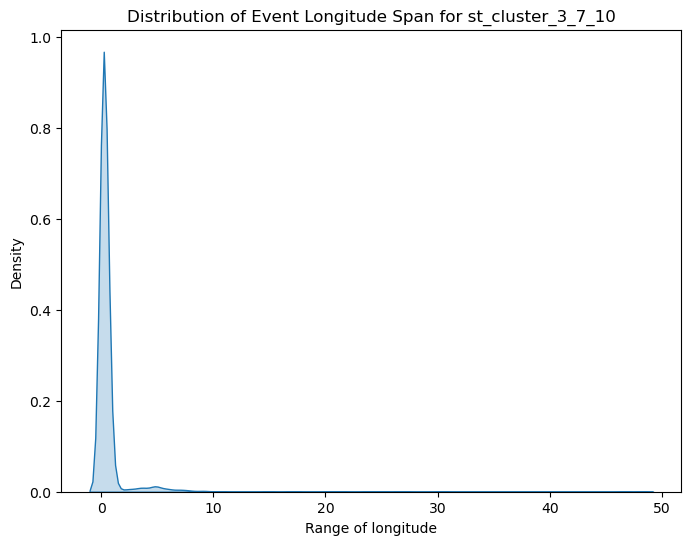


Analyzing st_cluster field: st_cluster_3_14_3


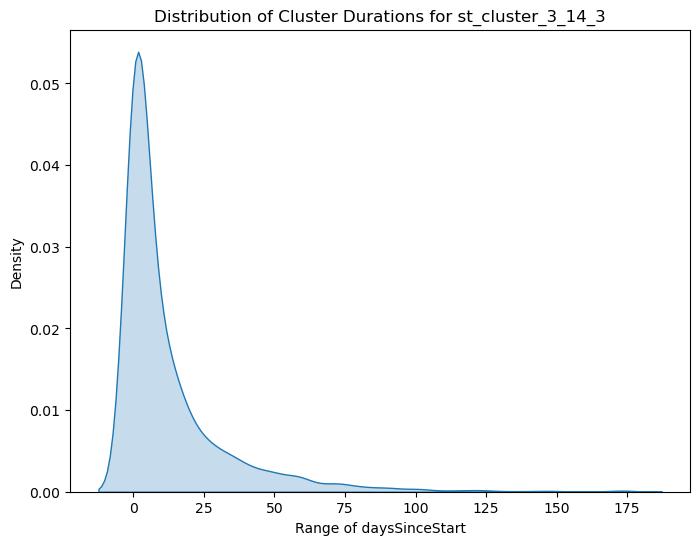

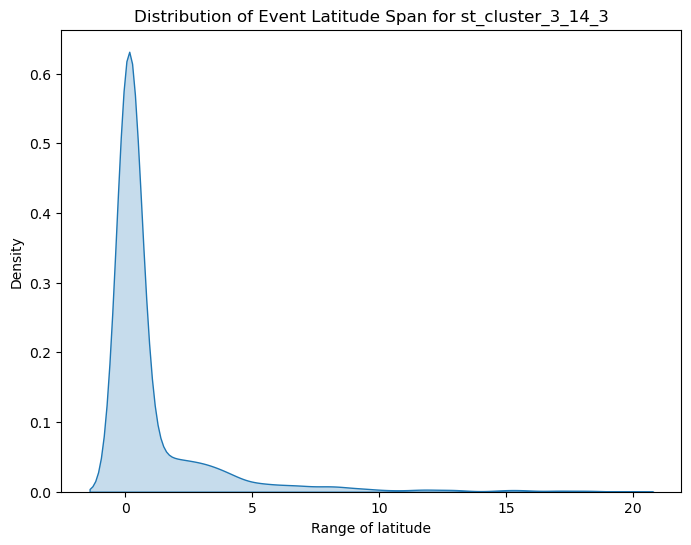

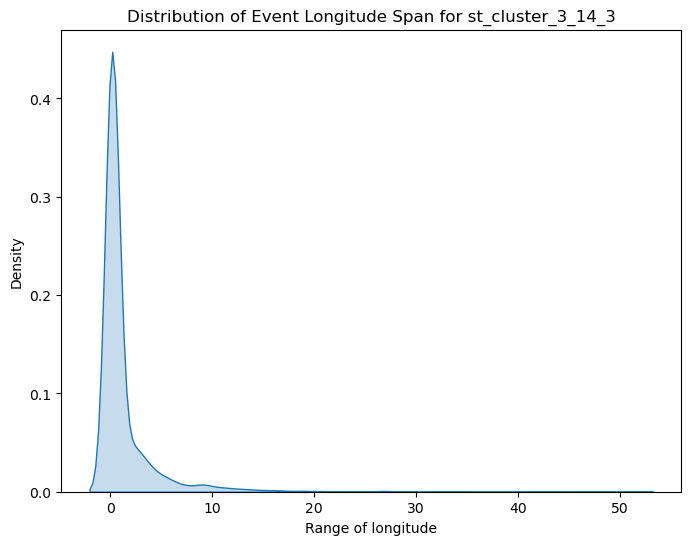


Analyzing st_cluster field: st_cluster_3_14_5


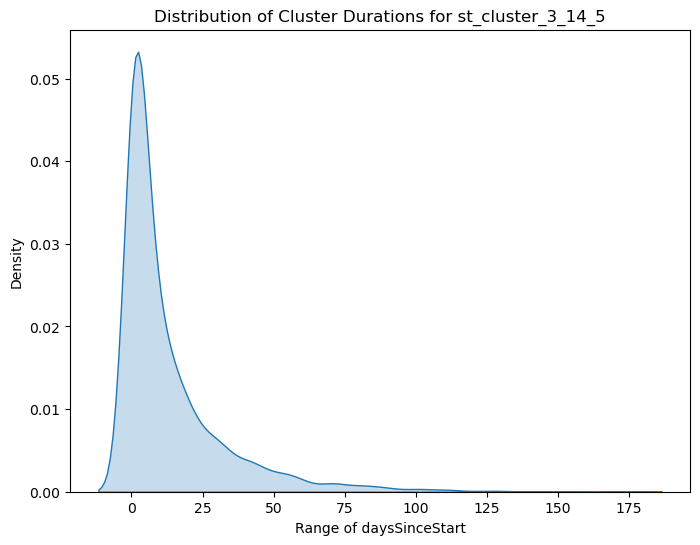

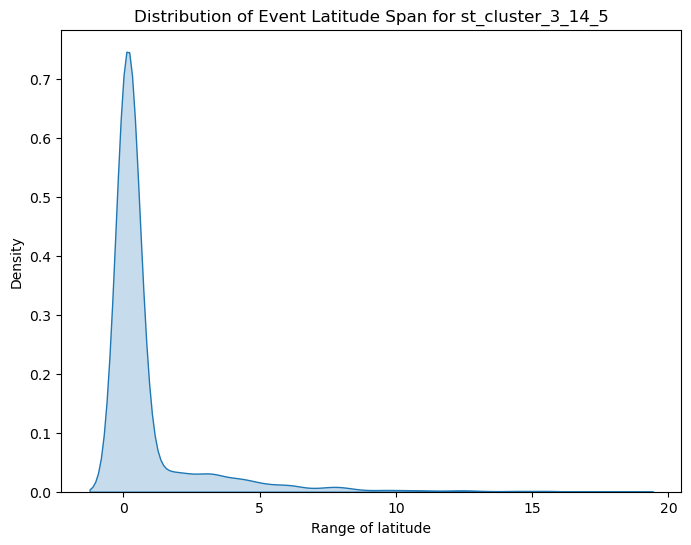

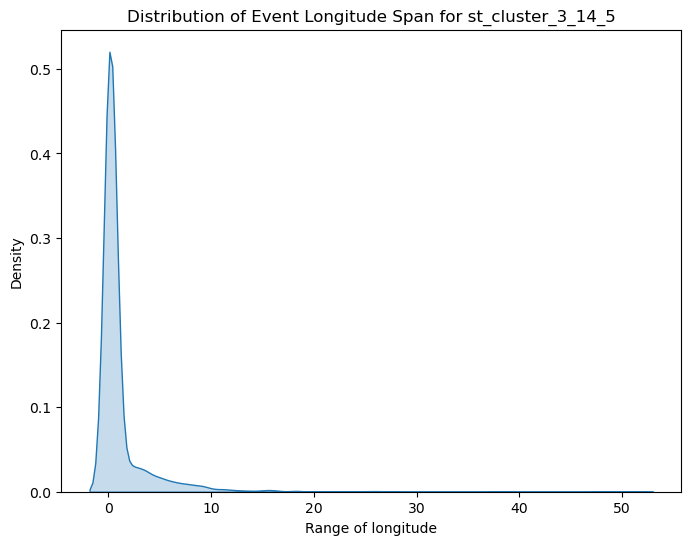


Analyzing st_cluster field: st_cluster_3_14_7


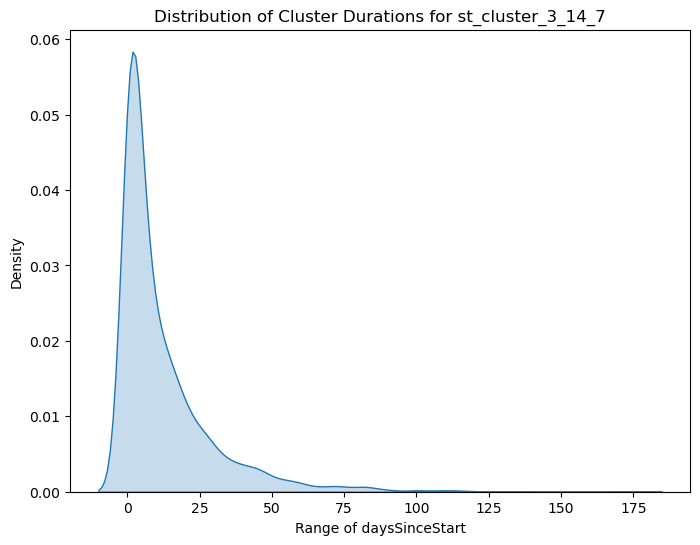

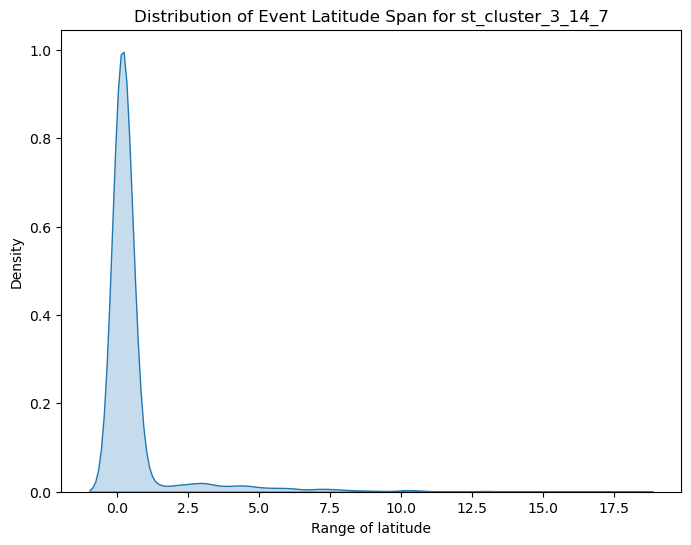

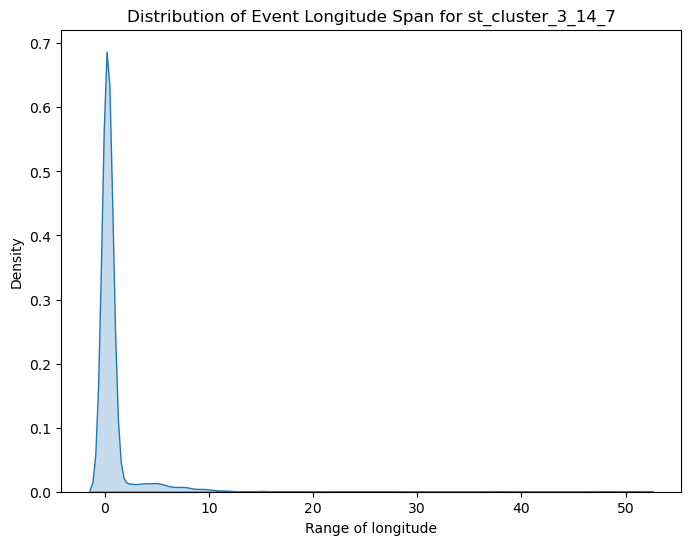


Analyzing st_cluster field: st_cluster_3_14_10


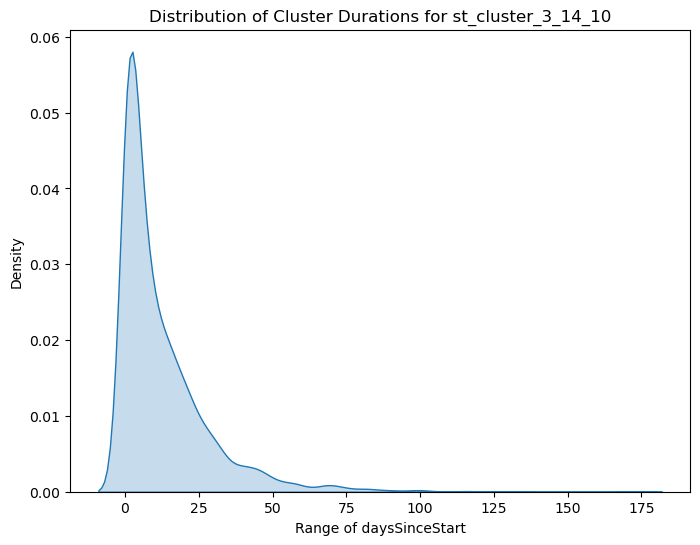

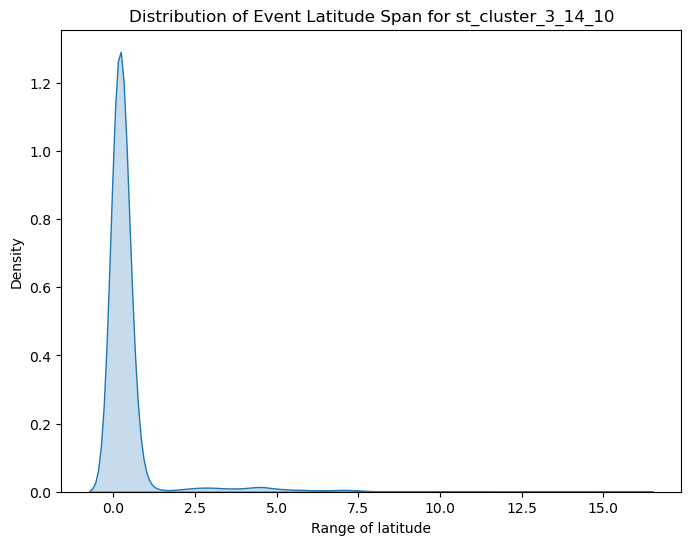

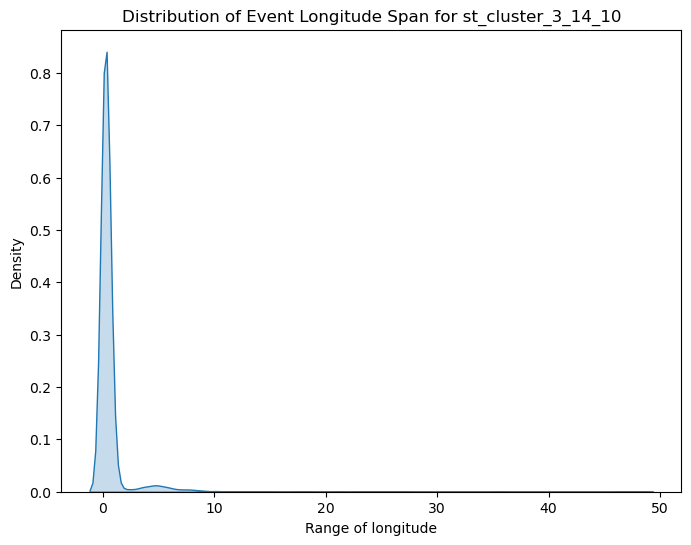


Analyzing st_cluster field: st_cluster_3_30_3


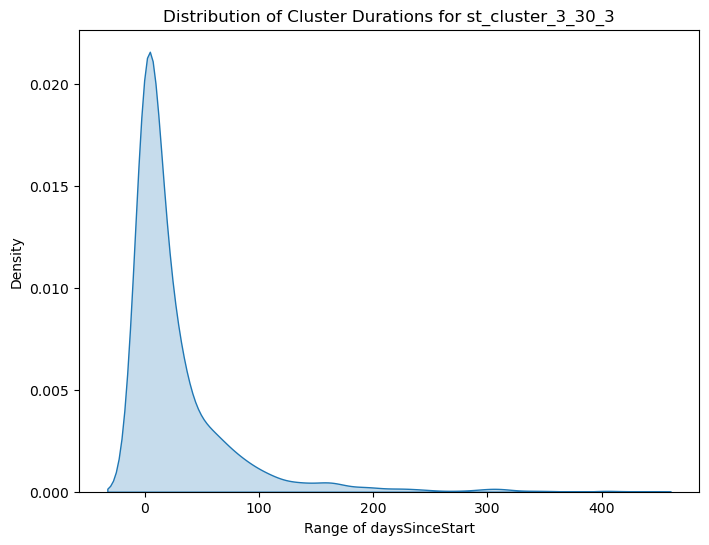

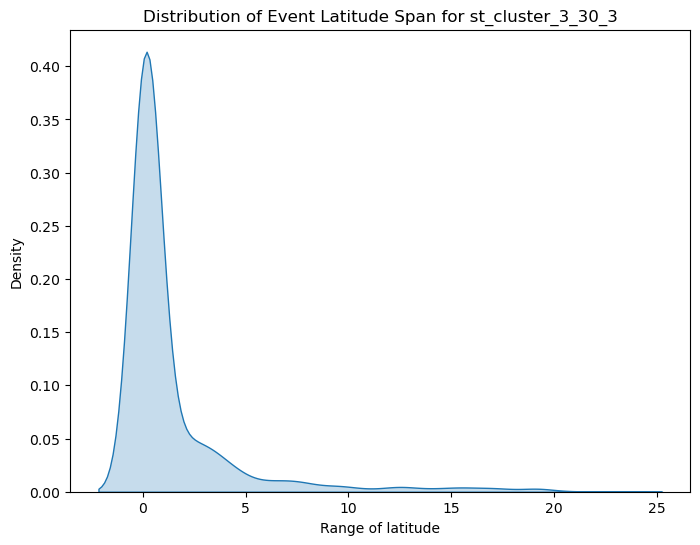

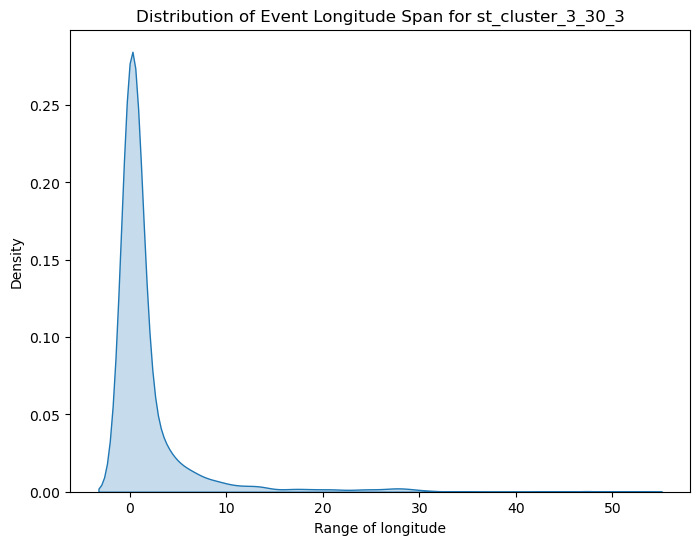


Analyzing st_cluster field: st_cluster_3_30_5


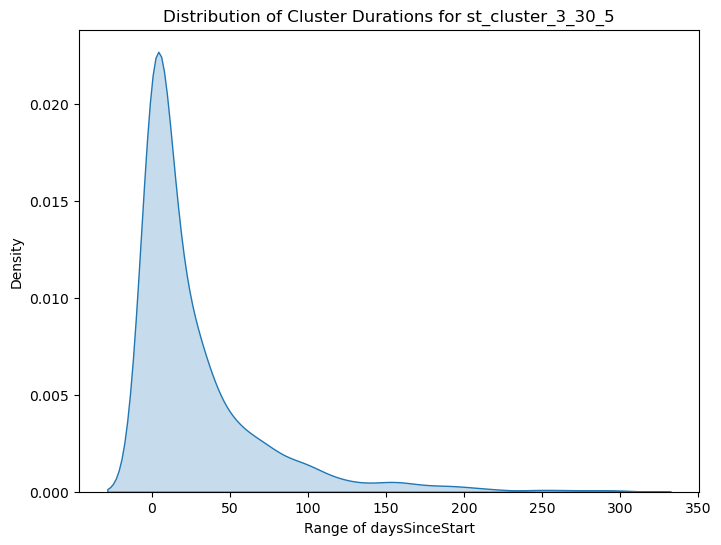

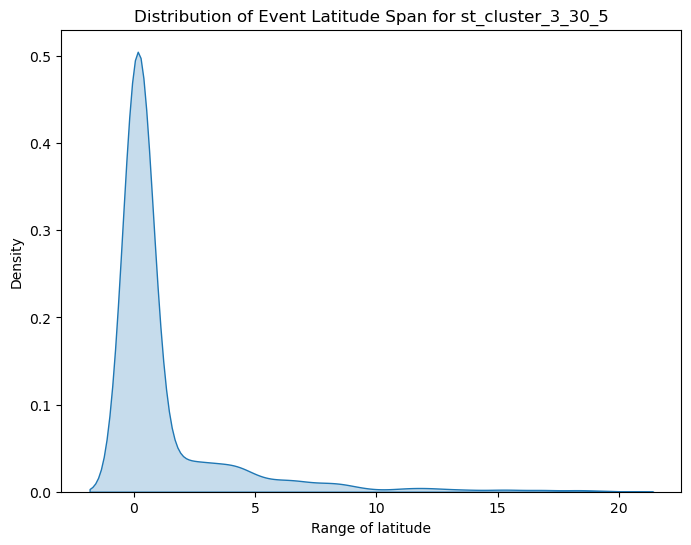

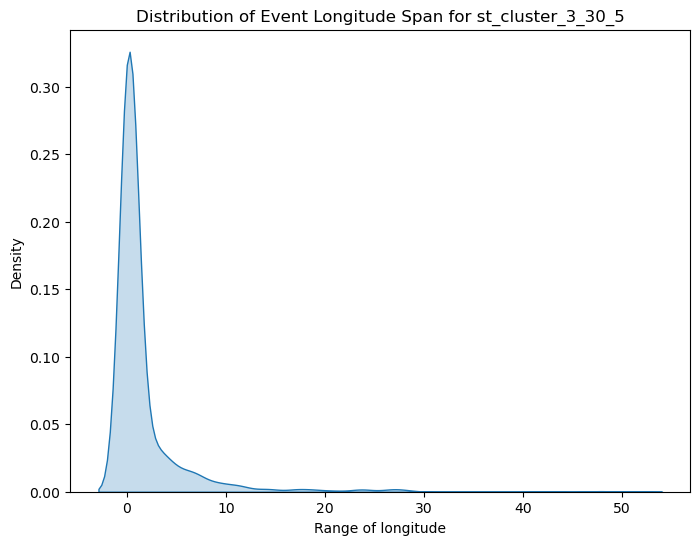


Analyzing st_cluster field: st_cluster_3_30_7


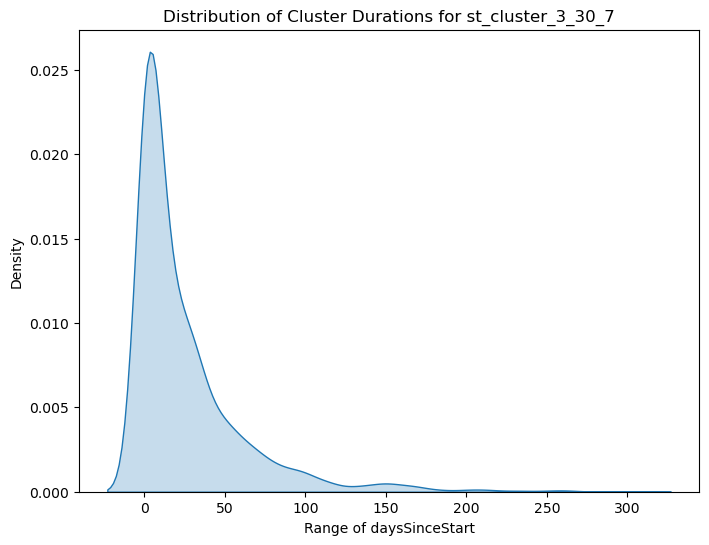

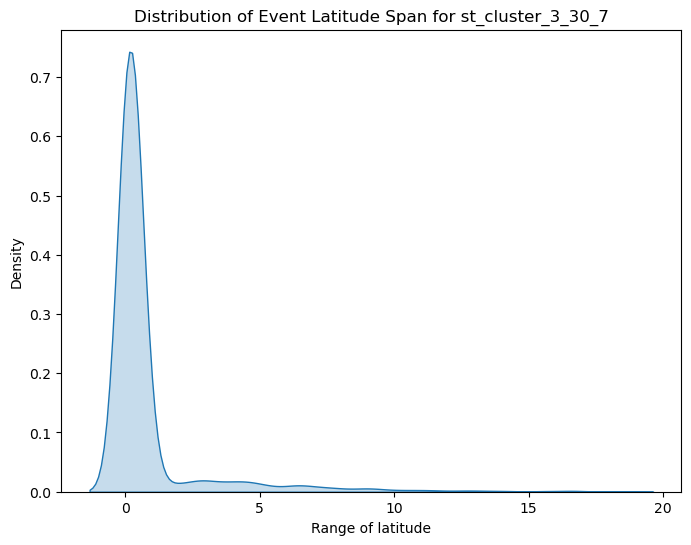

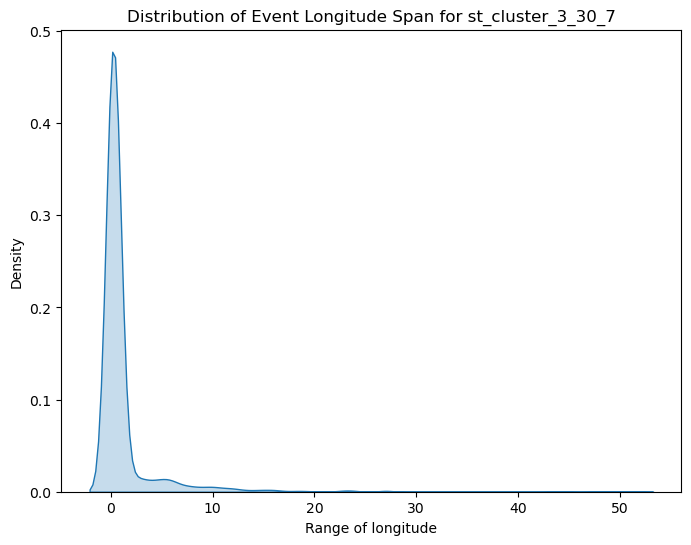


Analyzing st_cluster field: st_cluster_3_30_10


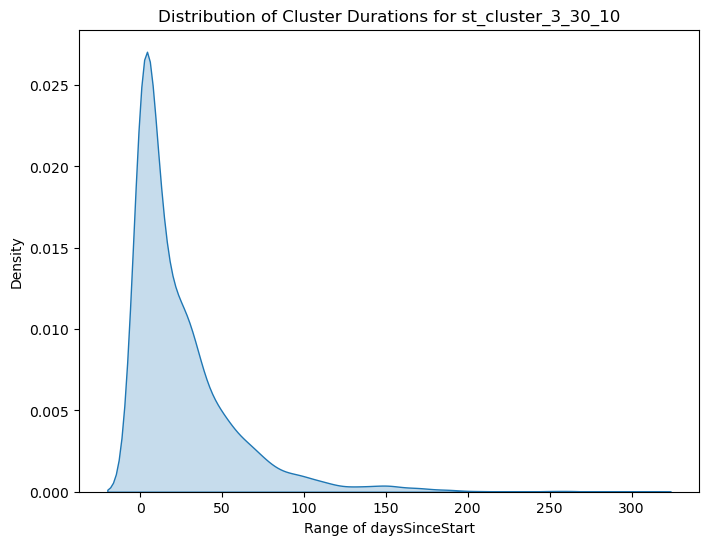

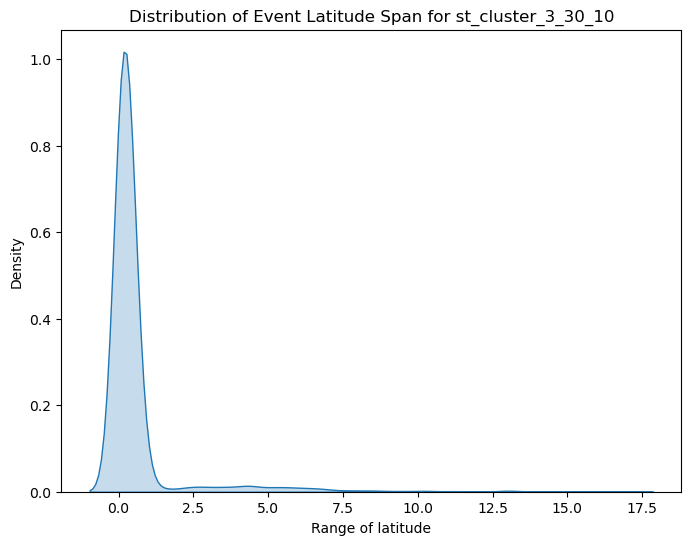

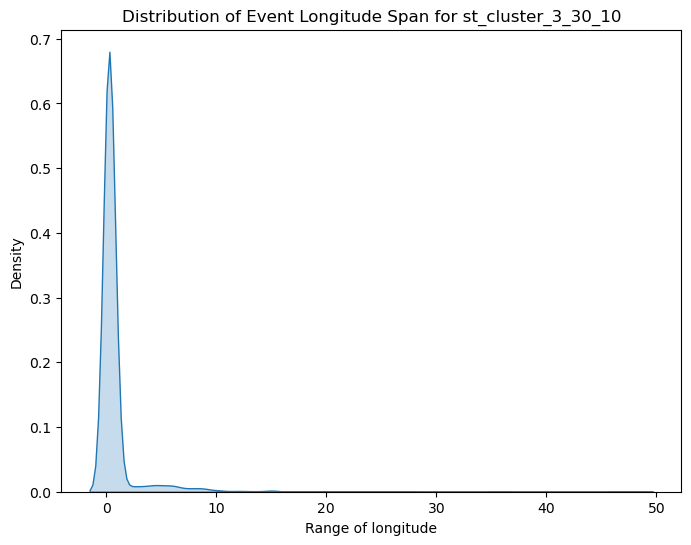


Analyzing st_cluster field: st_cluster_4_3_3


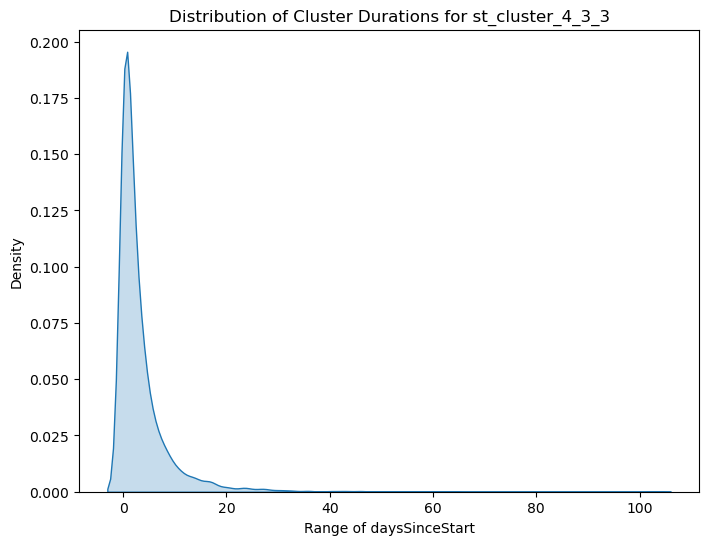

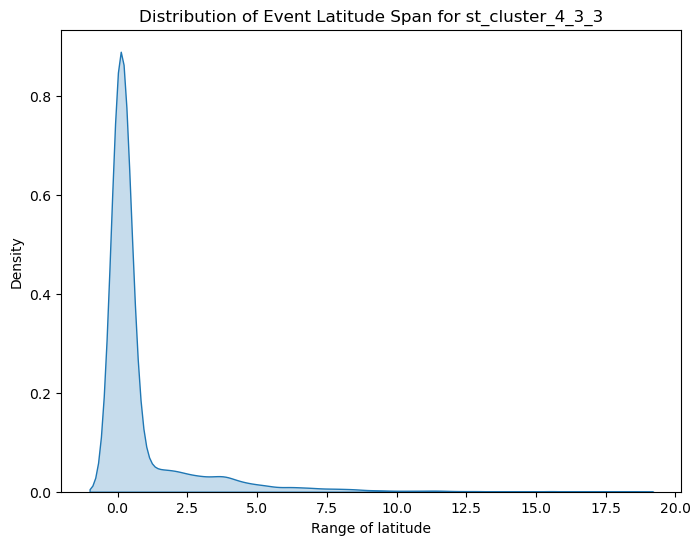

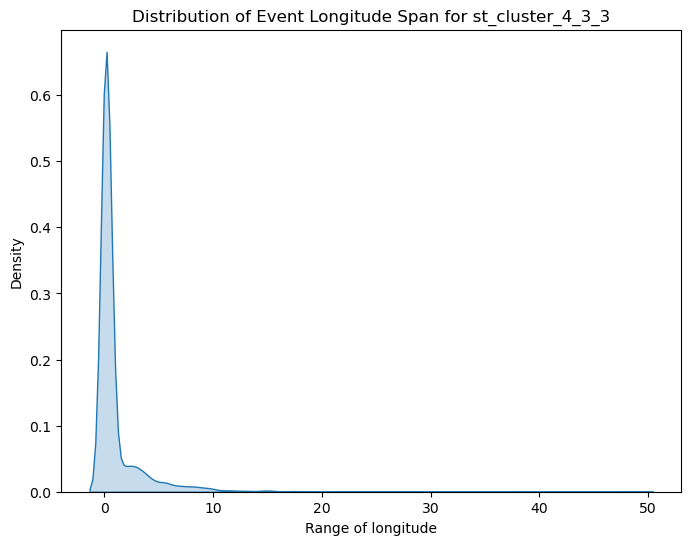


Analyzing st_cluster field: st_cluster_4_3_5


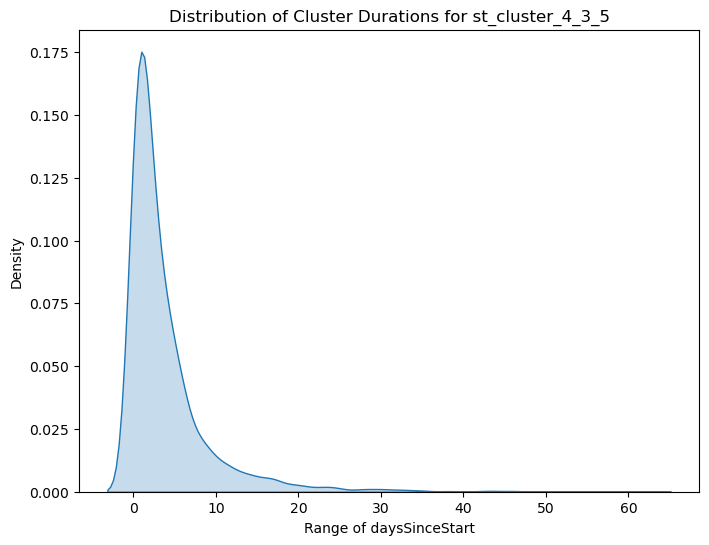

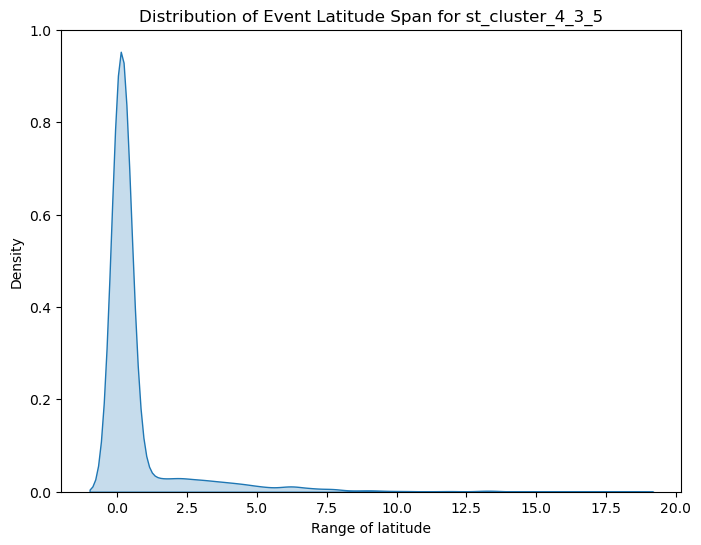

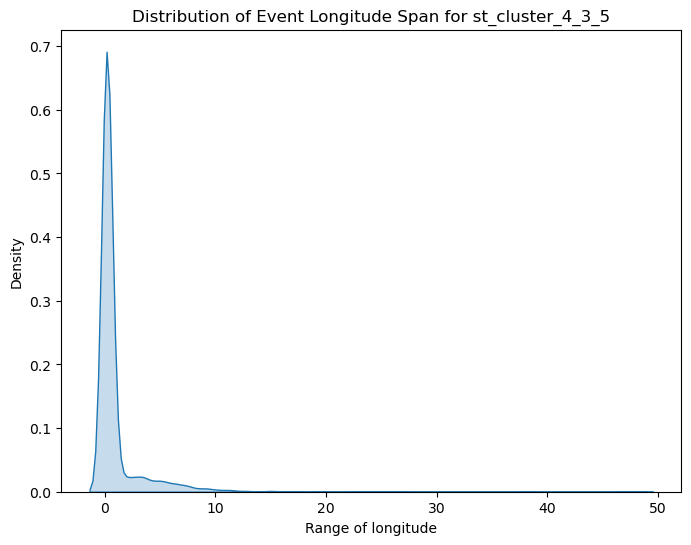


Analyzing st_cluster field: st_cluster_4_3_7


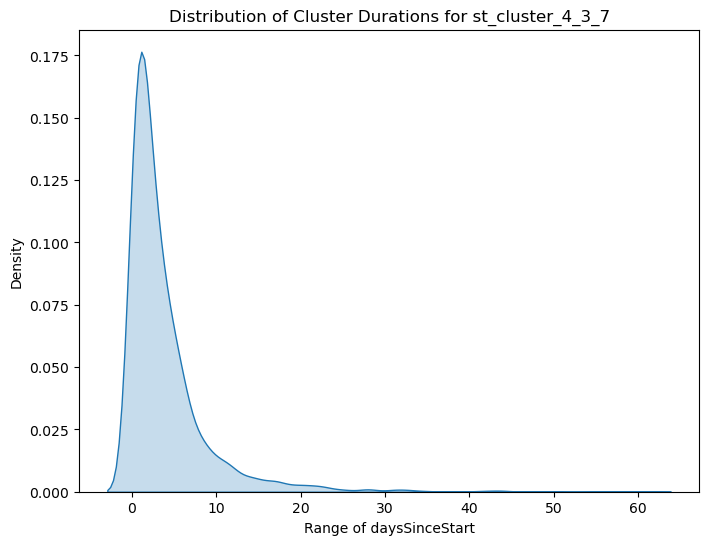

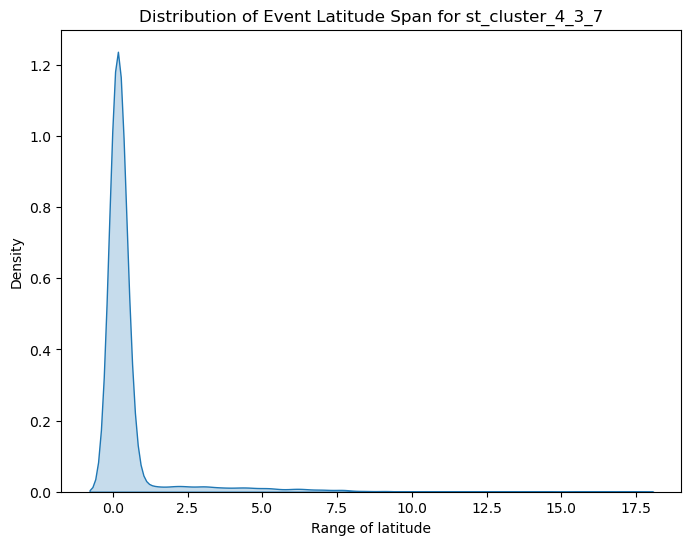

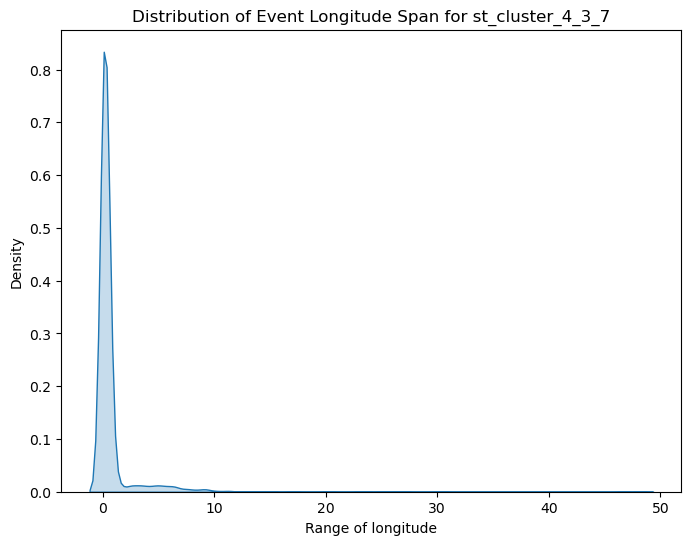


Analyzing st_cluster field: st_cluster_4_3_10


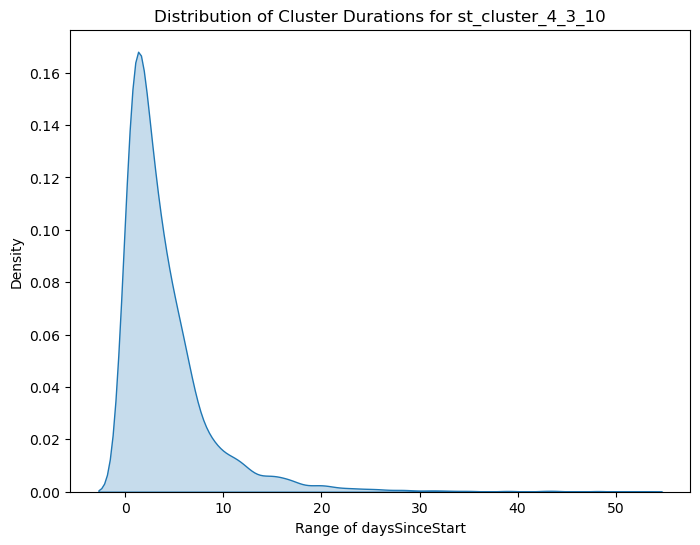

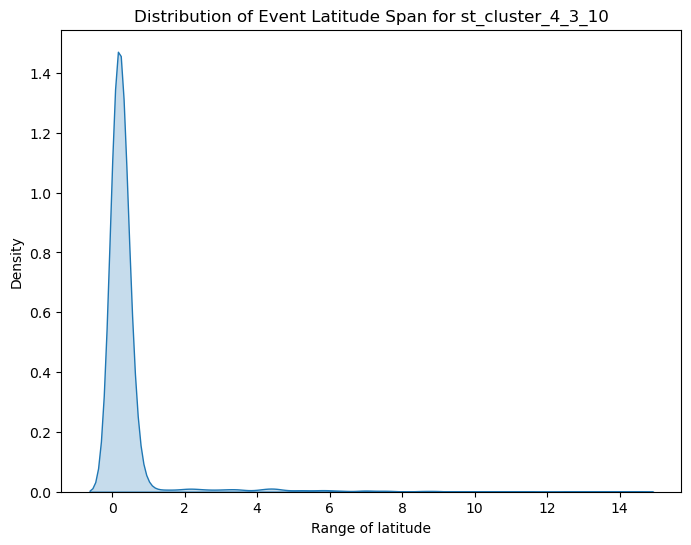

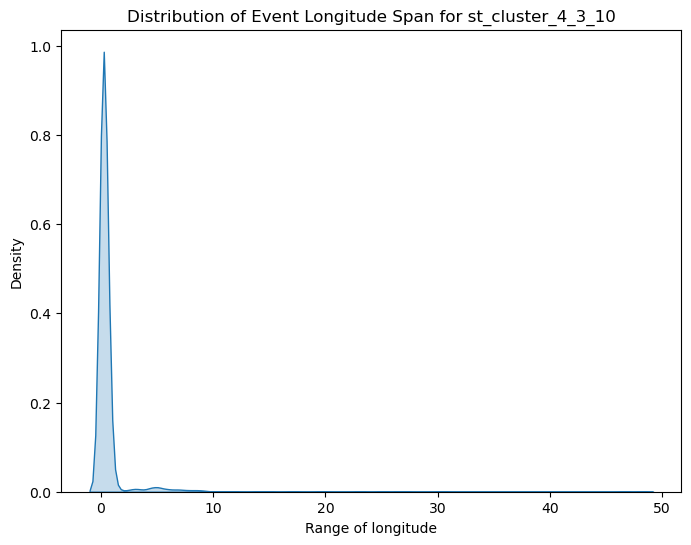


Analyzing st_cluster field: st_cluster_4_5_3


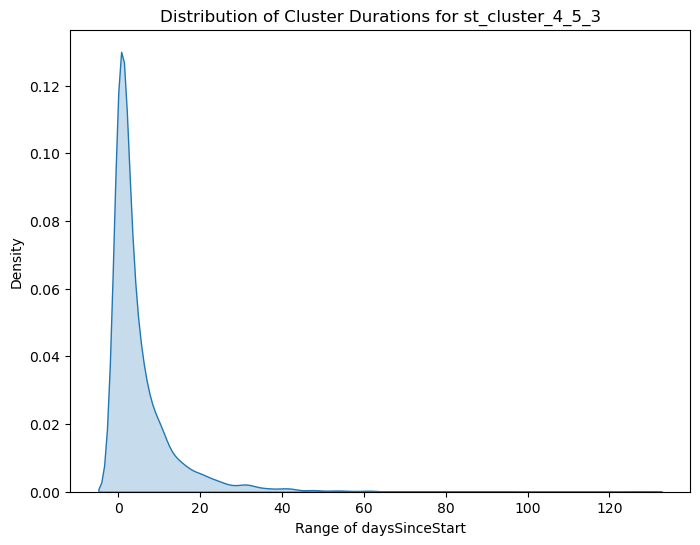

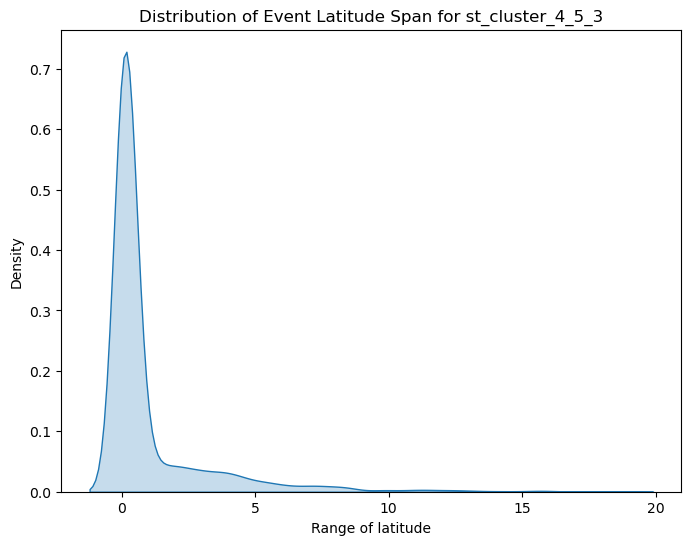

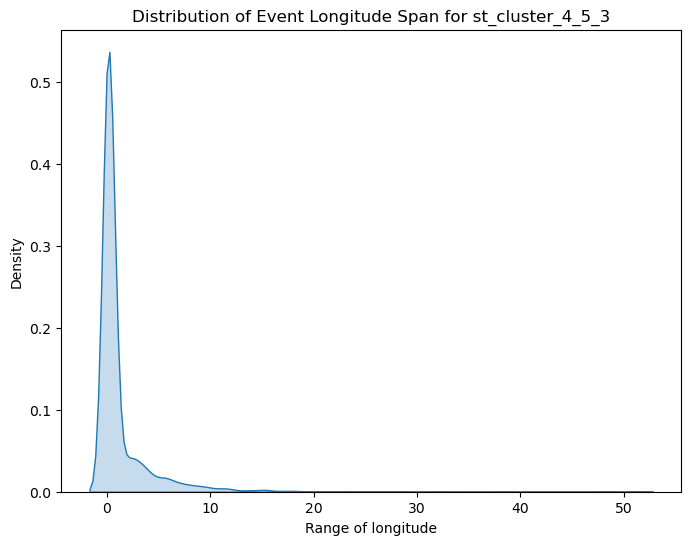


Analyzing st_cluster field: st_cluster_4_5_5


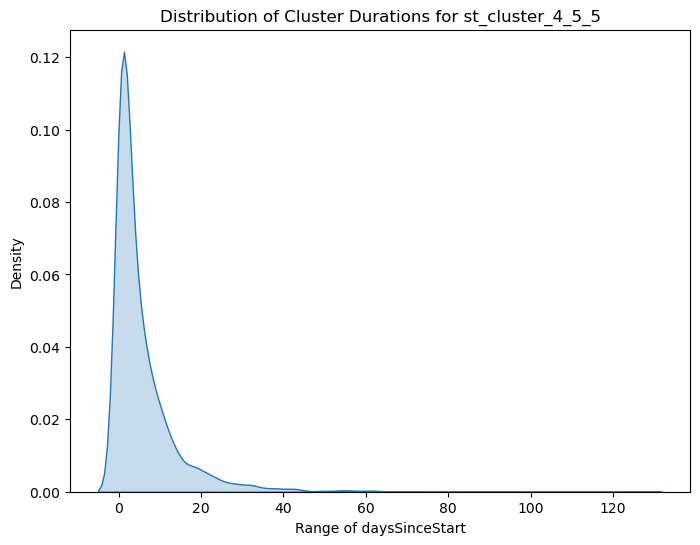

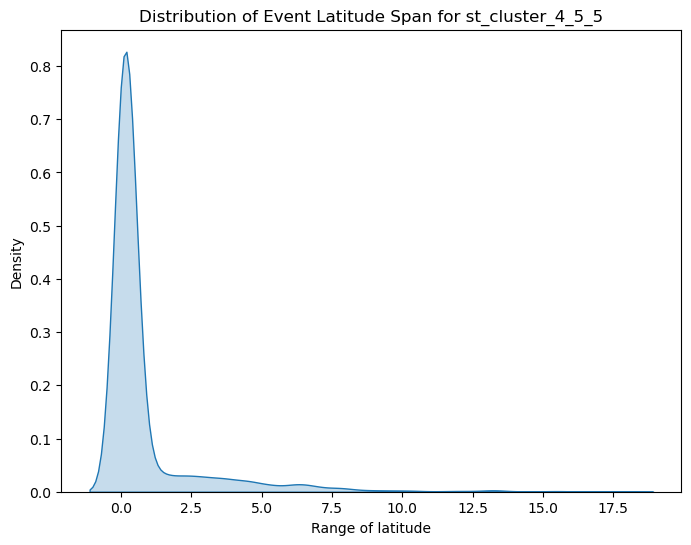

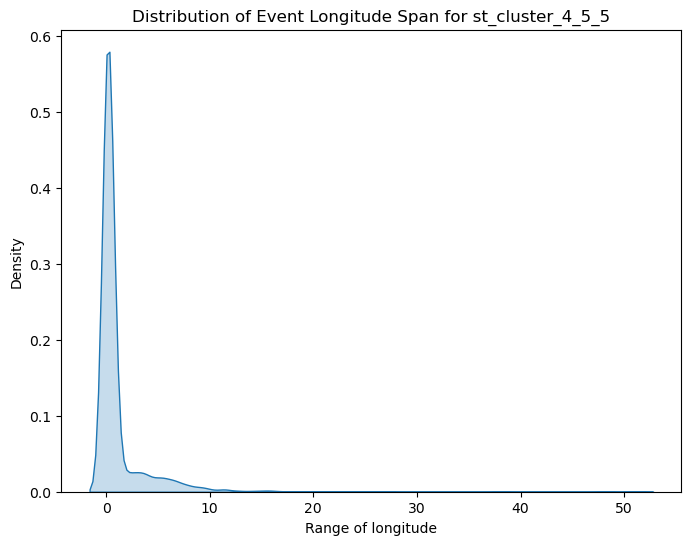


Analyzing st_cluster field: st_cluster_4_5_7


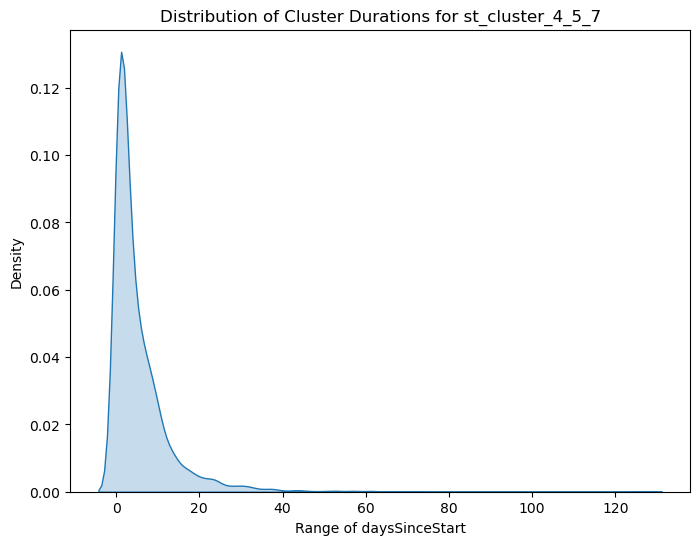

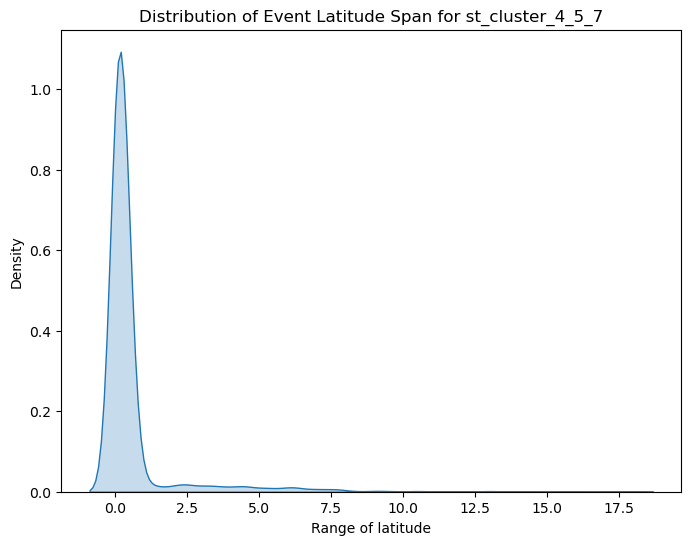

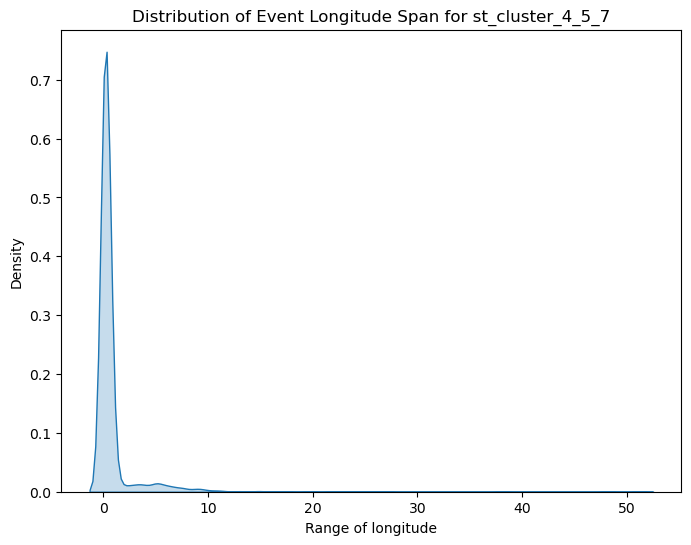


Analyzing st_cluster field: st_cluster_4_5_10


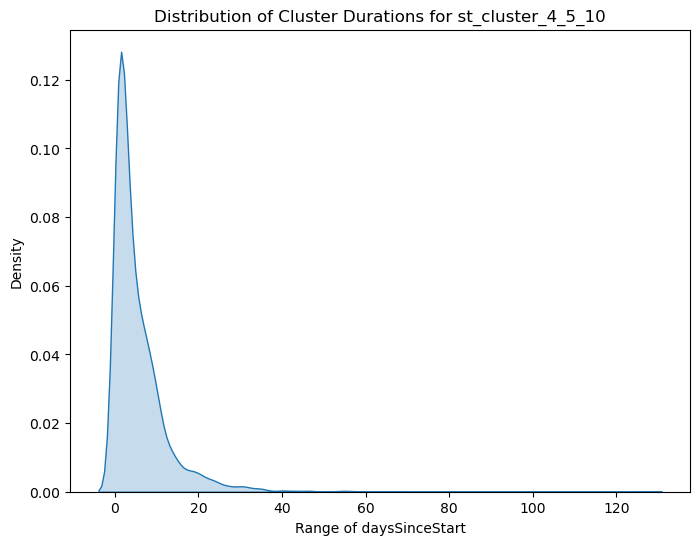

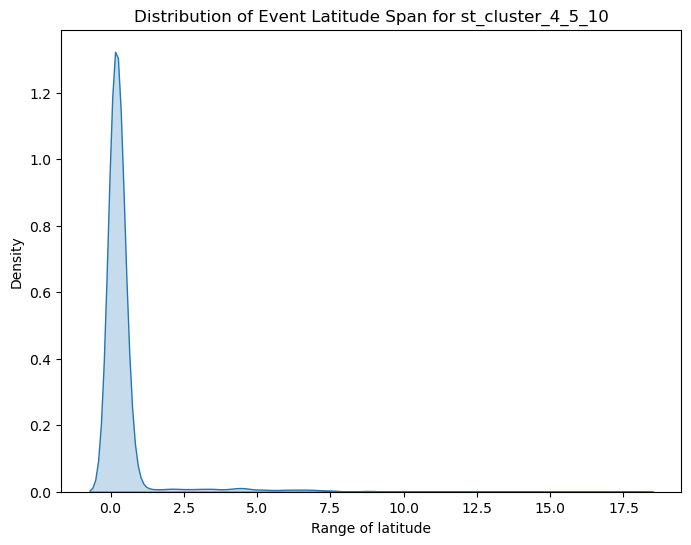

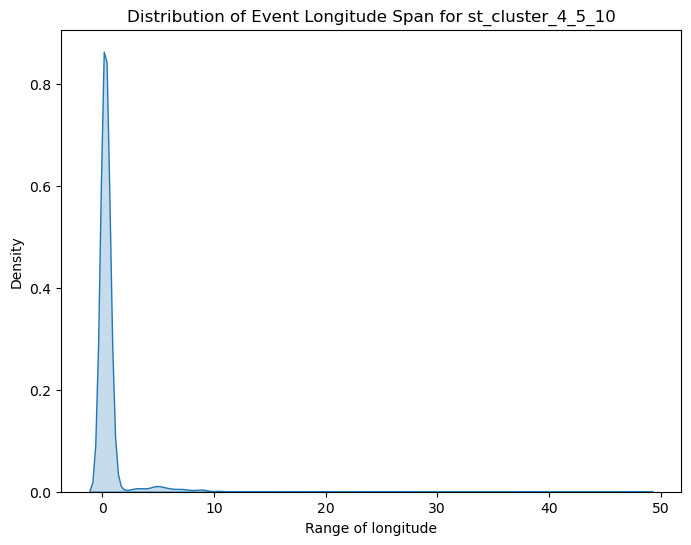


Analyzing st_cluster field: st_cluster_4_7_3


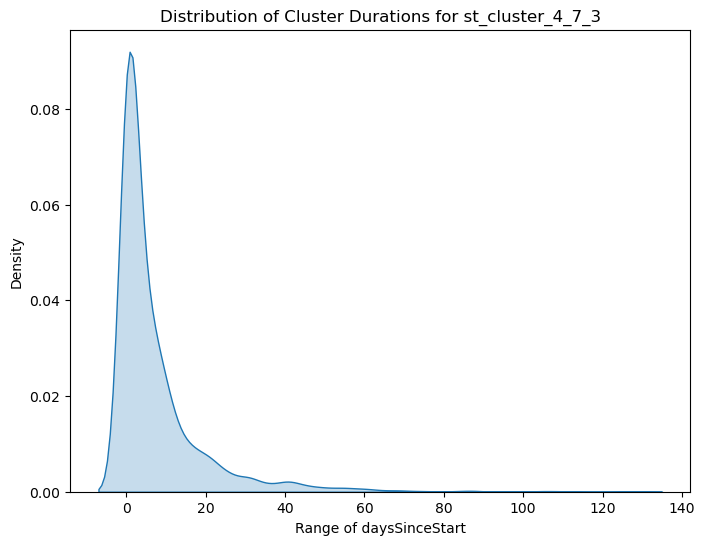

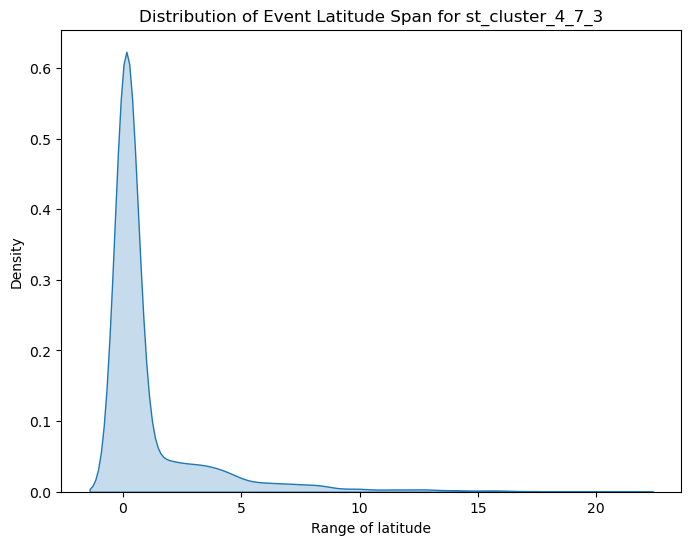

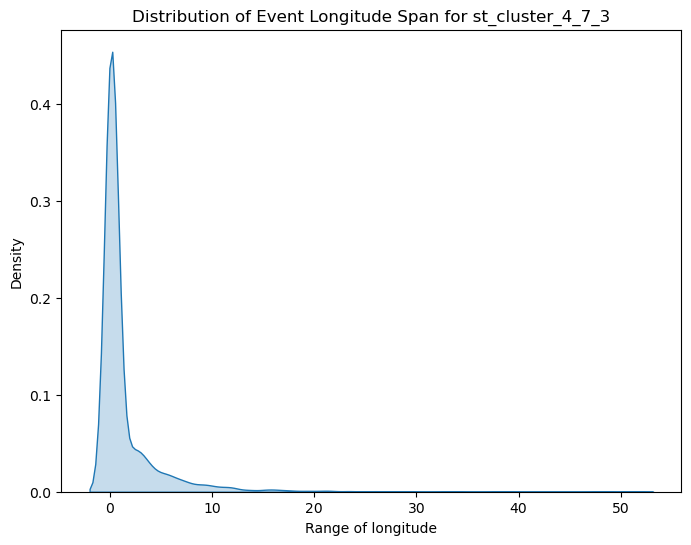


Analyzing st_cluster field: st_cluster_4_7_5


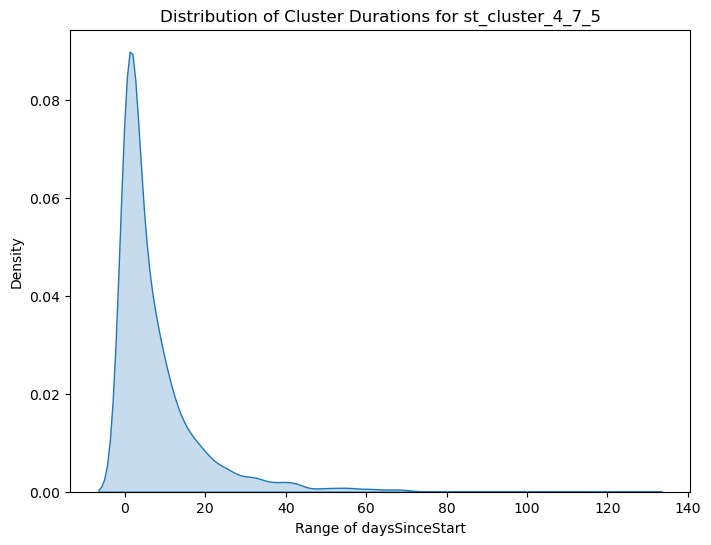

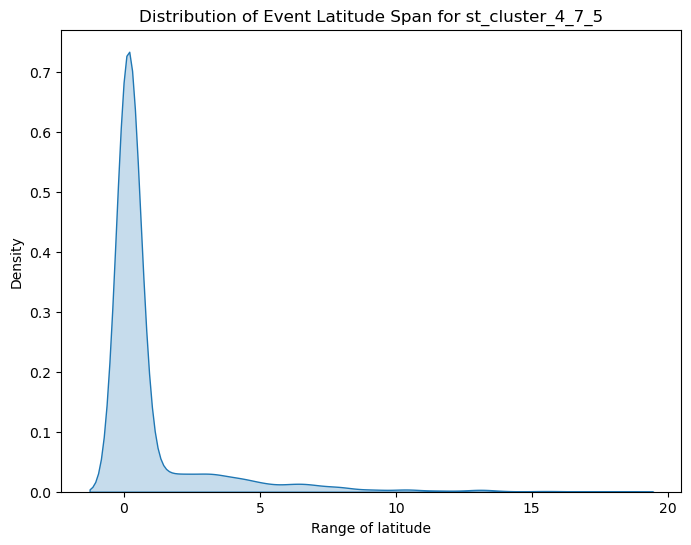

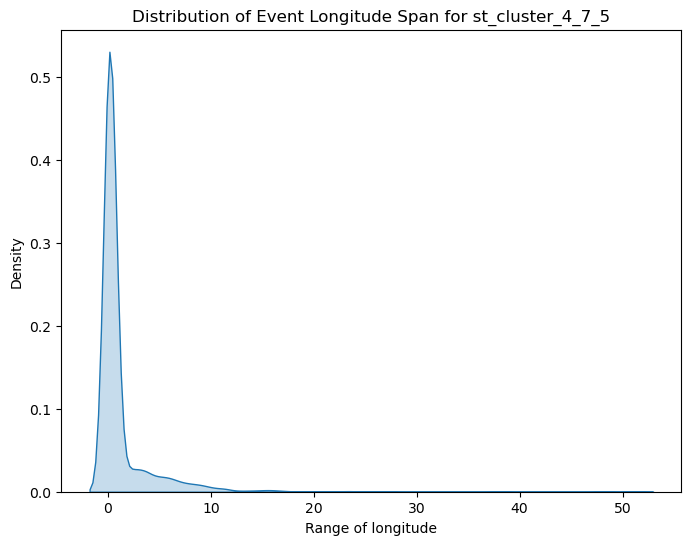


Analyzing st_cluster field: st_cluster_4_7_7


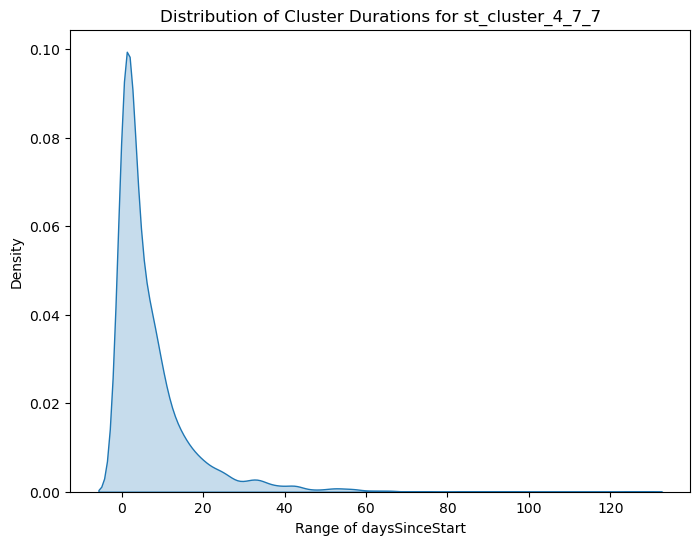

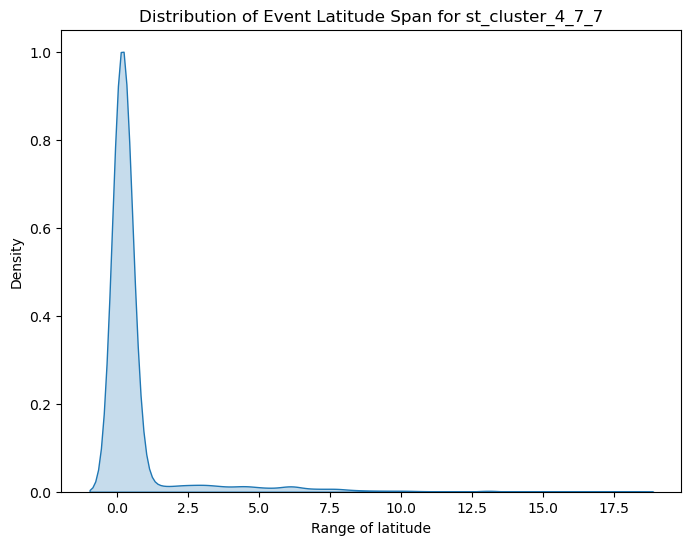

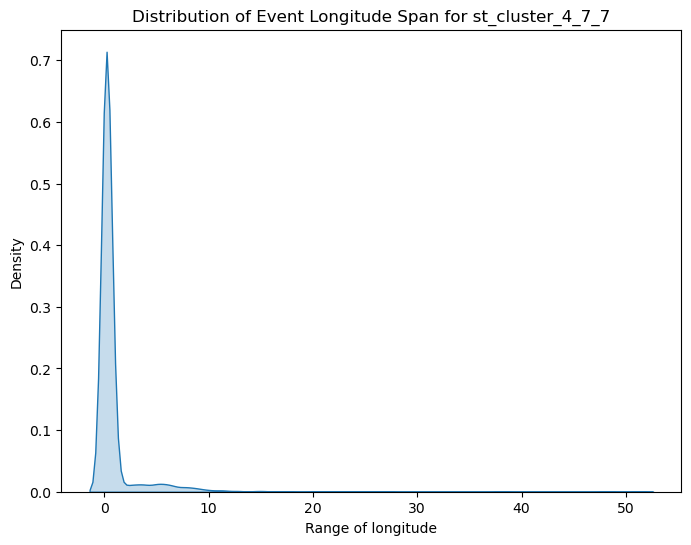


Analyzing st_cluster field: st_cluster_4_7_10


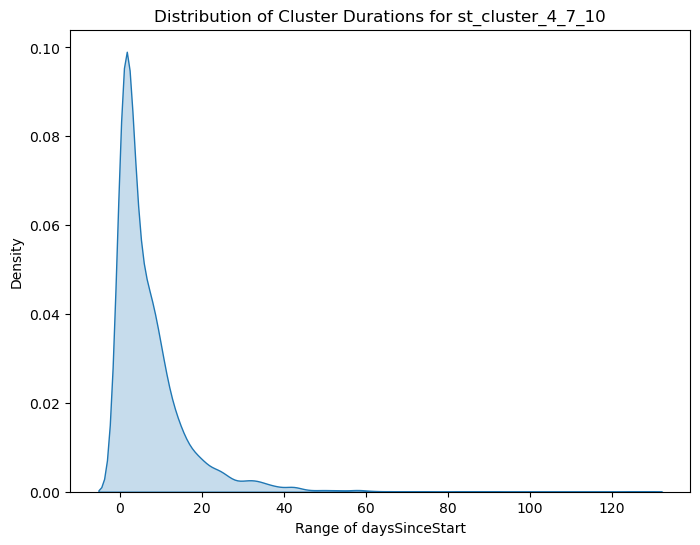

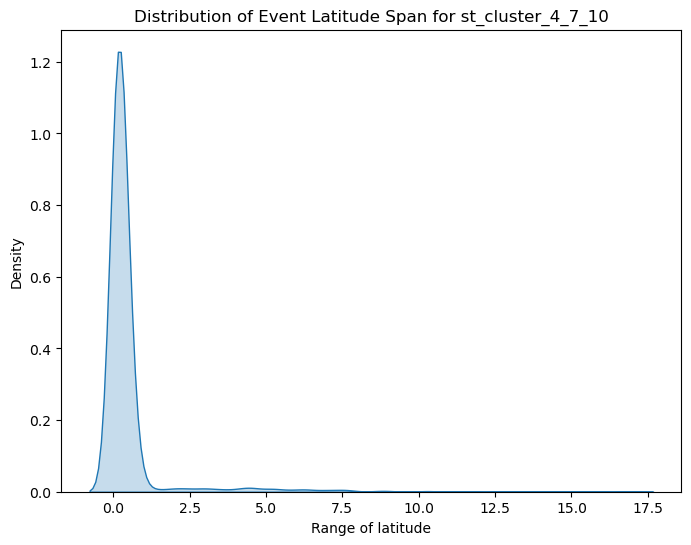

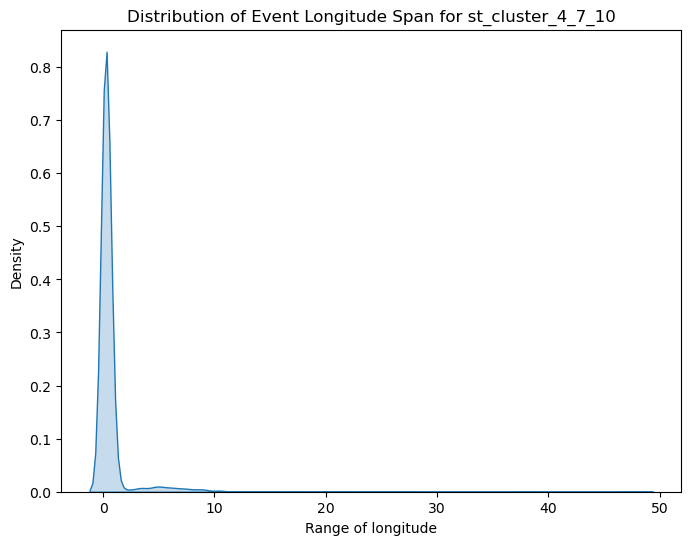


Analyzing st_cluster field: st_cluster_4_14_3


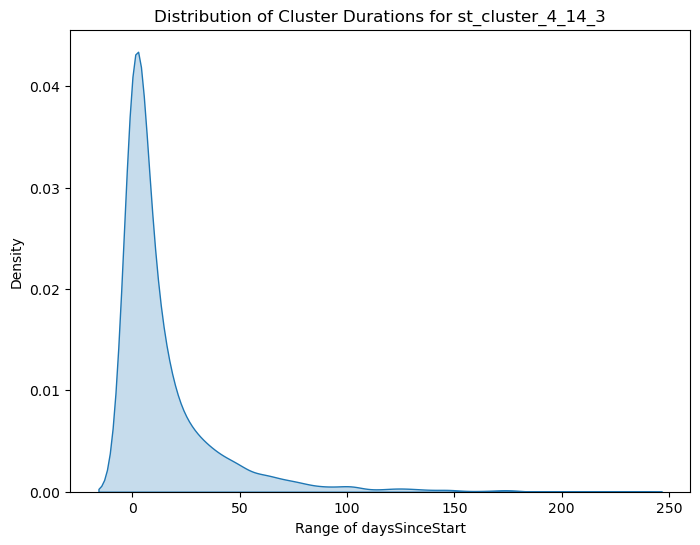

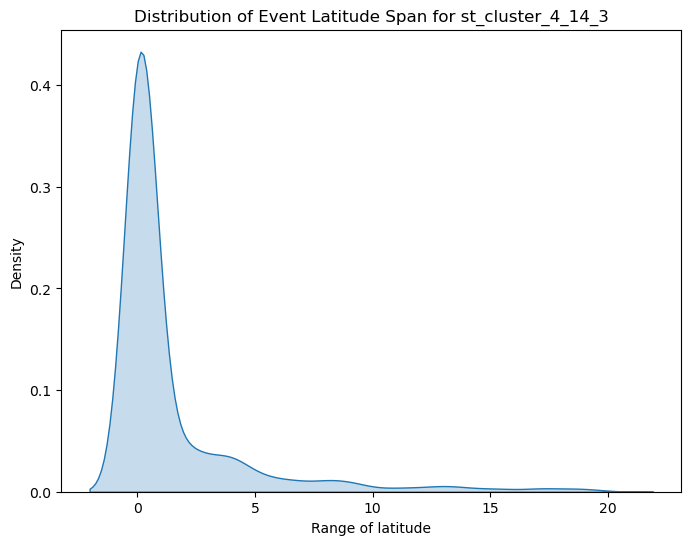

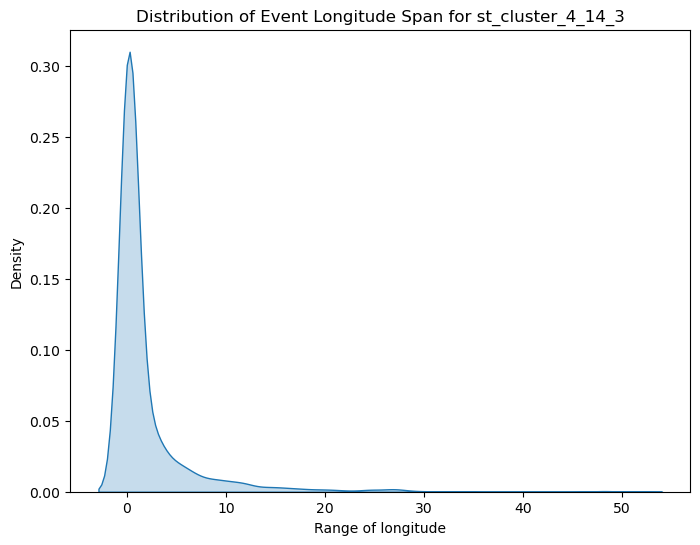


Analyzing st_cluster field: st_cluster_4_14_5


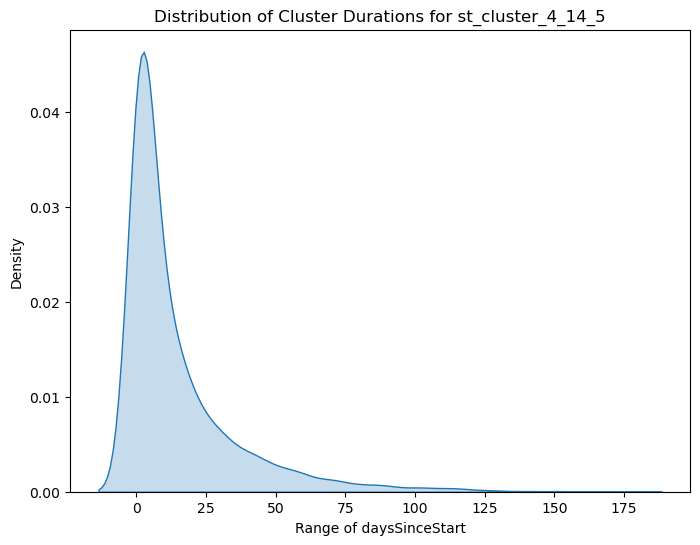

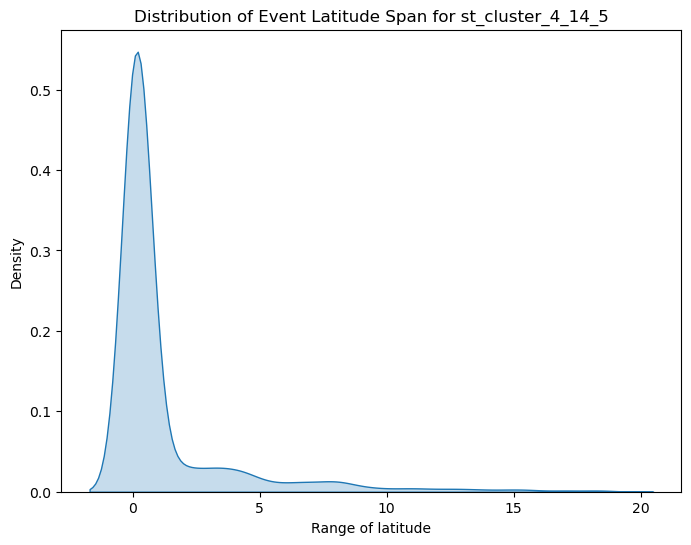

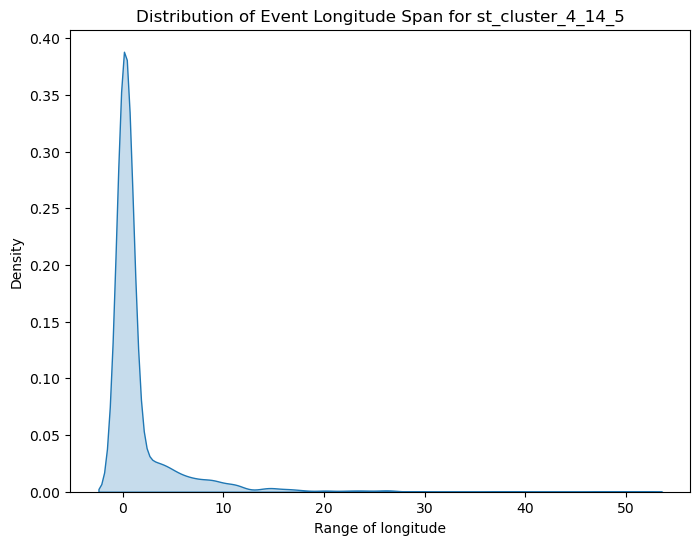


Analyzing st_cluster field: st_cluster_4_14_7


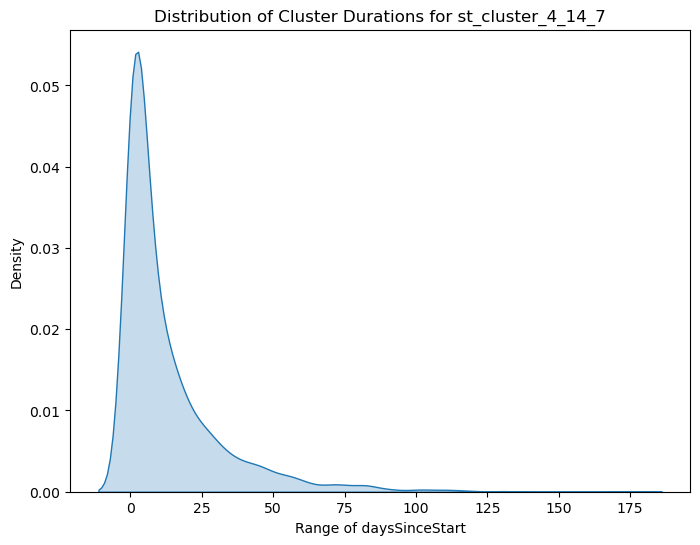

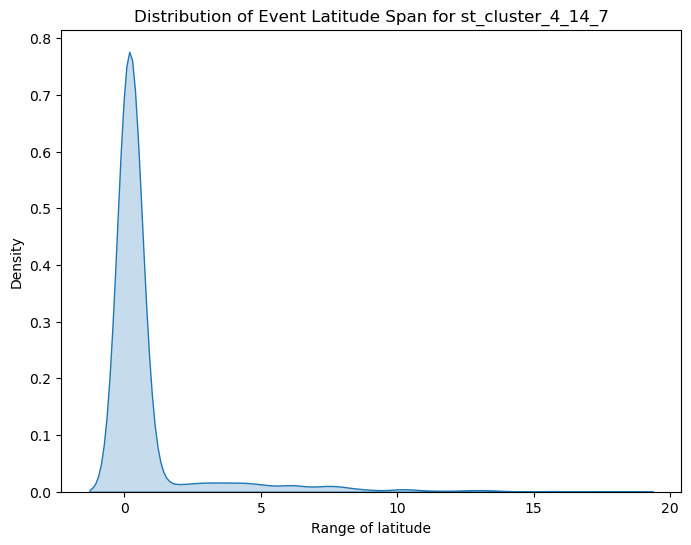

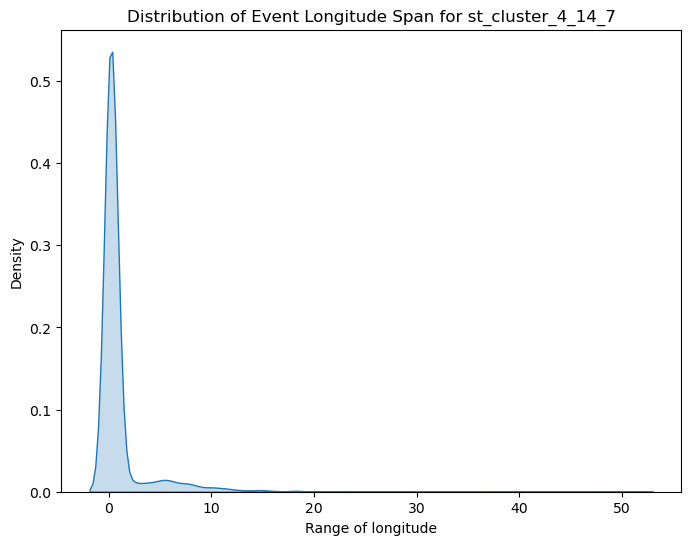


Analyzing st_cluster field: st_cluster_4_14_10


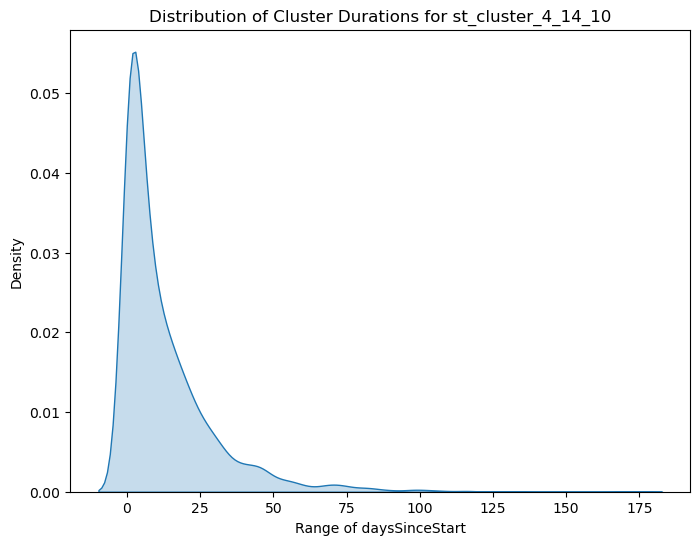

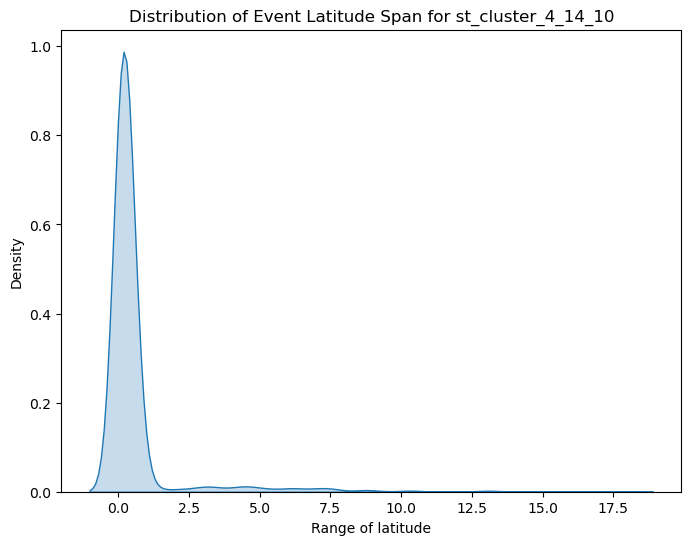

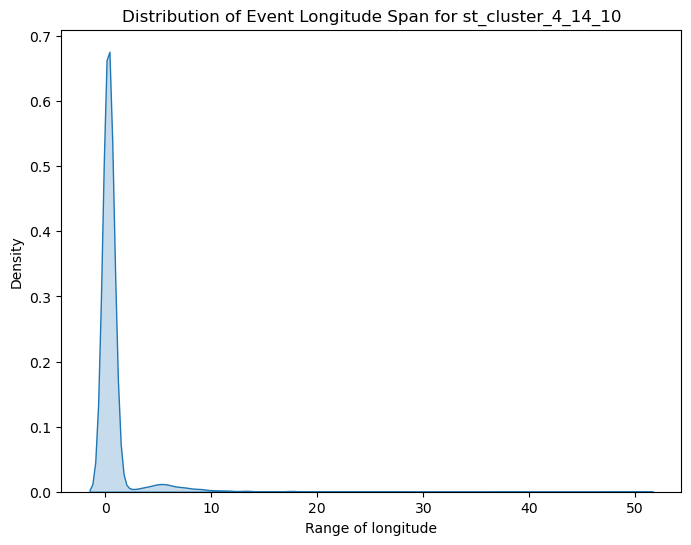


Analyzing st_cluster field: st_cluster_4_30_3


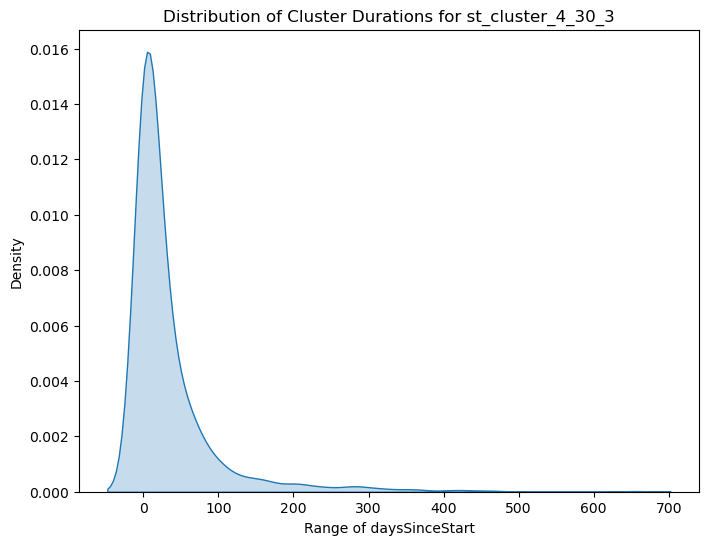

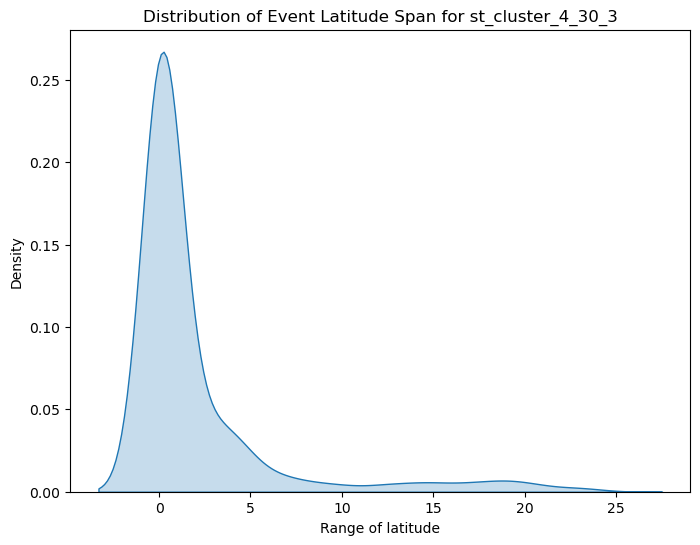

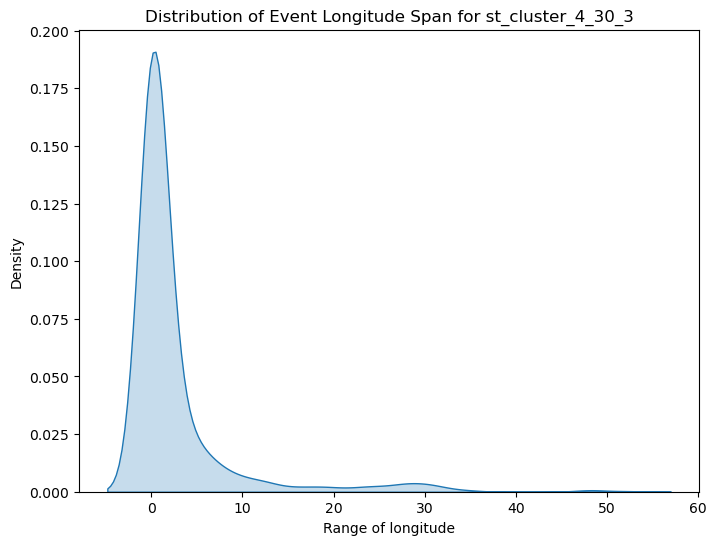


Analyzing st_cluster field: st_cluster_4_30_5


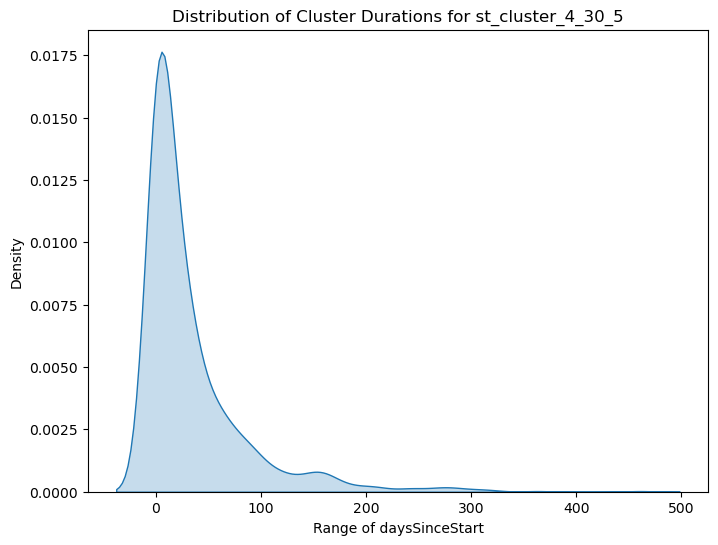

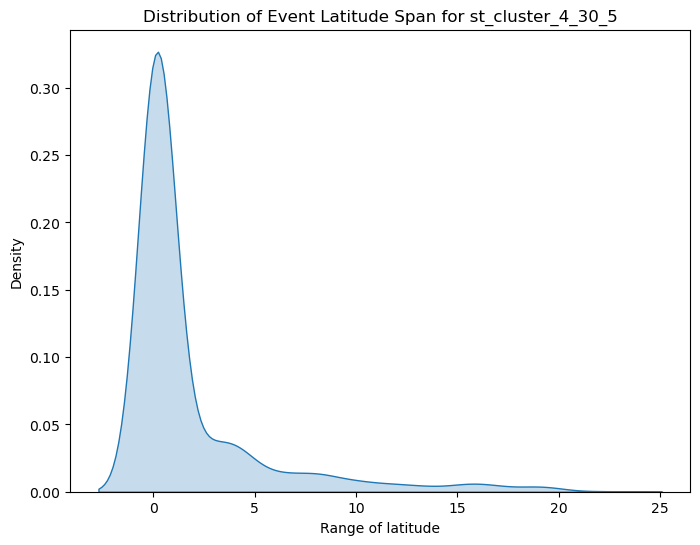

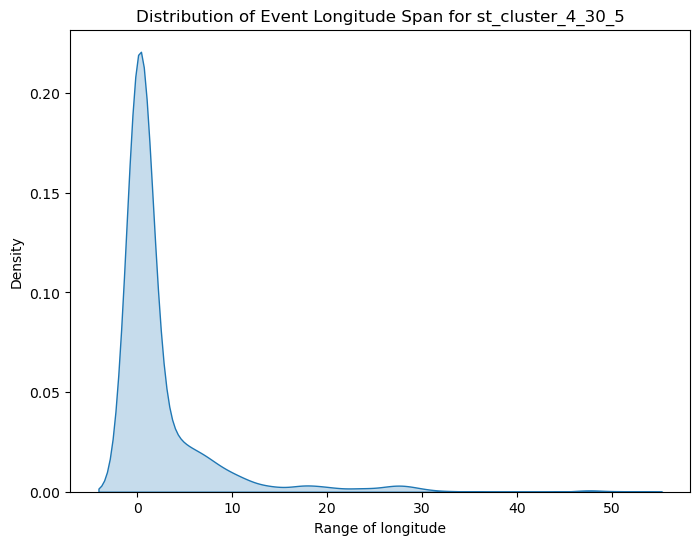


Analyzing st_cluster field: st_cluster_4_30_7


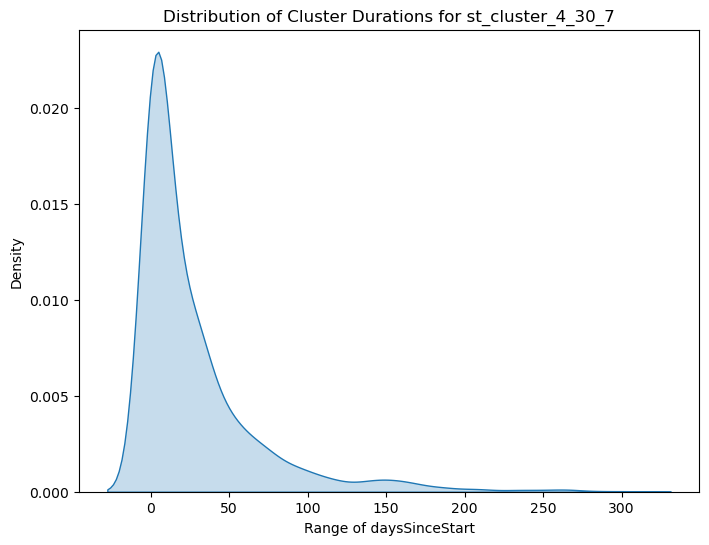

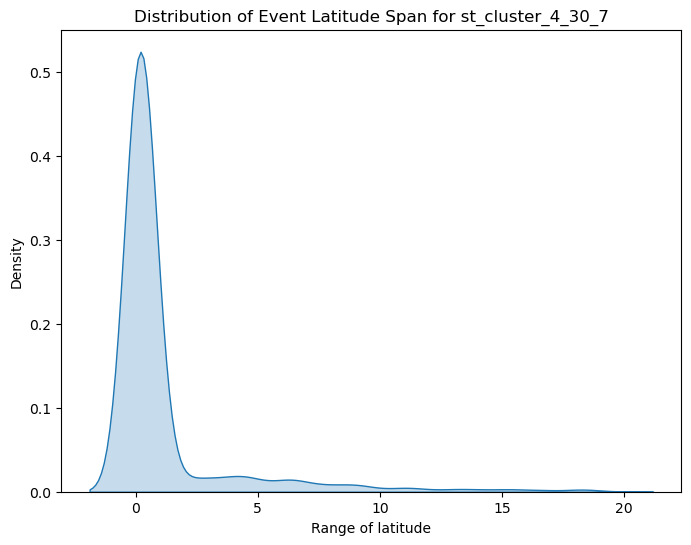

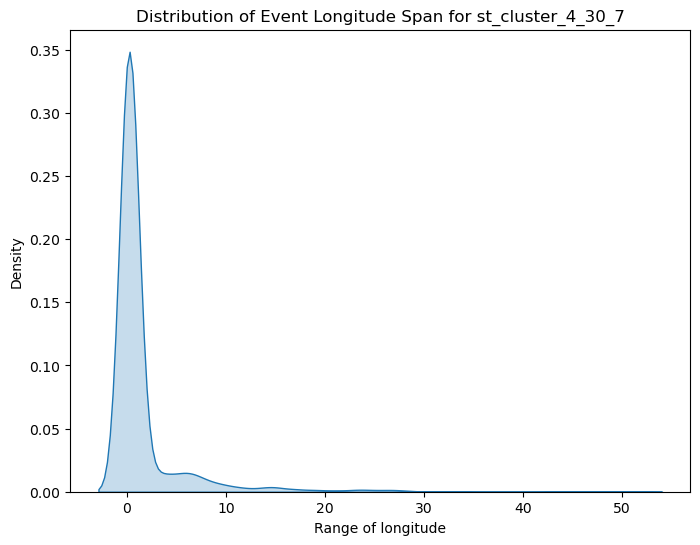


Analyzing st_cluster field: st_cluster_4_30_10


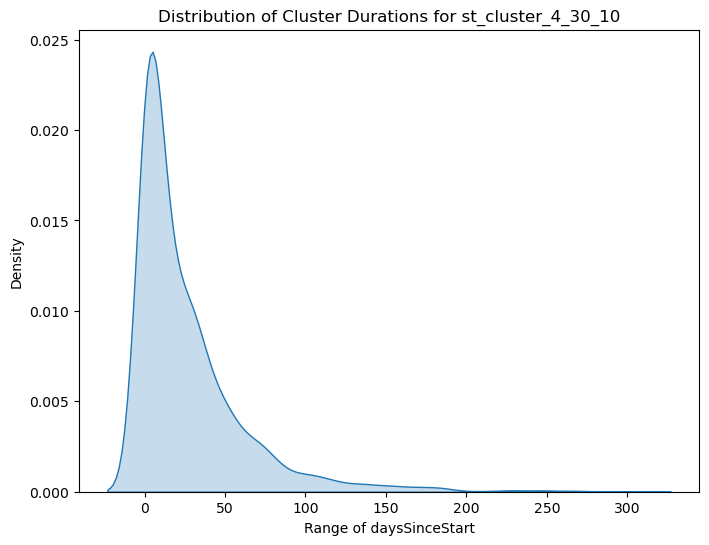

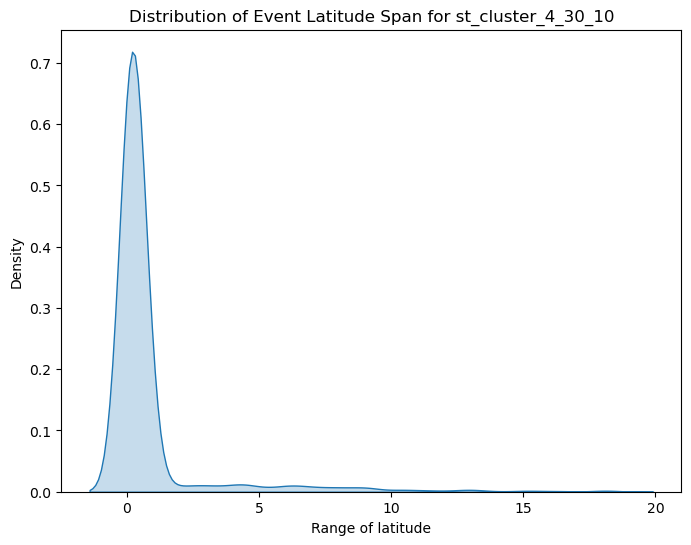

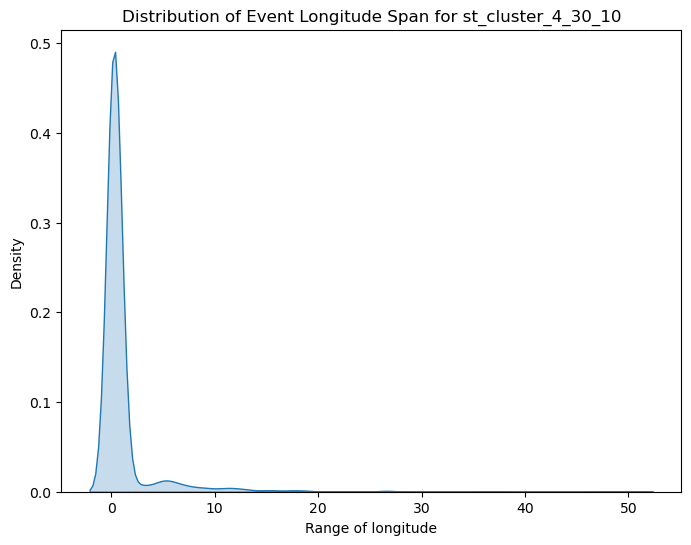

In [18]:
check_claims_grouping(claims, st_cluster_fields)

In [19]:
# Load sensitivity to optimize
sensitivity_df = pd.read_csv("Clusters/cluster_sensitivities_cl.csv")
sensitivity_df.head()

,space_thres,time_thres,num_thres,total_clusters,unclustered_percentage,avg_duration,avg_lat_span,avg_lon_span,max_duration,max_lat_span,max_lon_span,var_duration,var_lat_span,var_lon_span
0,0.5,14.0,10.0,9182,6.862273,11.997822,0.275193,0.350343,152,13.0,46.6,178.754733,0.152373,0.994911
1,0.5,14.0,3.0,16299,2.751375,8.374294,0.230528,0.286270,165,14.5,46.6,153.792345,0.169861,0.674188
2,0.5,14.0,5.0,11936,4.282228,10.200553,0.251395,0.317743,165,13.8,46.6,172.551096,0.194923,0.892281
3,0.5,14.0,7.0,10920,5.463762,11.008699,0.257888,0.328862,165,13.0,46.6,170.518514,0.147357,0.906958
4,0.5,3.0,10.0,9137,8.532744,4.231123,0.264784,0.341563,52,13.0,46.6,19.109540,0.121997,0.984653


In [20]:
# Define constraints
max_duration_limit = 90
max_lon_span_limit = 120
max_lat_span_limit = 25

# Apply constraints to filter the dataset
filtered_df = sensitivity_df[
    (sensitivity_df["max_duration"] < max_duration_limit) &
    (sensitivity_df["max_lon_span"] < max_lon_span_limit) &
    (sensitivity_df["max_lat_span"] < max_lat_span_limit)
]

# Normalize the objectives
if not filtered_df.empty:
    objectives = filtered_df[
        ["unclustered_percentage", "total_clusters"]
    ]
    scaler = MinMaxScaler()

    # Maximize certain metrics and minimize 'count_complex_cases'
    objectives["unclustered_percentage"] = 1 - scaler.fit_transform(objectives[["unclustered_percentage"]])
    objectives["total_clusters"] = scaler.fit_transform(objectives[["total_clusters"]])

    # Calculate a combined score (weighted equally)
    filtered_df["combined_score"] = objectives.sum(axis=1)

    # Find the row with the highest combined score
    best_combination = filtered_df.loc[filtered_df["combined_score"].idxmax()]

    # Display the best parameter combination and scores
    print("Best Parameter Combination and Scores:")
    print(best_combination)
else:
    print("No feasible solution under the given constraints.")

Best Parameter Combination and Scores:
space_thres                   0.500000
time_thres                    3.000000
num_thres                     3.000000
total_clusters            18658.000000
unclustered_percentage        3.944853
avg_duration                  2.830645
avg_lat_span                  0.205686
avg_lon_span                  0.257104
max_duration                 62.000000
max_lat_span                 14.500000
max_lon_span                 46.600000
var_duration                 17.059751
var_lat_span                  0.131610
var_lon_span                  0.570177
combined_score                2.000000
Name: 5, dtype: float64


/tmp/ipykernel_5339/2275503909.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  objectives["unclustered_percentage"] = 1 - scaler.fit_transform(objectives[["unclustered_percentage"]])
/tmp/ipykernel_5339/2275503909.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  objectives["total_clusters"] = scaler.fit_transform(objectives[["total_clusters"]])
/tmp/ipykernel_5339/2275503909.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

In [21]:
"""
# Parameters for ST_DBSCAN
if best_combination['space_thres'] != 0.5:
    space_thres = int(best_combination['space_thres']) # Spatial threshold
time_thres = int(best_combination['time_thres'])   # Temporal threshold
num_thres = int(best_combination['num_thres'])    # Minimum number of points to form a cluster
"""

space_thres = 3 # Spatial threshold
time_thres = 5  # Temporal threshold
num_thres = 7 # Minimum number of points to form a cluster

var = f'st_cluster_{space_thres}_{time_thres}_{num_thres}'

In [22]:
# Temporal clustering for each county
unique_counties = claims['countyCode'].unique()
claims['temporal_cluster'] = -1

for county in unique_counties:
    start_time = time.time()
    county_data = claims[claims['countyCode'] == county]
    db = DBSCAN(eps=time_thres, min_samples=num_thres, metric='euclidean')
    temporal_labels = db.fit_predict(county_data[['daysSinceStart']])
    claims.loc[county_data.index, 'temporal_cluster'] = temporal_labels
    end_time = time.time()
    print(f"Processed county {county} in {end_time - start_time:.2f} seconds.")

Processed county 17189 in 0.00 seconds.
Processed county 5119 in 0.01 seconds.
Processed county 55105 in 0.00 seconds.
Processed county 22005 in 0.09 seconds.
Processed county 53065 in 0.00 seconds.
Processed county 35027 in 0.00 seconds.
Processed county 21071 in 0.01 seconds.
Processed county 48221 in 0.00 seconds.
Processed county 4005 in 0.00 seconds.
Processed county 29081 in 0.00 seconds.
Processed county 37007 in 0.00 seconds.
Processed county 1121 in 0.00 seconds.
Processed county 48427 in 0.00 seconds.
Processed county 19037 in 0.00 seconds.
Processed county 12129 in 0.01 seconds.
Processed county 46115 in 0.00 seconds.
Processed county 48441 in 0.01 seconds.
Processed county 24037 in 0.01 seconds.
Processed county 48231 in 0.01 seconds.
Processed county 27049 in 0.00 seconds.
Processed county 19009 in 0.00 seconds.
Processed county 17035 in 0.00 seconds.
Processed county 19069 in 0.00 seconds.
Processed county 40047 in 0.00 seconds.
Processed county 37177 in 0.01 seconds.
Pro

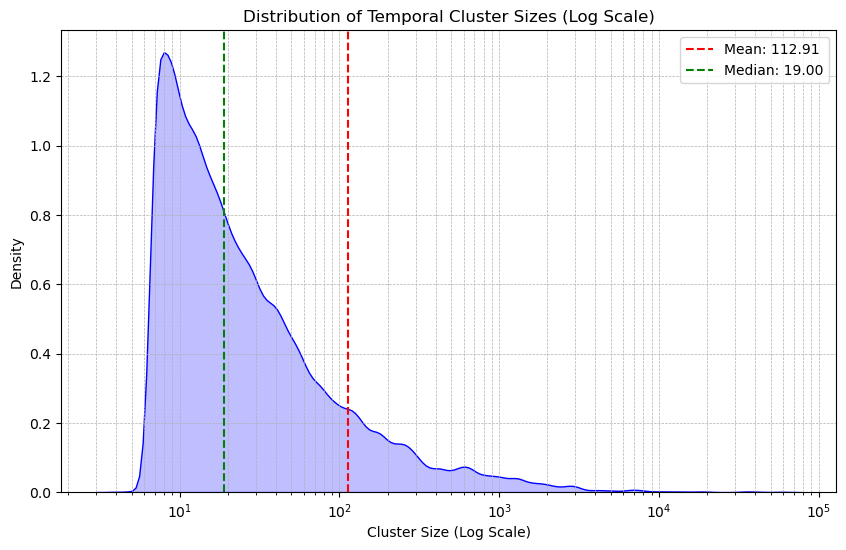

In [23]:
cluster_sizes = claims[claims['temporal_cluster'] != -1].groupby(['countyCode', 'temporal_cluster']).size()
mean_size = cluster_sizes.mean()
median_size = cluster_sizes.median()

plt.figure(figsize=(10, 6))
sns.kdeplot(cluster_sizes, fill=True, log_scale=True, bw_adjust=0.5, color='blue')
plt.axvline(mean_size, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_size:.2f}')
plt.axvline(median_size, color='green', linestyle='--', linewidth=1.5, label=f'Median: {median_size:.2f}')
plt.title("Distribution of Temporal Cluster Sizes (Log Scale)")
plt.xlabel("Cluster Size (Log Scale)")
plt.ylabel("Density")
plt.legend()
plt.grid(True, which="both", linestyle='--', linewidth=0.5)
plt.show()

In [24]:
# Print largest 10 clusters by size
largest_clusters = cluster_sizes.sort_values(ascending=False).head(20)
print("Largest 20 Temporal Clusters by Size:")
for (county, cluster), size in largest_clusters.items():
    cluster_data = claims[(claims['countyCode'] == county) & (claims['temporal_cluster'] == cluster)]
    cluster_date_mode = cluster_data['dateOfLoss'].mode()[0]
    cluster_date_median = cluster_data['daysSinceStart'].median()
    cluster_lat_median = cluster_data['latitude'].median()
    cluster_lon_median = cluster_data['longitude'].median()
    print(f"County: {county}, Cluster: {cluster}, Size: {size}, Mode Date: {cluster_date_mode}, Median Date: {cluster_date_median}, Lat: {cluster_lat_median}, Lon: {cluster_lon_median}")

Largest 20 Temporal Clusters by Size:
County: 22071, Cluster: 1, Size: 58665, Mode Date: 2005-08-29, Median Date: 9736.0, Lat: 30.0, Lon: -90.1
County: 48201, Cluster: 1, Size: 42094, Mode Date: 2017-08-27, Median Date: 14117.0, Lat: 29.8, Lon: -95.4
County: 22051, Cluster: 0, Size: 36221, Mode Date: 2005-08-29, Median Date: 9736.0, Lat: 30.0, Lon: -90.2
County: 34029, Cluster: 0, Size: 34576, Mode Date: 2012-10-29, Median Date: 12354.0, Lat: 39.9, Lon: -74.1
County: 48167, Cluster: 0, Size: 19796, Mode Date: 2008-09-13, Median Date: 10847.0, Lat: 29.3, Lon: -94.8
County: 48201, Cluster: 4, Size: 18345, Mode Date: 2001-06-09, Median Date: 8194.0, Lat: 29.8, Lon: -95.4
County: 22087, Cluster: 1, Size: 15786, Mode Date: 2005-08-29, Median Date: 9736.0, Lat: 29.9, Lon: -90.0
County: 22051, Cluster: 1, Size: 13691, Mode Date: 1995-05-08, Median Date: 5970.0, Lat: 30.0, Lon: -90.2
County: 22103, Cluster: 10, Size: 12467, Mode Date: 2005-08-29, Median Date: 9736.0, Lat: 30.3, Lon: -89.8
Coun

In [25]:
# Step 2: Spatio-Temporal Clustering using st-dbscan
# Calculate mean time for each temporal cluster
temporal_clusters = claims[claims['temporal_cluster'] != -1]
grouped_clusters = temporal_clusters.groupby(['countyCode', 'temporal_cluster']).agg({
    'latitude': 'median',
    'longitude': 'median',
    'daysSinceStart': 'median'
}).reset_index()

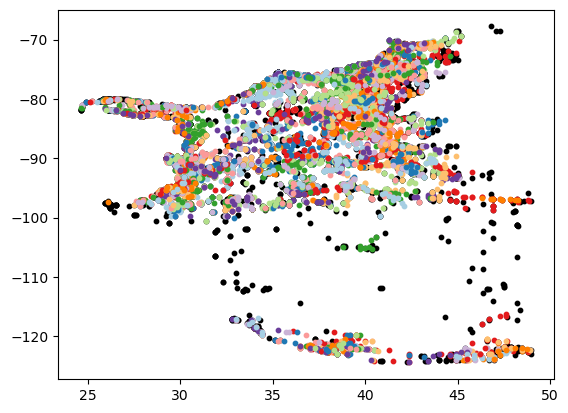

In [26]:
# Spatio-Temporal Clustering using 7-day temporal and 1-degree spatial thresholds
data = grouped_clusters[['daysSinceStart', 'latitude', 'longitude']].to_numpy()

st_dbscan = ST_DBSCAN(eps1=space_thres, eps2=time_thres, min_samples=num_thres)
st_dbscan.fit(data)
grouped_clusters['st_cluster'] = st_dbscan.labels

plot(data, st_dbscan.labels)

In [27]:
print(f"Total clusters extracted: {grouped_clusters['st_cluster'].max()}")
print(f"Percent unclustered: {len(grouped_clusters[grouped_clusters['st_cluster']==-1])/len(grouped_clusters)*100}%")

Total clusters extracted: 370
Percent unclustered: 36.4043082021541%


In [28]:
# Get the maximum spatiotemporal cluster label
max_st_cluster = grouped_clusters['st_cluster'].max()

# Identify temporal clusters that are unclustered in spatiotemporal clustering
unclustered_temporal_clusters = grouped_clusters[
    grouped_clusters['st_cluster'] == -1
]

# Assign new unique cluster IDs to these unclustered temporal clusters
unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))

# Create a mapping of (countyCode, temporal_cluster) -> new cluster ID
cluster_mapping = grouped_clusters.set_index(['countyCode', 'temporal_cluster'])[
    'st_cluster'
].to_dict()

# Add the new clusters for unclustered temporal clusters
cluster_mapping.update(unclustered_temporal_clusters.set_index(['countyCode', 'temporal_cluster'])['new_cluster'].to_dict())

# Map clusters back to the claims data
claims['st_cluster'] = claims.apply(
    lambda row: cluster_mapping.get((row['countyCode'], row['temporal_cluster']), -1), axis=1
)

/tmp/ipykernel_5339/572621384.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unclustered_temporal_clusters['new_cluster'] = range(max_st_cluster + 1, max_st_cluster + 1 + len(unclustered_temporal_clusters))


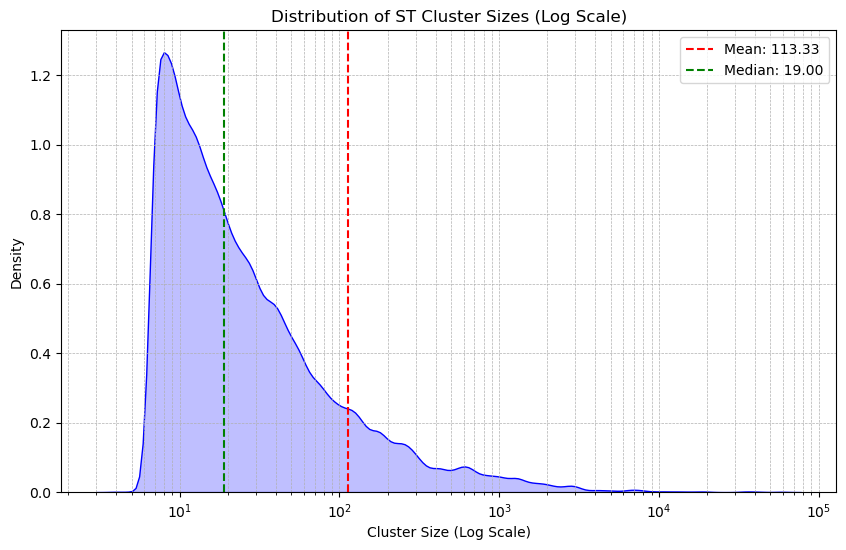

In [29]:
cluster_sizes = claims[claims['st_cluster'] != -1].groupby(['countyCode', 'st_cluster']).size()
mean_size = cluster_sizes.mean()
median_size = cluster_sizes.median()

plt.figure(figsize=(10, 6))
sns.kdeplot(cluster_sizes, fill=True, log_scale=True, bw_adjust=0.5, color='blue')
plt.axvline(mean_size, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_size:.2f}')
plt.axvline(median_size, color='green', linestyle='--', linewidth=1.5, label=f'Median: {median_size:.2f}')
plt.title("Distribution of ST Cluster Sizes (Log Scale)")
plt.xlabel("Cluster Size (Log Scale)")
plt.ylabel("Density")
plt.legend()
plt.grid(True, which="both", linestyle='--', linewidth=0.5)
plt.show()

/tmp/ipykernel_5339/406270746.py:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cluster_stats[metric], shade=True, label=f"{metric} distribution")


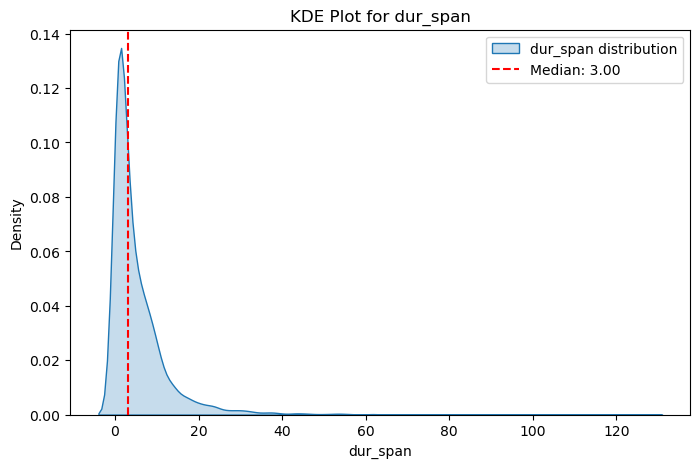

/tmp/ipykernel_5339/406270746.py:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cluster_stats[metric], shade=True, label=f"{metric} distribution")


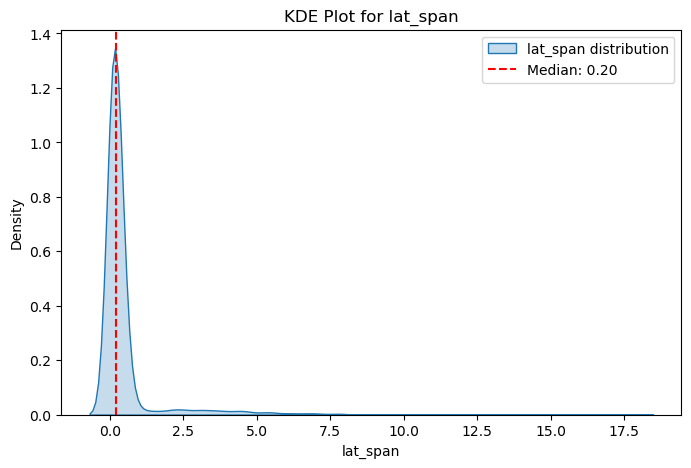

/tmp/ipykernel_5339/406270746.py:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cluster_stats[metric], shade=True, label=f"{metric} distribution")


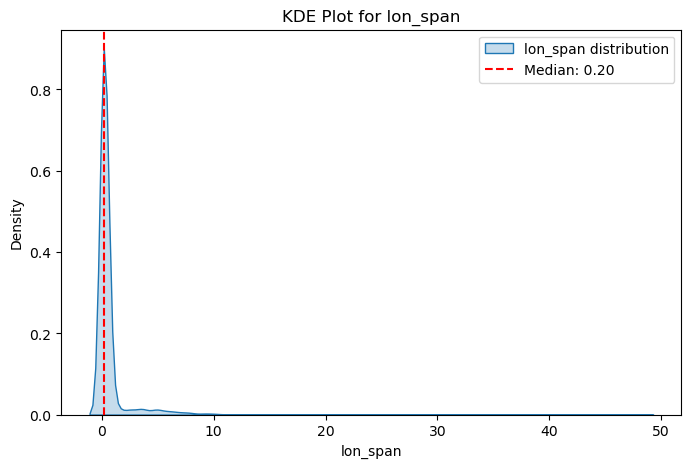

dur_span: Max = 127.00 (Cluster 146), Average = 5.25
lat_span: Max = 17.80 (Cluster 5), Average = 0.49
lon_span: Max = 48.20 (Cluster 103), Average = 0.65


In [30]:
analyze_cluster_distributions(claims)

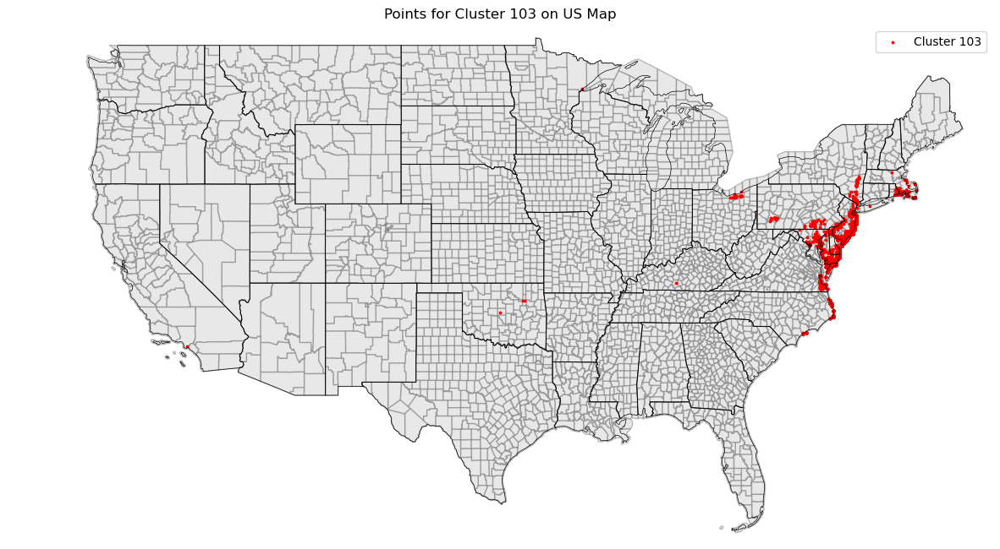

In [37]:
# Load the county shapefile
county_shapefile_path = '../Local_Data/Geospatial/tl_2019_us_county.shp'
gdf_counties = gpd.read_file(county_shapefile_path)

# Load the shapefile for US states
state_shapefile_path = '../Local_Data/Geospatial/cb_2018_us_state_20m.shp'
gdf_states = gpd.read_file(state_shapefile_path)

plot_cluster(103, var, claims, gdf_counties, gdf_states)

In [32]:
# Save the result
claims.to_csv(f"{temp_folder}/clustered_claims.csv", index=False)

print("Clustering complete. Output saved to 'clustered_claims.csv'.")

Clustering complete. Output saved to 'clustered_claims.csv'.


In [33]:
# Print clusters with median daysSinceStart equal to 9736.0 (Katrina)
specific_clusters = grouped_clusters[grouped_clusters['daysSinceStart'] == 9736.0]

In [34]:
specific_clusters

,countyCode,temporal_cluster,latitude,longitude,daysSinceStart,st_cluster
6,1003,4,30.2,-87.8,9736.0,4
142,1097,5,30.5,-88.1,9736.0,4
1098,12011,40,26.2,-80.2,9736.0,-1
1236,12033,7,30.3,-87.1,9736.0,4
1582,12091,12,30.4,-86.5,9736.0,4
1779,12113,9,30.4,-86.9,9736.0,4
1891,12131,11,30.4,-86.4,9736.0,4
3582,22005,12,30.2,-90.9,9736.0,4
3601,22007,1,30.0,-91.2,9736.0,4
3817,22033,23,30.5,-91.1,9736.0,4
